# Bert baseline for POLAR

## Introduction

In this part of the starter notebook, we will take you through the process of all three Subtasks.

## Subtask 1 - Polarization detection

This is a binary classification to determine whether a post contains polarized content (Polarized or Not Polarized).

## 1.1 English polarization

### 1.1.1 libraries packages


Imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import pandas as pd

from sklearn.metrics import recall_score, precision_score, f1_score
import numpy as np

import torch

from sklearn.metrics import f1_score

from transformers import (
    AutoTokenizer,
    AutoConfig,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments,
    DataCollatorWithPadding
)
from torch.utils.data import Dataset

In [ ]:
!unzip /content/drive/MyDrive/starter.zip

Archive:  /content/drive/MyDrive/starter.zip
   creating: starter/
  inflating: starter/starter.ipynb   
   creating: starter/__MACOSX/
  inflating: starter/__MACOSX/._starter.ipynb  
  inflating: starter/app.py          


In [ ]:
!unzip /content/drive/MyDrive/dev_phase.zip

Archive:  /content/drive/MyDrive/dev_phase.zip
   creating: subtask1/
   creating: subtask1/dev/
  inflating: subtask1/dev/nep.csv    
  inflating: subtask1/dev/ita.csv    
  inflating: subtask1/dev/pol.csv    
  inflating: subtask1/dev/rus.csv    
  inflating: subtask1/dev/tel.csv    
  inflating: subtask1/dev/hin.csv    
  inflating: subtask1/dev/hau.csv    
  inflating: subtask1/dev/pan.csv    
  inflating: subtask1/dev/ori.csv    
  inflating: subtask1/dev/spa.csv    
  inflating: subtask1/dev/deu.csv    
  inflating: subtask1/dev/fas.csv    
  inflating: subtask1/dev/arb.csv    
  inflating: subtask1/dev/ben.csv    
  inflating: subtask1/dev/amh.csv    
  inflating: subtask1/dev/khm.csv    
  inflating: subtask1/dev/tur.csv    
  inflating: subtask1/dev/zho.csv    
  inflating: subtask1/dev/eng.csv    
  inflating: subtask1/dev/swa.csv    
  inflating: subtask1/dev/urd.csv    
  inflating: subtask1/dev/mya.csv    
   creating: subtask1/train/
  inflating: subtask1/train/nep.csv  


In [ ]:
import wandb

# Disable wandb logging for this script
wandb.init(mode="disabled")

## 2. Subtask 2: Polarization Type Classification
Multi-label classification to identify the target of polarization as one of the following categories: Gender/Sexual, Political, Religious, Racial/Ethnic, or Other.
For this task we will load the data for subtask 2.

In [ ]:
import pandas as pd

from sklearn.metrics import recall_score, precision_score, f1_score
import numpy as np

import torch

from sklearn.metrics import f1_score

from transformers import (
    AutoTokenizer,
    AutoConfig,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments,
    DataCollatorWithPadding
)
from torch.utils.data import Dataset

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from collections import Counter
import re
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import warnings

#2.1 English

## 2.1.1  Data exploration

In [ ]:
train_initial= pd.read_csv('subtask2/train/eng.csv')
val = pd.read_csv('subtask2/train/eng.csv')
train_initial.head()

,id,text,political,racial/ethnic,religious,gender/sexual,other
0,eng_973938b90b0ff5d87d35a582f83f5c89,is defending imperialism in the dnd chat,0,0,0,0,0
1,eng_07dfd4600426caca6e2c5883fcbea9ea,Still playing with this. I am now following Ra...,0,0,0,0,0
2,eng_f14519ff2302b6cd47712073f13bc461,.senate.gov Theres 3 groups out there Republic...,0,0,0,0,0
3,eng_e48b7e7542faafa544ac57b64bc80daf,"""ABC MD, David Anderson, said the additional f...",0,0,0,0,0
4,eng_7c581fb77bce8033aeba3d6dbd6273eb,"""bad people"" I have some conservative values s...",0,0,0,0,0


In [ ]:
# Afficher les premières lignes
print("Premières lignes du dataset:")
print(train_initial.head())

print("\n" + "="*80)
print("Informations sur le dataset:")
print(train_initial.info())

print("\n" + "="*80)
print("Forme du dataset:")
print(f"Nombre de lignes: {train_initial.shape[0]}")
print(f"Nombre de colonnes: {train_initial.shape[1]}")

print("\n" + "="*80)
print("Noms des colonnes:")
print(train_initial.columns.tolist())

print("\n" + "="*80)
print("Valeurs manquantes:")
print(train_initial.isnull().sum())

print("\n" + "="*80)
print("Statistiques descriptives:")
print(train_initial.describe())

Premières lignes du dataset:
                                     id  \
0  eng_973938b90b0ff5d87d35a582f83f5c89   
1  eng_07dfd4600426caca6e2c5883fcbea9ea   
2  eng_f14519ff2302b6cd47712073f13bc461   
3  eng_e48b7e7542faafa544ac57b64bc80daf   
4  eng_7c581fb77bce8033aeba3d6dbd6273eb   

                                                text  political  \
0           is defending imperialism in the dnd chat          0   
1  Still playing with this. I am now following Ra...          0   
2  .senate.gov Theres 3 groups out there Republic...          0   
3  "ABC MD, David Anderson, said the additional f...          0   
4  "bad people" I have some conservative values s...          0   

   racial/ethnic  religious  gender/sexual  other  
0              0          0              0      0  
1              0          0              0      0  
2              0          0              0      0  
3              0          0              0      0  
4              0          0              0      0

1. DISTRIBUTION OF POLARIZATION TYPES

Absolute and relative frequencies:
political           : 1150 (35.69%)
racial/ethnic       :  281 ( 8.72%)
other               :  126 ( 3.91%)
religious           :  112 ( 3.48%)
gender/sexual       :   72 ( 2.23%)


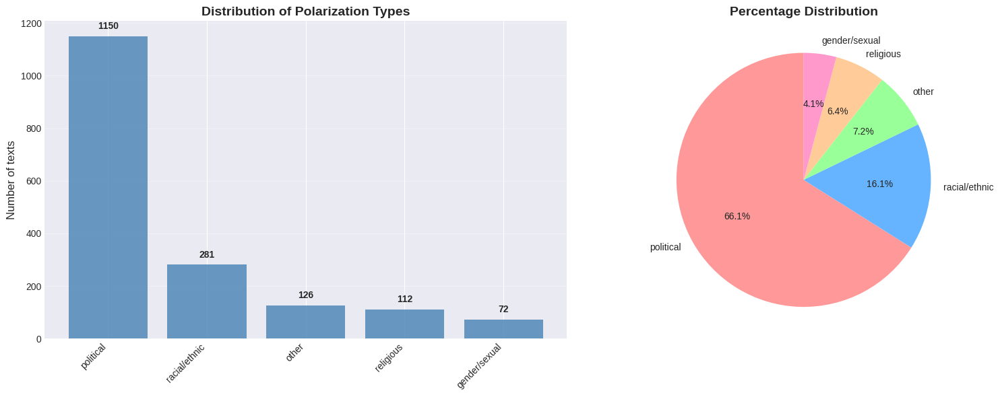

In [ ]:

warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (15, 8)

print("="*80)
print("1. DISTRIBUTION OF POLARIZATION TYPES")
print("="*80)

label_cols = ['political', 'racial/ethnic', 'religious', 'gender/sexual', 'other']

label_counts = train_initial[label_cols].sum().sort_values(ascending=False)
label_percentages = (label_counts / len(train_initial) * 100).round(2)

print("\nAbsolute and relative frequencies:")
for label, count in label_counts.items():
    pct = label_percentages[label]
    print(f"{label:20s}: {count:4d} ({pct:5.2f}%)")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].bar(range(len(label_counts)), label_counts.values, color='steelblue', alpha=0.8)
axes[0].set_xticks(range(len(label_counts)))
axes[0].set_xticklabels(label_counts.index, rotation=45, ha='right')
axes[0].set_ylabel('Number of texts', fontsize=12)
axes[0].set_title('Distribution of Polarization Types', fontsize=14, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

for i, v in enumerate(label_counts.values):
    axes[0].text(i, v + 20, str(v), ha='center', va='bottom', fontweight='bold')

colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#ff99cc']
axes[1].pie(label_counts.values, labels=label_counts.index, autopct='%1.1f%%',
            startangle=90, colors=colors)
axes[1].set_title('Percentage Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


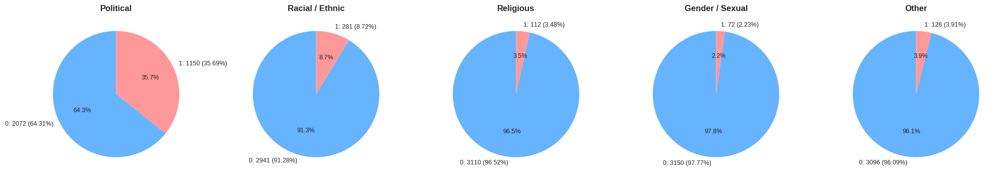

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')


plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

label_cols = ['political', 'racial/ethnic', 'religious', 'gender/sexual', 'other']
colors_map = {0: '#66b3ff', 1: '#ff9999'}

# -----------------------------
# Create subplots (1 row)
# -----------------------------
fig, axes = plt.subplots(
    1, len(label_cols),
    figsize=(4 * len(label_cols), 5)
)



for ax, label in zip(axes, label_cols):
    label_counts = train_initial[label].value_counts().sort_index()

    # Ensure both classes exist
    label_counts = label_counts.reindex([0, 1], fill_value=0)

    total = label_counts.sum()
    neg, pos = label_counts[0], label_counts[1]

    pct_neg = round(neg / total * 100, 2)
    pct_pos = round(pos / total * 100, 2)



    sizes = [neg, pos]
    labels_pie = [
        f'0: {neg} ({pct_neg}%)',
        f'1: {pos} ({pct_pos}%)'
    ]
    colors = [colors_map[0], colors_map[1]]

    ax.pie(
        sizes,
        labels=labels_pie,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        textprops={'fontsize': 9}
    )

    ax.set_title(label.replace('/', ' / ').title(), fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('Distribution_target_subtask_2.pdf')
plt.show()


## independance test

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt

label_cols = ['political', 'racial/ethnic', 'religious', 'gender/sexual', 'other']

results = []

for i in range(len(label_cols)):
    for j in range(i + 1, len(label_cols)):
        label_i = label_cols[i]
        label_j = label_cols[j]

        # Table de contingence
        contingency_table = pd.crosstab(
            train_initial[label_i],
            train_initial[label_j]
        )

        # Test Khi-deux
        chi2, p, dof, expected = chi2_contingency(contingency_table)

        results.append({
            'Label 1': label_i,
            'Label 2': label_j,
            'Chi2': chi2,
            'p-value': p,
            'DoF': dof
        })

# Résultats sous forme de DataFrame
chi2_results = pd.DataFrame(results).sort_values('p-value')

print(chi2_results)


         Label 1        Label 2        Chi2        p-value  DoF
4  racial/ethnic      religious  517.448507  1.519342e-114    1
0      political  racial/ethnic  480.580628  1.597352e-106    1
3      political          other  199.873709   2.225315e-45    1
1      political      religious  162.628860   3.015104e-37    1
2      political  gender/sexual  108.151701   2.489735e-25    1
5  racial/ethnic  gender/sexual   36.088793   1.885280e-09    1
6  racial/ethnic          other   35.552624   2.482525e-09    1
9  gender/sexual          other   35.457139   2.607250e-09    1
7      religious  gender/sexual   10.573281   1.147339e-03    1
8      religious          other    6.453355   1.107430e-02    1


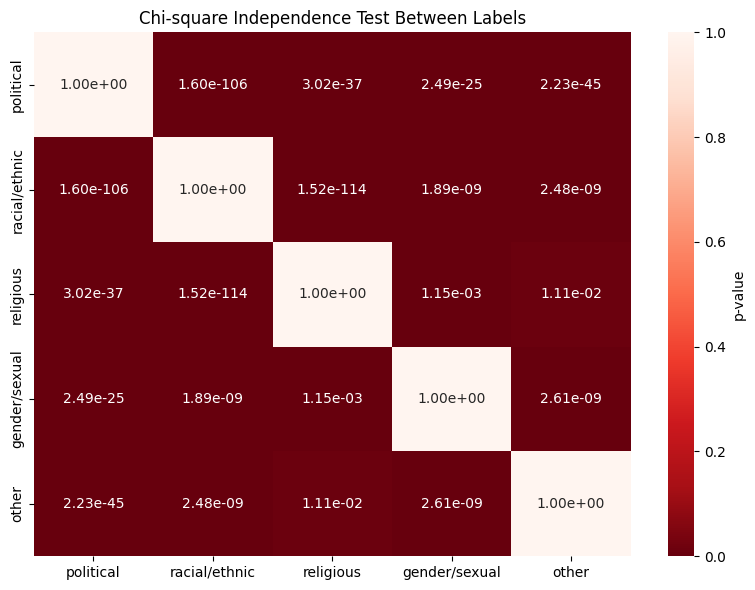

In [ ]:
# Création d'une matrice symétrique des p-values
pval_matrix = pd.DataFrame(
    np.ones((len(label_cols), len(label_cols))),
    index=label_cols,
    columns=label_cols
)

for _, row in chi2_results.iterrows():
    pval_matrix.loc[row['Label 1'], row['Label 2']] = row['p-value']
    pval_matrix.loc[row['Label 2'], row['Label 1']] = row['p-value']

plt.figure(figsize=(8, 6))
sns.heatmap(
    pval_matrix,
    annot=True,
    fmt=".2e",
    cmap="Reds_r",
    cbar_kws={'label': 'p-value'}
)

plt.title("Chi-square Independence Test Between Labels")
plt.tight_layout()
plt.savefig("chi2_label_independence_substack2_english.pdf")
plt.show()



2. MULTI-LABEL ANALYSIS

Distribution of number of labels per text:
0 label(s): 2047 texts (63.53%)
1 label(s):  749 texts (23.25%)
2 label(s):  299 texts ( 9.28%)
3 label(s):  115 texts ( 3.57%)
4 label(s):   11 texts ( 0.34%)
5 label(s):    1 texts ( 0.03%)


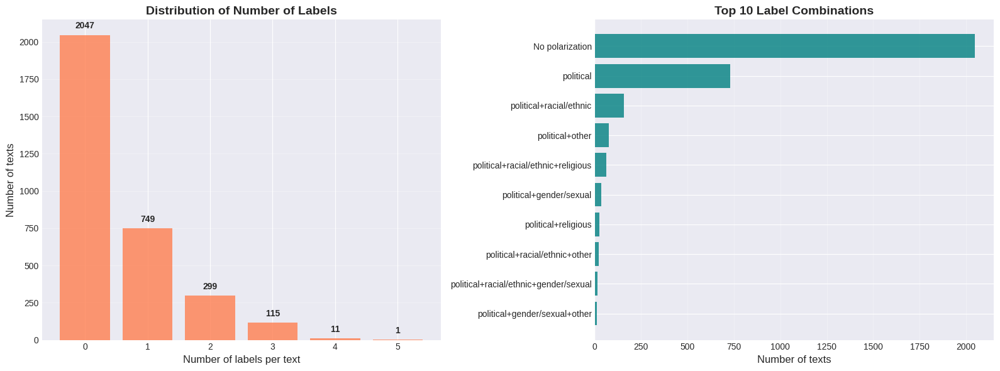

In [ ]:

print("\n" + "="*80)
print("2. MULTI-LABEL ANALYSIS")
print("="*80)

train_initial['num_labels'] = train_initial[label_cols].sum(axis=1)

print("\nDistribution of number of labels per text:")
label_dist = train_initial['num_labels'].value_counts().sort_index()
for num, count in label_dist.items():
    pct = count / len(train_initial) * 100
    print(f"{num} label(s): {count:4d} texts ({pct:5.2f}%)")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].bar(label_dist.index, label_dist.values, color='coral', alpha=0.8)
axes[0].set_xlabel('Number of labels per text', fontsize=12)
axes[0].set_ylabel('Number of texts', fontsize=12)
axes[0].set_title('Distribution of Number of Labels', fontsize=14, fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)

for i, v in zip(label_dist.index, label_dist.values):
    axes[0].text(i, v + 30, str(v), ha='center', va='bottom', fontweight='bold')

train_initial['label_combination'] = train_initial[label_cols].apply(
    lambda row: '+'.join([col for col, val in row.items() if val == 1]) or 'No polarization',
    axis=1
)

top_combinations = train_initial['label_combination'].value_counts().head(10)
axes[1].barh(range(len(top_combinations)), top_combinations.values, color='teal', alpha=0.8)
axes[1].set_yticks(range(len(top_combinations)))
axes[1].set_yticklabels(top_combinations.index, fontsize=10)
axes[1].set_xlabel('Number of texts', fontsize=12)
axes[1].set_title('Top 10 Label Combinations', fontsize=14, fontweight='bold')
axes[1].grid(axis='x', alpha=0.3)
axes[1].invert_yaxis()

plt.tight_layout()
plt.savefig('Distribution_text_combinaisons_subtask_2.pdf')
plt.show()



3. TEXT LENGTH ANALYSIS


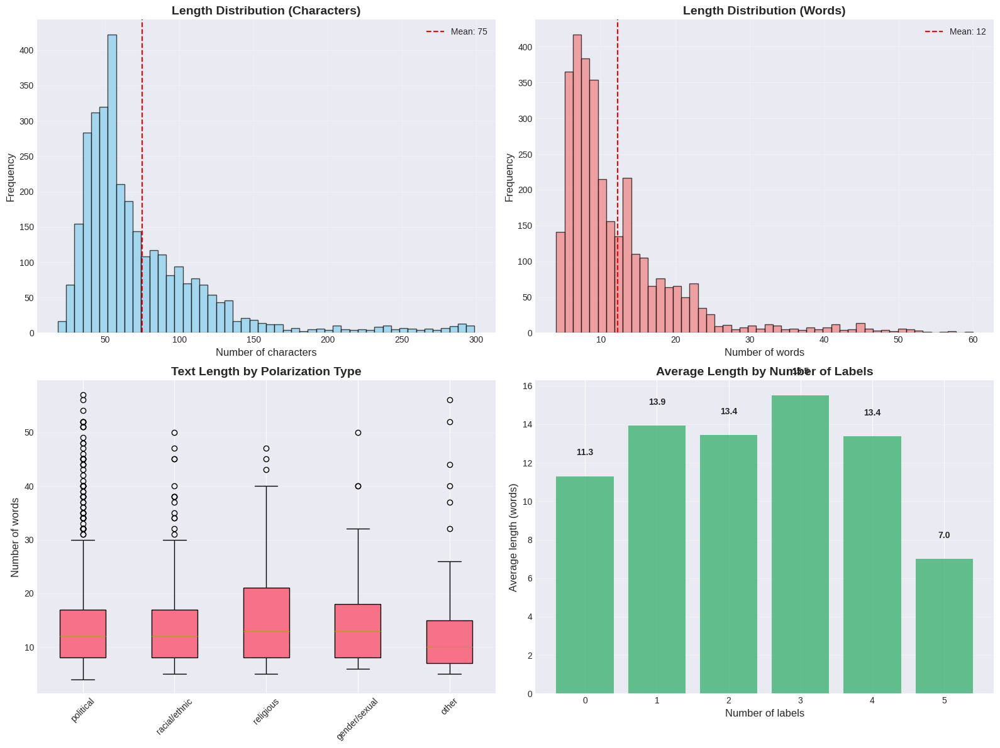

In [ ]:

print("\n" + "="*80)
print("3. TEXT LENGTH ANALYSIS")
print("="*80)

train_initial['text_length'] = train_initial['text'].str.len()
train_initial['word_count'] = train_initial['text'].str.split().str.len()


fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes[0, 0].hist(train_initial['text_length'], bins=50, color='skyblue', alpha=0.7, edgecolor='black')
axes[0, 0].set_xlabel('Number of characters', fontsize=12)
axes[0, 0].set_ylabel('Frequency', fontsize=12)
axes[0, 0].set_title('Length Distribution (Characters)', fontsize=14, fontweight='bold')
axes[0, 0].axvline(train_initial['text_length'].mean(), color='red', linestyle='--',
                    label=f'Mean: {train_initial["text_length"].mean():.0f}')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

axes[0, 1].hist(train_initial['word_count'], bins=50, color='lightcoral', alpha=0.7, edgecolor='black')
axes[0, 1].set_xlabel('Number of words', fontsize=12)
axes[0, 1].set_ylabel('Frequency', fontsize=12)
axes[0, 1].set_title('Length Distribution (Words)', fontsize=14, fontweight='bold')
axes[0, 1].axvline(train_initial['word_count'].mean(), color='red', linestyle='--',
                    label=f'Mean: {train_initial["word_count"].mean():.0f}')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

data_for_box = []
labels_for_box = []
for col in label_cols:
    data_for_box.append(train_initial[train_initial[col] == 1]['word_count'])
    labels_for_box.append(col)

axes[1, 0].boxplot(data_for_box, labels=labels_for_box, patch_artist=True)
axes[1, 0].set_ylabel('Number of words', fontsize=12)
axes[1, 0].set_title('Text Length by Polarization Type', fontsize=14, fontweight='bold')
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(axis='y', alpha=0.3)

avg_length_by_labels = train_initial.groupby('num_labels')['word_count'].mean()
axes[1, 1].bar(avg_length_by_labels.index, avg_length_by_labels.values, color='mediumseagreen', alpha=0.8)
axes[1, 1].set_xlabel('Number of labels', fontsize=12)
axes[1, 1].set_ylabel('Average length (words)', fontsize=12)
axes[1, 1].set_title('Average Length by Number of Labels', fontsize=14, fontweight='bold')
axes[1, 1].grid(axis='y', alpha=0.3)

for i, v in zip(avg_length_by_labels.index, avg_length_by_labels.values):
    axes[1, 1].text(i, v + 1, f'{v:.1f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.savefig('Distribution_text_length_subtask_2.pdf')
plt.show()




5. MOST FREQUENT WORDS BY CATEGORY


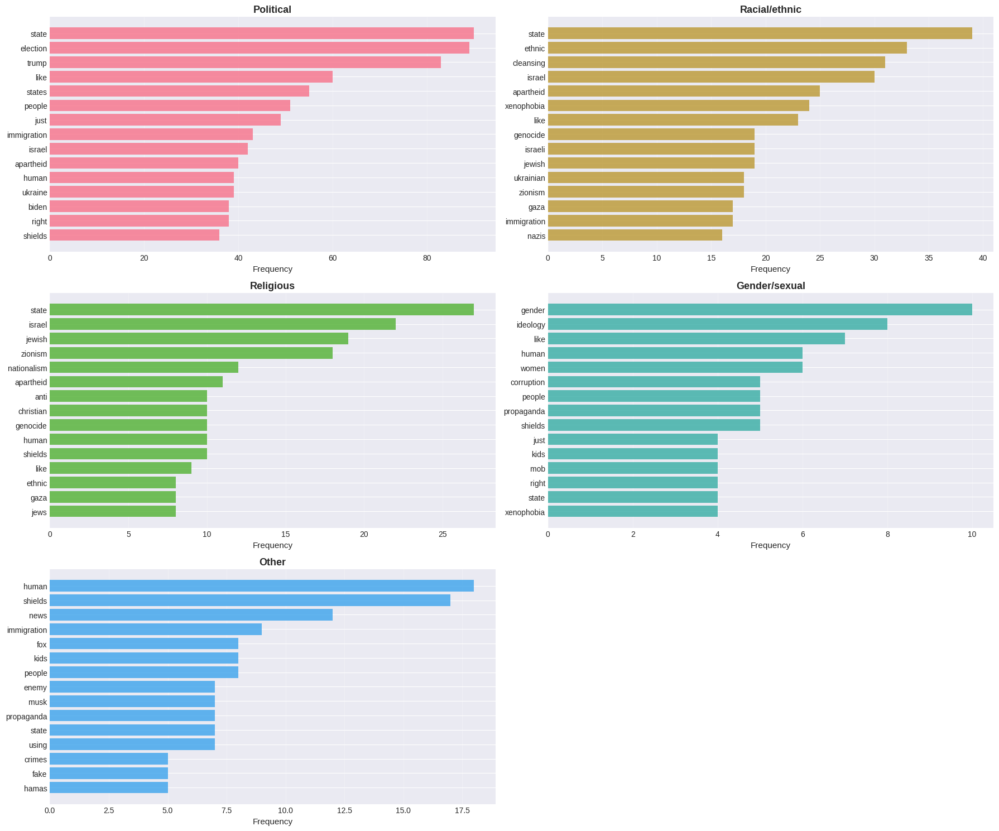

In [ ]:

print("\n" + "="*80)
print("5. MOST FREQUENT WORDS BY CATEGORY")
print("="*80)

def get_top_words(texts, n=20):
    vectorizer = CountVectorizer(max_features=n, stop_words='english',
                                  min_df=2, ngram_range=(1, 1))
    try:
        X = vectorizer.fit_transform(texts)
        word_freq = dict(zip(vectorizer.get_feature_names_out(),
                             X.toarray().sum(axis=0)))
        return sorted(word_freq.items(), key=lambda x: x[1], reverse=True)
    except:
        return []

fig, axes = plt.subplots(3, 2, figsize=(18, 15))
axes = axes.flatten()

for idx, label in enumerate(label_cols):
    texts_with_label = train_initial[train_initial[label] == 1]['text']

    if len(texts_with_label) > 0:
        top_words = get_top_words(texts_with_label, n=15)

        if top_words:
            words, counts = zip(*top_words)




            axes[idx].barh(range(len(words)), counts, color=f'C{idx}', alpha=0.8)
            axes[idx].set_yticks(range(len(words)))
            axes[idx].set_yticklabels(words, fontsize=10)
            axes[idx].set_xlabel('Frequency', fontsize=11)
            axes[idx].set_title(f'{label.capitalize()}', fontsize=13, fontweight='bold')
            axes[idx].invert_yaxis()
            axes[idx].grid(axis='x', alpha=0.3)

fig.delaxes(axes[-1])
plt.tight_layout()
plt.show()



6. WORD CLOUDS GENERATION


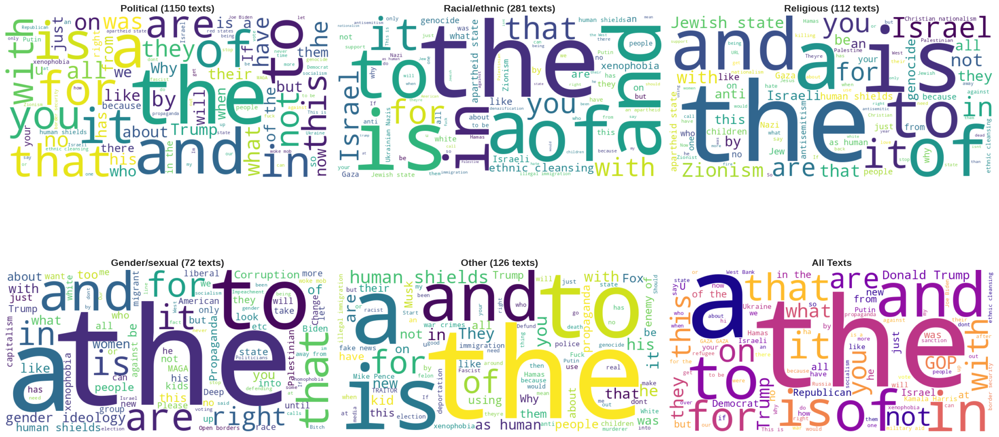

In [ ]:

print("\n" + "="*80)
print("6. WORD CLOUDS GENERATION")
print("="*80)

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for idx, label in enumerate(label_cols):
    texts_with_label = train_initial[train_initial[label] == 1]['text']

    if len(texts_with_label) > 0:
        text_combined = ' '.join(texts_with_label.values)

        wordcloud = WordCloud(width=800, height=400,
                             background_color='white',
                             stopwords='english',
                             max_words=100,
                             colormap='viridis',
                             relative_scaling=0.5).generate(text_combined)

        axes[idx].imshow(wordcloud, interpolation='bilinear')
        axes[idx].set_title(f'{label.capitalize()} ({len(texts_with_label)} texts)',
                           fontsize=14, fontweight='bold')
        axes[idx].axis('off')
    else:
        axes[idx].text(0.5, 0.5, 'No data',
                      ha='center', va='center', fontsize=16)
        axes[idx].set_title(label.capitalize(), fontsize=14, fontweight='bold')
        axes[idx].axis('off')

text_all = ' '.join(train_initial['text'].values)
wordcloud_all = WordCloud(width=800, height=400,
                          background_color='white',
                          stopwords='english',
                          max_words=100,
                          colormap='plasma').generate(text_all)

axes[-1].imshow(wordcloud_all, interpolation='bilinear')
axes[-1].set_title('All Texts', fontsize=14, fontweight='bold')
axes[-1].axis('off')

plt.tight_layout()
plt.show()



6. WORD CLOUDS GENERATION - BIGRAMS


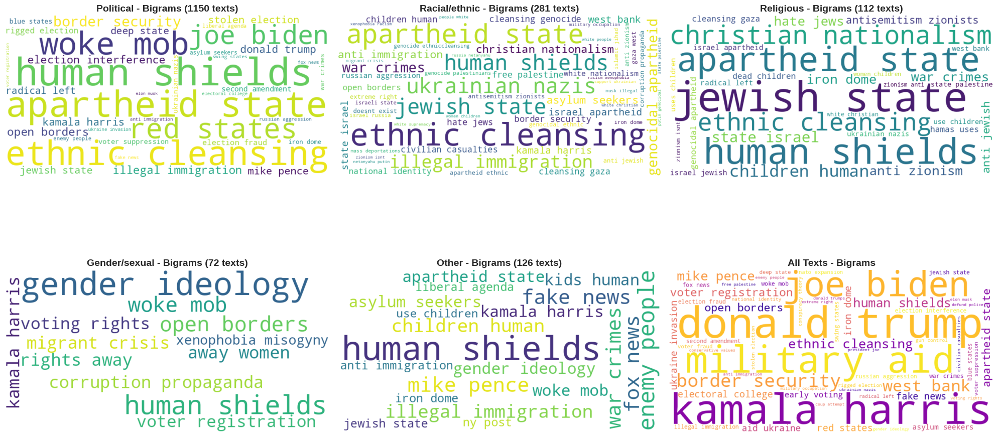

In [ ]:
print("\n" + "="*80)
print("6. WORD CLOUDS GENERATION - BIGRAMS")
print("="*80)

from wordcloud import STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer

custom_stopwords = set(STOPWORDS)
additional_stopwords = {
    'will', 'one', 'two', 'three', 'would', 'could', 'said', 'say', 'even', 'also',
    'get', 'got', 'getting', 'much', 'many', 'may', 'might', 'like', 'go', 'going',
    'make', 'made', 'take', 'know', 'think', 'see', 'want', 'come', 'way', 'time',
    'new', 'first', 'last', 'good', 'great', 'back', 'well', 'still', 'really',
    'us', 'im', 'dont', 'cant', 'wont', 'didnt', 'thats', 'youre', 'theyre', 'ive',
    'http', 'https', 'www', 'com', 'amp', 'rt', 'via', 'url', 'link'
}
custom_stopwords.update(additional_stopwords)

def generate_bigrams(texts):
    vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words=list(custom_stopwords),
                                  max_features=100, min_df=2)
    try:
        X = vectorizer.fit_transform(texts)
        bigrams = vectorizer.get_feature_names_out()
        frequencies = X.toarray().sum(axis=0)
        bigram_freq = {bigram: freq for bigram, freq in zip(bigrams, frequencies)}
        return bigram_freq
    except:
        return {}

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for idx, label in enumerate(label_cols):
    texts_with_label = train_initial[train_initial[label] == 1]['text']

    if len(texts_with_label) > 0:
        bigram_freq = generate_bigrams(texts_with_label)

        if bigram_freq:
            wordcloud = WordCloud(
                width=800,
                height=400,
                background_color='white',
                max_words=100,
                colormap='viridis',
                relative_scaling=0.5,
                min_font_size=10
            ).generate_from_frequencies(bigram_freq)

            axes[idx].imshow(wordcloud, interpolation='bilinear')
            axes[idx].set_title(f'{label.capitalize()} - Bigrams ({len(texts_with_label)} texts)',
                               fontsize=14, fontweight='bold')
            axes[idx].axis('off')
        else:
            axes[idx].text(0.5, 0.5, 'Insufficient data',
                          ha='center', va='center', fontsize=16)
            axes[idx].set_title(label.capitalize(), fontsize=14, fontweight='bold')
            axes[idx].axis('off')
    else:
        axes[idx].text(0.5, 0.5, 'No data',
                      ha='center', va='center', fontsize=16)
        axes[idx].set_title(label.capitalize(), fontsize=14, fontweight='bold')
        axes[idx].axis('off')

bigram_freq_all = generate_bigrams(train_initial['text'])
wordcloud_all = WordCloud(
    width=800,
    height=400,
    background_color='white',
    max_words=100,
    colormap='plasma',
    relative_scaling=0.5,
    min_font_size=10
).generate_from_frequencies(bigram_freq_all)

axes[-1].imshow(wordcloud_all, interpolation='bilinear')
axes[-1].set_title('All Texts - Bigrams', fontsize=14, fontweight='bold')
axes[-1].axis('off')

plt.tight_layout()
plt.savefig('Distribution_bigrams_subtask_2.pdf')
plt.show()

In [ ]:
train_initial= pd.read_csv('subtask2/train/eng.csv')
val = pd.read_csv('subtask2/train/eng.csv')
train_initial.head()

,id,text,political,racial/ethnic,religious,gender/sexual,other
0,eng_973938b90b0ff5d87d35a582f83f5c89,is defending imperialism in the dnd chat,0,0,0,0,0
1,eng_07dfd4600426caca6e2c5883fcbea9ea,Still playing with this. I am now following Ra...,0,0,0,0,0
2,eng_f14519ff2302b6cd47712073f13bc461,.senate.gov Theres 3 groups out there Republic...,0,0,0,0,0
3,eng_e48b7e7542faafa544ac57b64bc80daf,"""ABC MD, David Anderson, said the additional f...",0,0,0,0,0
4,eng_7c581fb77bce8033aeba3d6dbd6273eb,"""bad people"" I have some conservative values s...",0,0,0,0,0


In [ ]:
train_initial.columns

Index(['id', 'text', 'political', 'racial/ethnic', 'religious',
       'gender/sexual', 'other'],
      dtype='object')

## 2.1.2 Dataset split

In [ ]:
from sklearn.model_selection import train_test_split


target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

X = train_initial["text"]          # ta colonne texte
y = train_initial[target_cols]     # les 5 labels

X_train, X_valid, y_train, y_valid = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

# Reconstruire les deux bases
train = X_train.to_frame().join(y_train)
val = X_valid.to_frame().join(y_valid)


In [ ]:
# Fix the dataset class by inheriting from torch.utils.data.Dataset
class PolarizationDataset(torch.utils.data.Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length # Store max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(text, truncation=True, padding=False, max_length=self.max_length, return_tensors='pt')

        # Ensure consistent tensor conversion for all items
        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        # CHANGE THIS LINE: Use torch.float instead of torch.long for multi-label classification
        item['labels'] = torch.tensor(label, dtype=torch.float)
        return item


## 2.1.3 Bert base uncase modelisation

## Bert base

In [ ]:
# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')

# Create train and Test dataset for multilabel
train_dataset = PolarizationDataset(train['text'].tolist(), train[['gender/sexual','political','religious','racial/ethnic','other']].values.tolist(), tokenizer)
val_dataset = PolarizationDataset(val['text'].tolist(), val[['gender/sexual','political','religious','racial/ethnic','other']].values.tolist(), tokenizer)
dev_dataset = PolarizationDataset(val['text'].tolist(), val[['gender/sexual','political','religious','racial/ethnic','other']].values.tolist(), tokenizer)


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
# Load the model
model = AutoModelForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=5, problem_type="multi_label_classification") # 5 labels

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Define metrics function for multi-label classification
def compute_metrics_multilabel(p):
    # Sigmoid the predictions to get probabilities
    probs = torch.sigmoid(torch.from_numpy(p.predictions))
    # Convert probabilities to predicted labels (0 or 1)
    preds = (probs > 0.5).int().numpy()
    # Compute macro F1 score
    return {'f1_macro': f1_score(p.label_ids, preds, average='macro')}

# Define training arguments
training_args = TrainingArguments(
    output_dir=f"./",
    num_train_epochs=3,
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    eval_strategy="epoch",
    save_strategy="no",
    logging_steps=100,
    disable_tqdm=False
)

In [ ]:
# Initialize the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics_multilabel,  # Use the new metrics function
    data_collator=DataCollatorWithPadding(tokenizer)
)

# Train the model
trainer.train()

# Evaluate the model on the validation set
eval_results = trainer.evaluate()
print(f"Macro F1 score on validation set for Subtask 2: {eval_results['eval_f1_macro']}")

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Find your API key here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: eliasse (paderborn-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch,Training Loss,Validation Loss,F1 Macro
1,0.229800,0.211793,0.128565
2,0.165500,0.198008,0.196320
3,0.131400,0.208259,0.264211


Macro F1 score on validation set for Subtask 2: 0.26421088126387493


## 2.1.4 berte small uncqse

In [ ]:
import torch
from torch import nn
import numpy as np
from sklearn.metrics import f1_score
import pandas as pd
from typing import Optional, Any, Union
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding
)



target_cols = [
    "pol# 2. optimsal thresolf
optimal_thresholds, final_macro_f1 = find_optimal_thresholds(
    y_true=val_labels,
    logits=val_logits,
    target_cols=target_cols
)

# Résultat Final
print("\n=================================================================")
print(f"| Objectif: Macro F1 Final (avec seuils optimaux): {final_macro_f1:.4f} |")
tical",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]


y_train_np = y_train.values

pos_weights = [] # Initialize as an empty list
for i, label in enumerate(target_cols):

    pos_count = np.sum(y_train_np[:, i] == 1)

    neg_count = np.sum(y_train_np[:, i] == 0)

    if pos_count > 0:

        weight = neg_count / pos_count
    else:

        weight = 100.0

    pos_weights.append(weight)

POS_WEIGHT_TENSOR = torch.tensor(pos_weights, dtype=torch.float)
print(f"positives weights recalculate for the lose: {POS_WEIGHT_TENSOR.tolist()}")


class CustomWeightedTrainer(Trainer):
    def __init__(self, *args, pos_weight_tensor: torch.Tensor, **kwargs):
        super().__init__(*args, **kwargs)
        self.pos_weight = pos_weight_tensor


    def compute_loss(self, model: nn.Module, inputs: dict, return_outputs: bool = False, num_items_in_batch: Optional[int] = None):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")


        pos_weight_on_device = self.pos_weight.to(model.device)


        loss_fct = nn.BCEWithLogitsLoss(pos_weight=pos_weight_on_device)


        loss = loss_fct(logits, labels)

        return (loss, outputs) if return_outputs else loss




MODEL_NAME = 'roberta-base'

MAX_LENGTH = 256

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(
    MODEL_NAME,
    num_labels=len(target_cols),
    problem_type="multi_label_classification"
)


class PolarizationDataset(torch.utils.data.Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(text, truncation=True, padding='max_length', max_length=self.max_length, return_tensors='pt')

        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(label, dtype=torch.float)
        return item


train_dataset = PolarizationDataset(train['text'].tolist(), train[target_cols].values.tolist(), tokenizer)
val_dataset = PolarizationDataset(val['text'].tolist(), val[target_cols].values.tolist(), tokenizer)

#

# OPTIMISATION GPU:
training_args = TrainingArguments(
    output_dir=f"./{MODEL_NAME}_multilabel",
    num_train_epochs=5,
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=4,
    fp16=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_macro",
    greater_is_better=True,
    logging_steps=100,
    disable_tqdm=False
)




def compute_metrics_multilabel_training(p):
    probs = torch.sigmoid(torch.from_numpy(p.predictions))
    preds = (probs > 0.5).int().numpy()

    return {'f1_macro': f1_score(p.label_ids, preds, average='macro', zero_division=0)}


trainer = CustomWeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics_multilabel_training,
    data_collator=DataCollatorWithPadding(tokenizer),
    pos_weight_tensor=POS_WEIGHT_TENSOR
)

print("\n--- Démarrage du Fine-Tuning du Modèle RoBERTa avec Perte Pondérée ---")
trainer.train()


eval_results = trainer.evaluate()
print(f"\nMacro F1 score sur validation après entraînement (Seuil 0.5 par défaut): {eval_results['eval_f1_macro']:.4f}")



def find_optimal_thresholds(y_true, logits, target_cols):
    """
    Trouve le seuil optimal (T*) par label pour maximiser le F1 local. [1, 11]
    """
    y_probs = torch.sigmoid(torch.from_numpy(logits)).numpy()
    num_labels = y_true.shape[1]
    optimal_thresholds = np.zeros(num_labels)

    print("\n--- Recherche des Seuils Optimaux par Label ---")


    search_thresholds = np.arange(0.01, 1.00, 0.01)

    for i in range(num_labels):
        best_f1_i = 0
        best_t_i = 0.5

        y_true_i = y_true[:, i]
        y_probs_i = y_probs[:, i]

        for t in search_thresholds:
            y_pred_i = (y_probs_i >= t).astype(int)

            f1_i = f1_score(y_true_i, y_pred_i, average='binary', zero_division=0)

            if f1_i > best_f1_i:
                best_f1_i = f1_i
                best_t_i = t

        optimal_thresholds[i] = best_t_i
        print(f"Label '{target_cols[i]}' | Seuil Optimal: {best_t_i:.3f} | F1 Maximal: {best_f1_i:.3f}")

    y_pred_optimal = (y_probs >= optimal_thresholds).astype(int)
    final_macro_f1 = f1_score(y_true, y_pred_optimal, average='macro', zero_division=0)

    print(f"\nMacro F1 maximal obtenu avec les seuils optimaux: {final_macro_f1:.4f}")

    return optimal_thresholds, final_macro_f1


predictions_output = trainer.predict(val_dataset)
val_logits = predictions_output.predictions
val_labels = predictions_output.label_ids

# 2. optimsal thresolf
optimal_thresholds, final_macro_f1 = find_optimal_thresholds(
    y_true=val_labels,
    logits=val_logits,
    target_cols=target_cols
)

# Résultat Final
print("\n=================================================================")
print(f"| Objectif: Macro F1 Final (avec seuils optimaux): {final_macro_f1:.4f} |")
print("=================================================================")
print(f"| Seuils optimaux par label: {optimal_thresholds.tolist()} |")
print("=================================================================")

positives weights recalculate for the lose: [1.7269841432571411, 10.453332901000977, 27.633333206176758, 41.95000076293945, 25.030303955078125]


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



--- Démarrage du Fine-Tuning du Modèle RoBERTa avec Perte Pondérée ---


wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Find your API key here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: eliasse (paderborn-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


KeyboardInterrupt: 

In [ ]:
# import os
# import torch
# import numpy as np
# import pandas as pd
# from transformers import (
#     AutoTokenizer,
#     AutoModelForSequenceClassification,
#     Trainer,
#     DataCollatorWithPadding,
#     TrainingArguments
# )
# from torch.utils.data import Dataset



MODEL_NAME = 'roberta-base_multilabel'
MAX_LENGTH = 256
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

optimal_thresholds = np.array([0.4, 0.8300000000000001, 0.87, 0.7000000000000001, 0.5700000000000001] ) # À REMPLACER PAR VOTRE VECTEUR OPTIMAL
# >>>

DRIVE_PATH = "/content/roberta-base_multilabel"


from google.colab import drive
drive.mount('/content/drive')
print(f"Drive monté. Le modèle sera sauvegardé dans : {DRIVE_PATH}")


os.makedirs(DRIVE_PATH, exist_ok=True)

trainer.save_model(DRIVE_PATH)
tokenizer.save_pretrained(DRIVE_PATH)

print(f"Modèle et tokenizer sauvegardés dans : {DRIVE_PATH}")


test_data = pd.read_csv('subtask2/dev/eng.csv')

class PredictionDataset(Dataset):
    """Dataset adapté pour l'inférence (sans labels)"""
    def __init__(self, texts, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {key: encoding[key].squeeze() for key in encoding.keys()}

test_dataset = PredictionDataset(test_data['text'].tolist(), tokenizer)

print(f"\n--- Démarrage de la prédiction sur {len(test_data)} échantillons de test ---")


prediction_output = trainer.predict(test_dataset)
test_logits = prediction_output.predictions


print("Conversion des Logits en labels binaires en appliquant les Seuils Optimaux...")


test_probabilities = 1 / (1 + np.exp(-test_logits))


optimal_thresholds_broadcasted = np.tile(
    optimal_thresholds,
    (test_probabilities.shape[0], 1) # Corrected this line
)

final_predictions = (test_probabilities >= optimal_thresholds_broadcasted).astype(int)



submission_df = pd.DataFrame(
    final_predictions,
    columns=target_cols
)
submission_df.insert(0, 'id', test_data['id'])


for col in target_cols:
    submission_df[col] = submission_df[col].astype(int)


filename = 'pred_eng.csv'
submission_df.to_csv(filename, index=False)

print("\n--- Aperçu du fichier de soumission (5 premières lignes) ---")
print(submission_df.head())

print("\n=================================================================")
print(f"Fichier de soumission final généré : {filename}")
print("=================================================================")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive monté. Le modèle sera sauvegardé dans : /content/roberta-base_multilabel
Modèle et tokenizer sauvegardés dans : /content/roberta-base_multilabel

--- Démarrage de la prédiction sur 160 échantillons de test ---


Conversion des Logits en labels binaires en appliquant les Seuils Optimaux...

--- Aperçu du fichier de soumission (5 premières lignes) ---
                                     id  political  racial/ethnic  religious  \
0  eng_f66ca14d60851371f9720aaf4ccd9b58          0              0          0   
1  eng_3a489aa7fed9726aa8d3d4fe74c57efb          0              0          0   
2  eng_95770ff547ea5e48b0be00f385986483          0              0          0   
3  eng_2048ae6f9aa261c48e6d777bcc5b38bf          0              0          0   
4  eng_07781aa88e61e7c0a996abd1e5ea3a20          0              0          0   

   gender/sexual  other  
0              0      0  
1              0      0  
2              0      0  
3              0      0  
4              0      0  

Fichier de soumission final généré : pred_eng.csv


### Data augmentatiom\n

In [ ]:
import torch
from torch import nn
import numpy as np
from sklearn.metrics import f1_score, classification_report
import pandas as pd
from typing import Optional, Any, Union, List
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    set_seed
)
import random
import warnings
from tqdm.auto import tqdm

try:
    import nlpaug.augmenter.word as naw
    import nlpaug.augmenter.sentence as nas
    NLPAUG_AVAILABLE = True
except ImportError:
    print("WARNING: nlpaug not available. Install with: pip install nlpaug")
    NLPAUG_AVAILABLE = False

try:
    from googletrans import Translator
    GOOGLETRANS_AVAILABLE = True
except ImportError:
    print("WARNING: googletrans not available. Install with: pip install googletrans==4.0.0-rc1")
    GOOGLETRANS_AVAILABLE = False

warnings.filterwarnings('ignore')
set_seed(42)
random.seed(42)
np.random.seed(42)

MODEL_NAME = 'roberta-base'
MAX_LENGTH = 512

target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

USE_AUGMENTATION = True
AUGMENTATION_RATIO = 2.0
MIN_SAMPLES_FOR_AUGMENTATION = 50
BACK_TRANSLATION_PROB = 0.3
EDA_PROB = 0.5
CONTEXTUAL_PROB = 0.2


class TextAugmenter:

    def __init__(self):
        self.translator = None
        self.aug_syn = None
        self.aug_insert = None
        self.aug_substitute = None

        if GOOGLETRANS_AVAILABLE:
            try:
                self.translator = Translator()
                print("✓ Back-translation initialized (Google Translate)")
            except Exception as e:
                print(f"WARNING: Translator initialization failed: {e}")

        if NLPAUG_AVAILABLE:
            try:
                self.aug_syn = naw.SynonymAug(aug_src='wordnet', aug_max=3)
                print("✓ Synonym augmentation initialized")

                self.aug_insert = naw.ContextualWordEmbsAug(
                    model_path='bert-base-uncased',
                    action="insert",
                    aug_max=2,
                    device='cuda' if torch.cuda.is_available() else 'cpu'
                )
                print("✓ Contextual insertion initialized")

                self.aug_substitute = naw.ContextualWordEmbsAug(
                    model_path='bert-base-uncased',
                    action="substitute",
                    aug_max=3,
                    device='cuda' if torch.cuda.is_available() else 'cpu'
                )
                print("✓ Contextual substitution initialized")

            except Exception as e:
                print(f"WARNING: nlpaug initialization failed: {e}")

    def back_translate(self, text: str, intermediate_lang: str = 'es') -> str:
        if not self.translator:
            return text

        try:
            translated = self.translator.translate(text, src='en', dest=intermediate_lang)
            back_translated = self.translator.translate(translated.text, src=intermediate_lang, dest='en')
            return back_translated.text
        except Exception as e:
            return text

    def eda_augment(self, text: str) -> str:
        words = text.split()

        if len(words) < 3:
            return text

        operation = random.choice(['swap', 'delete', 'duplicate'])

        if operation == 'swap' and len(words) >= 2:
            idx = random.randint(0, len(words) - 2)
            words[idx], words[idx + 1] = words[idx + 1], words[idx]

        elif operation == 'delete' and len(words) > 5:
            num_to_delete = max(1, len(words) // 10)
            for _ in range(num_to_delete):
                if len(words) > 3:
                    words.pop(random.randint(0, len(words) - 1))

        elif operation == 'duplicate' and len(words) > 3:
            idx = random.randint(0, len(words) - 1)
            words.insert(idx, words[idx])

        return ' '.join(words)

    def synonym_augment(self, text: str) -> str:
        if not self.aug_syn:
            return self.eda_augment(text)

        try:
            augmented = self.aug_syn.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def contextual_insert_augment(self, text: str) -> str:
        if not self.aug_insert:
            return self.eda_augment(text)

        try:
            augmented = self.aug_insert.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def contextual_substitute_augment(self, text: str) -> str:
        if not self.aug_substitute:
            return self.eda_augment(text)

        try:
            augmented = self.aug_substitute.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def augment(self, text: str, num_augments: int = 1) -> List[str]:
        augmented_texts = []

        for _ in range(num_augments):
            rand = random.random()

            if rand < BACK_TRANSLATION_PROB and self.translator:
                lang = random.choice(['es', 'fr', 'de', 'it'])
                aug_text = self.back_translate(text, lang)

            elif rand < (BACK_TRANSLATION_PROB + EDA_PROB):
                aug_text = self.eda_augment(text)

            else:
                method = random.choice(['synonym', 'insert', 'substitute'])
                if method == 'synonym':
                    aug_text = self.synonym_augment(text)
                elif method == 'insert':
                    aug_text = self.contextual_insert_augment(text)
                else:
                    aug_text = self.contextual_substitute_augment(text)

            if aug_text and len(aug_text.strip()) > 10:
                augmented_texts.append(aug_text)
            else:
                augmented_texts.append(text)

        return augmented_texts


def augment_training_data(df: pd.DataFrame, target_cols: List[str], augmenter: TextAugmenter) -> pd.DataFrame:

    print("\n" + "="*70)
    print("DATA AUGMENTATION")
    print("="*70)

    augmented_samples = []

    print("\nOriginal distribution:")
    for col in target_cols:
        pos_count = df[col].sum()
        total = len(df)
        print(f"  {col:20s}: {pos_count:5d} / {total} ({100*pos_count/total:5.1f}%)")

    label_matrix = df[target_cols].values
    has_positive = label_matrix.sum(axis=1) > 0
    positive_indices = np.where(has_positive)[0]

    print(f"\n{len(positive_indices)} examples with at least one positive label")

    if len(positive_indices) < MIN_SAMPLES_FOR_AUGMENTATION:
        print(f"Insufficient examples for augmentation (< {MIN_SAMPLES_FOR_AUGMENTATION})")
        return df

    num_to_generate = int(len(positive_indices) * (AUGMENTATION_RATIO - 1))

    print(f"\nGenerating {num_to_generate} augmented examples...")

    indices_to_augment = np.random.choice(
        positive_indices,
        size=min(num_to_generate, len(positive_indices)),
        replace=True
    )

    for idx in tqdm(indices_to_augment, desc="Augmenting"):
        row = df.iloc[idx]
        original_text = row['text']

        augmented_texts = augmenter.augment(original_text, num_augments=1)

        for aug_text in augmented_texts:
            new_row = row.copy()
            new_row['text'] = aug_text
            augmented_samples.append(new_row)

    if augmented_samples:
        augmented_df = pd.DataFrame(augmented_samples)
        final_df = pd.concat([df, augmented_df], ignore_index=True)

        print(f"\nAugmented dataset:")
        print(f"  Original: {len(df)} examples")
        print(f"  Added:    {len(augmented_df)} examples")
        print(f"  Total:    {len(final_df)} examples")

        print("\nDistribution after augmentation:")
        for col in target_cols:
            pos_count = final_df[col].sum()
            total = len(final_df)
            print(f"  {col:20s}: {pos_count:5d} / {total} ({100*pos_count/total:5.1f}%)")

        return final_df
    else:
        print("WARNING: No augmentation generated")
        return df


print("\n" + "="*70)
print("CLASS WEIGHT CALCULATION")
print("="*70)

try:
    y_train_np = y_train.values

    pos_weights = []
    for i, label in enumerate(target_cols):
        pos_count = np.sum(y_train_np[:, i] == 1)
        neg_count = np.sum(y_train_np[:, i] == 0)

        if pos_count > 0:
            weight = neg_count / pos_count
        else:
            weight = 100.0

        pos_weights.append(weight)
        print(f"  {label:20s}: Weight = {weight:.2f} (pos={pos_count}, neg={neg_count})")

    POS_WEIGHT_TENSOR = torch.tensor(pos_weights, dtype=torch.float)
    print(f"\nCalculated weights: {POS_WEIGHT_TENSOR.tolist()}")

except NameError:
    print("ERROR: 'y_train' not defined. Please load your data.")
    exit()


class CustomWeightedTrainer(Trainer):
    def __init__(self, *args, pos_weight_tensor: torch.Tensor, **kwargs):
        super().__init__(*args, **kwargs)
        self.pos_weight = pos_weight_tensor

    def compute_loss(self, model: nn.Module, inputs: dict, return_outputs: bool = False, num_items_in_batch: Optional[int] = None):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        pos_weight_on_device = self.pos_weight.to(model.device)
        loss_fct = nn.BCEWithLogitsLoss(pos_weight=pos_weight_on_device)
        loss = loss_fct(logits, labels)

        return (loss, outputs) if return_outputs else loss


class PolarizationDataset(torch.utils.data.Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )

        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(label, dtype=torch.float)
        return item


def compute_metrics_multilabel_training(p):
    probs = torch.sigmoid(torch.from_numpy(p.predictions))
    preds = (probs > 0.5).int().numpy()
    return {'f1_macro': f1_score(p.label_ids, preds, average='macro', zero_division=0)}


def find_optimal_thresholds(y_true, logits, target_cols):
    y_probs = torch.sigmoid(torch.from_numpy(logits)).numpy()
    num_labels = y_true.shape[1]
    optimal_thresholds = np.zeros(num_labels)

    print("\n" + "="*70)
    print("OPTIMAL THRESHOLD SEARCH")
    print("="*70)

    search_thresholds = np.arange(0.01, 1.00, 0.01)

    for i in range(num_labels):
        best_f1_i = 0
        best_t_i = 0.5

        y_true_i = y_true[:, i]
        y_probs_i = y_probs[:, i]

        for t in search_thresholds:
            y_pred_i = (y_probs_i >= t).astype(int)
            f1_i = f1_score(y_true_i, y_pred_i, average='binary', zero_division=0)

            if f1_i > best_f1_i:
                best_f1_i = f1_i
                best_t_i = t

        optimal_thresholds[i] = best_t_i
        print(f"  {target_cols[i]:20s}: Threshold = {best_t_i:.3f}, F1 = {best_f1_i:.4f}")

    y_pred_optimal = (y_probs >= optimal_thresholds).astype(int)
    final_macro_f1 = f1_score(y_true, y_pred_optimal, average='macro', zero_division=0)

    print(f"\nMacro F1 with optimal thresholds: {final_macro_f1:.4f}")

    return optimal_thresholds, final_macro_f1


print("\n" + "="*70)
print("TRAINING PIPELINE WITH AUGMENTATION")
print("="*70)

try:
    print(f"\nTrain shape: {train.shape}")
    print(f"Val shape: {val.shape}")
except NameError:
    print("ERROR: 'train' and 'val' must be loaded")
    print("Example: train = pd.read_csv('train.csv')")
    exit()

if USE_AUGMENTATION:
    print("\nInitializing augmentation...")
    augmenter = TextAugmenter()
    train_augmented = augment_training_data(train, target_cols, augmenter)
else:
    print("\nAugmentation disabled")
    train_augmented = train.copy()

print("\nLoading model...")
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(
    MODEL_NAME,
    num_labels=len(target_cols),
    problem_type="multi_label_classification"
)
print(f"Model {MODEL_NAME} loaded")

print("\nCreating datasets...")
train_dataset = PolarizationDataset(
    train_augmented['text'].tolist(),
    train_augmented[target_cols].values.tolist(),
    tokenizer
)
val_dataset = PolarizationDataset(
    val['text'].tolist(),
    val[target_cols].values.tolist(),
    tokenizer
)
print(f"Train dataset: {len(train_dataset)} examples")
print(f"Val dataset: {len(val_dataset)} examples")

training_args = TrainingArguments(
    output_dir=f"./{MODEL_NAME}_multilabel_augmented",
    num_train_epochs=5,
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=4,
    fp16=torch.cuda.is_available(),
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_macro",
    greater_is_better=True,
    logging_steps=100,
    disable_tqdm=False,
    warmup_ratio=0.1,
    weight_decay=0.01,
    save_total_limit=2,
    report_to="none"
)

trainer = CustomWeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics_multilabel_training,
    data_collator=DataCollatorWithPadding(tokenizer),
    pos_weight_tensor=POS_WEIGHT_TENSOR
)

print("\n" + "="*70)
print("TRAINING START")
print("="*70)
trainer.train()

eval_results = trainer.evaluate()
print(f"\nMacro F1 (threshold 0.5): {eval_results['eval_f1_macro']:.4f}")

predictions_output = trainer.predict(val_dataset)
val_logits = predictions_output.predictions
val_labels = predictions_output.label_ids

optimal_thresholds, final_macro_f1 = find_optimal_thresholds(
    y_true=val_labels,
    logits=val_logits,
    target_cols=target_cols
)

y_probs_optimal = torch.sigmoid(torch.from_numpy(val_logits)).numpy()
y_pred_optimal = (y_probs_optimal >= optimal_thresholds).astype(int)

print("\n" + "="*70)
print("DETAILED CLASSIFICATION REPORT")
print("="*70)
print(classification_report(
    val_labels,
    y_pred_optimal,
    target_names=target_cols,
    zero_division=0
))

print("\n" + "="*70)
print("FINAL RESULTS")
print("="*70)
print(f"Macro F1 Final (with optimal thresholds): {final_macro_f1:.4f}")
print(f"Optimal thresholds: {optimal_thresholds.tolist()}")
print(f"Improvement: {final_macro_f1 - eval_results['eval_f1_macro']:.4f}")
print("="*70)

results = {
    'model': MODEL_NAME,
    'augmentation': USE_AUGMENTATION,
    'f1_macro_default': eval_results['eval_f1_macro'],
    'f1_macro_optimal': final_macro_f1,
    'optimal_thresholds': optimal_thresholds.tolist(),
    'target_cols': target_cols
}

import json
with open('training_results_augmented.json', 'w') as f:
    json.dump(results, f, indent=2)

print("\nResults saved in: training_results_augmented.json")


CLASS WEIGHT CALCULATION
  political           : Weight = 1.73 (pos=945, neg=1632)
  racial/ethnic       : Weight = 10.45 (pos=225, neg=2352)
  religious           : Weight = 27.63 (pos=90, neg=2487)
  gender/sexual       : Weight = 41.95 (pos=60, neg=2517)
  other               : Weight = 25.03 (pos=99, neg=2478)

Calculated weights: [1.7269841432571411, 10.453332901000977, 27.633333206176758, 41.95000076293945, 25.030303955078125]

TRAINING PIPELINE WITH AUGMENTATION

Train shape: (2577, 6)
Val shape: (645, 6)

Initializing augmentation...
✓ Back-translation initialized (Google Translate)


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


✓ Synonym augmentation initialized


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

The following layers were not sharded: cls.predictions.bias, bert.encoder.layer.*.attention.self.key.weight, bert.encoder.layer.*.output.LayerNorm.bias, cls.predictions.transform.dense.weight, bert.encoder.layer.*.attention.output.LayerNorm.weight, bert.encoder.layer.*.attention.self.key.bias, bert.encoder.layer.*.output.dense.bias, cls.predictions.transform.LayerNorm.weight, bert.encoder.layer.*.attention.output.dense.weight, bert.encoder.layer.*.attention.self.query.weight, bert.encoder.layer.*.attention.self.value.bias, bert.embeddings.token_type_embeddings.weight, bert.embeddings.word_embeddings.weight, bert.encoder.layer.*.intermediate.dense.bias, bert.encoder.layer.*.output.LayerNorm.weight, bert.encoder.layer.*.attention.self.query.bias, cls.predictions.decoder.weight, cls.predictions.decoder.bias, bert.embeddings.position_embeddings.weight, cls.predictions.transform.dense.bias, bert.encoder.layer.*.attention.self.value.weight, bert.encoder.layer.*.attention.output.dense.bias, b

✓ Contextual insertion initialized
✓ Contextual substitution initialized

DATA AUGMENTATION

Original distribution:
  political           :   945 / 2577 ( 36.7%)
  racial/ethnic       :   225 / 2577 (  8.7%)
  religious           :    90 / 2577 (  3.5%)
  gender/sexual       :    60 / 2577 (  2.3%)
  other               :    99 / 2577 (  3.8%)

966 examples with at least one positive label

Generating 966 augmented examples...


Augmenting:   0%|          | 0/966 [00:00<?, ?it/s]

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nlt


Augmented dataset:
  Original: 2577 examples
  Added:    966 examples
  Total:    3543 examples

Distribution after augmentation:
  political           :  1892 / 3543 ( 53.4%)
  racial/ethnic       :   452 / 3543 ( 12.8%)
  religious           :   166 / 3543 (  4.7%)
  gender/sexual       :   110 / 3543 (  3.1%)
  other               :   198 / 3543 (  5.6%)

Loading model...


The following layers were not sharded: roberta.encoder.layer.*.attention.output.LayerNorm.bias, roberta.encoder.layer.*.attention.self.key.weight, roberta.encoder.layer.*.attention.self.query.bias, classifier.out_proj.weight, classifier.out_proj.bias, roberta.encoder.layer.*.attention.self.value.weight, roberta.encoder.layer.*.intermediate.dense.weight, roberta.encoder.layer.*.attention.self.key.bias, roberta.encoder.layer.*.output.LayerNorm.weight, roberta.encoder.layer.*.intermediate.dense.bias, roberta.encoder.layer.*.output.dense.bias, roberta.embeddings.position_embeddings.weight, roberta.encoder.layer.*.attention.output.dense.weight, roberta.encoder.layer.*.attention.output.dense.bias, roberta.encoder.layer.*.attention.self.query.weight, roberta.encoder.layer.*.attention.self.value.bias, roberta.encoder.layer.*.attention.output.LayerNorm.weight, classifier.dense.weight, roberta.embeddings.word_embeddings.weight, roberta.embeddings.token_type_embeddings.weight, roberta.embeddings.

Model roberta-base loaded

Creating datasets...
Train dataset: 3543 examples
Val dataset: 645 examples

TRAINING START


Epoch,Training Loss,Validation Loss,F1 Macro
1,1.389200,0.910927,0.287600
2,0.943400,0.755760,0.351665
3,0.690400,0.827989,0.401324
4,0.562000,1.006481,0.431905
5,0.403400,1.024309,0.450500



Macro F1 (threshold 0.5): 0.4505

OPTIMAL THRESHOLD SEARCH
  political           : Threshold = 0.700, F1 = 0.7378
  racial/ethnic       : Threshold = 0.590, F1 = 0.5493
  religious           : Threshold = 0.800, F1 = 0.6667
  gender/sexual       : Threshold = 0.590, F1 = 0.3571
  other               : Threshold = 0.870, F1 = 0.3265

Macro F1 with optimal thresholds: 0.5275

DETAILED CLASSIFICATION REPORT
               precision    recall  f1-score   support

    political       0.70      0.78      0.74       205
racial/ethnic       0.45      0.70      0.55        56
    religious       0.59      0.77      0.67        22
gender/sexual       0.31      0.42      0.36        12
        other       0.36      0.30      0.33        27

    micro avg       0.60      0.71      0.65       322
    macro avg       0.48      0.59      0.53       322
 weighted avg       0.61      0.71      0.65       322
  samples avg       0.23      0.23      0.23       322


FINAL RESULTS
Macro F1 Final (with op

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    DataCollatorWithPadding,
    TrainingArguments
)
from torch.utils.data import Dataset
import json
import warnings
warnings.filterwarnings('ignore')

MODEL_NAME = 'roberta-base'
MAX_LENGTH = 512
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]
output_dir = f"./{MODEL_NAME}_multilabel_augmented"
TEST_FILE = 'subtask2/dev/eng.csv'

class PredictionDataset(Dataset):
    def __init__(self, texts, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {key: encoding[key].squeeze() for key in encoding.keys()}

print("="*70)
print("PREDICTION PIPELINE")
print("="*70)

print("\nStep 1: Loading optimal thresholds...")
try:
    with open('training_results_augmented.json', 'r') as f:
        results = json.load(f)
        optimal_thresholds = np.array(results.get('optimal_thresholds'))
        print(f"Optimal thresholds loaded: {optimal_thresholds.tolist()}")
except FileNotFoundError:
    print("WARNING: training_results_augmented.json not found. Using default thresholds (0.5).")
    optimal_thresholds = np.array([0.5] * len(target_cols))
    print(f"Default thresholds used: {optimal_thresholds.tolist()}")

print("\nStep 2: Loading trained model and tokenizer...")
try:
    tokenizer = AutoTokenizer.from_pretrained(output_dir)
    model = AutoModelForSequenceClassification.from_pretrained(output_dir)
    print(f"Model and tokenizer successfully loaded from {output_dir}")
except Exception as e:
    print(f"ERROR: Could not load model from {output_dir}. Please ensure the directory contains a saved checkpoint. Error: {e}")
    exit()

print("\nStep 3: Loading test data...")
try:
    test_data = pd.read_csv(TEST_FILE)
    print(f"Test data loaded: {len(test_data)} samples")
except FileNotFoundError:
    print(f"ERROR: Test file not found: {TEST_FILE}. Please check the path: {TEST_FILE}")
    exit()

if 'text' not in test_data.columns:
    print("ERROR: 'text' column not found in test data")
    exit()

if 'id' not in test_data.columns:
    print("WARNING: 'id' column not found, generating sequential IDs...")
    test_data['id'] = range(len(test_data))

print("\nStep 4: Creating prediction dataset...")
test_dataset = PredictionDataset(test_data['text'].tolist(), tokenizer)
print(f"Prediction dataset created: {len(test_dataset)} samples")

print("\nStep 5: Generating predictions (Inference)...")

prediction_args = TrainingArguments(
    output_dir="./predictions_temp",
    per_device_eval_batch_size=16,
    dataloader_drop_last=False,
    report_to="none",
    fp16=torch.cuda.is_available(),
    remove_unused_columns=False
)

predictor = Trainer(
    model=model,
    args=prediction_args,
    data_collator=DataCollatorWithPadding(tokenizer)
)

prediction_output = predictor.predict(test_dataset)
test_logits = prediction_output.predictions

print(f"Predictions (logits) generated: {test_logits.shape}")

print("\nStep 6: Converting logits to binary labels...")
test_probabilities = torch.sigmoid(torch.from_numpy(test_logits)).numpy()

final_predictions = (test_probabilities >= optimal_thresholds).astype(int)

print(f"Final predictions shape: {final_predictions.shape}")

print("\nPrediction distribution:")
for i, col in enumerate(target_cols):
    count = final_predictions[:, i].sum()
    pct = 100 * count / len(final_predictions)
    print(f"  {col:20s}: {count:5d} / {len(final_predictions)} ({pct:5.1f}%)")

print("\nStep 7: Creating submission file...")
submission_df = pd.DataFrame(
    final_predictions,
    columns=target_cols
)
submission_df.insert(0, 'id', test_data['id'].values)

for col in target_cols:
    submission_df[col] = submission_df[col].astype(int)

OUTPUT_FILE = 'pred_eng2.csv'
submission_df.to_csv(OUTPUT_FILE, index=False)

print("\n" + "="*70)
print("SUBMISSION FILE PREVIEW (first 10 rows)")
print("="*70)
print(submission_df.head(10))

print("\n" + "="*70)
print("PREDICTION PIPELINE COMPLETED SUCCESSFULLY")
print("="*70)
print(f"Output file: {OUTPUT_FILE}")
print("="*70)

PREDICTION PIPELINE

Step 1: Loading optimal thresholds...
Optimal thresholds loaded: [0.7000000000000001, 0.59, 0.8, 0.59, 0.87]

Step 2: Loading trained model and tokenizer...


The following layers were not sharded: roberta.encoder.layer.*.attention.output.LayerNorm.bias, roberta.encoder.layer.*.attention.self.key.weight, roberta.encoder.layer.*.attention.self.query.bias, classifier.out_proj.weight, classifier.out_proj.bias, roberta.encoder.layer.*.attention.self.value.weight, roberta.encoder.layer.*.intermediate.dense.weight, roberta.encoder.layer.*.attention.self.key.bias, roberta.encoder.layer.*.output.LayerNorm.weight, roberta.encoder.layer.*.intermediate.dense.bias, roberta.encoder.layer.*.output.dense.bias, roberta.embeddings.position_embeddings.weight, roberta.encoder.layer.*.attention.output.dense.weight, roberta.encoder.layer.*.attention.output.dense.bias, roberta.encoder.layer.*.attention.self.query.weight, roberta.encoder.layer.*.attention.self.value.bias, roberta.encoder.layer.*.attention.output.LayerNorm.weight, classifier.dense.weight, roberta.embeddings.word_embeddings.weight, roberta.embeddings.token_type_embeddings.weight, roberta.embeddings.

Model and tokenizer successfully loaded from ./roberta-base_multilabel_augmented

Step 3: Loading test data...
Test data loaded: 160 samples

Step 4: Creating prediction dataset...
Prediction dataset created: 160 samples

Step 5: Generating predictions (Inference)...


Predictions (logits) generated: (160, 5)

Step 6: Converting logits to binary labels...
Final predictions shape: (160, 5)

Prediction distribution:
  political           :    50 / 160 ( 31.2%)
  racial/ethnic       :    22 / 160 ( 13.8%)
  religious           :     6 / 160 (  3.8%)
  gender/sexual       :     2 / 160 (  1.2%)
  other               :     2 / 160 (  1.2%)

Step 7: Creating submission file...

SUBMISSION FILE PREVIEW (first 10 rows)
                                     id  political  racial/ethnic  religious  \
0  eng_f66ca14d60851371f9720aaf4ccd9b58          0              0          0   
1  eng_3a489aa7fed9726aa8d3d4fe74c57efb          0              0          0   
2  eng_95770ff547ea5e48b0be00f385986483          0              0          0   
3  eng_2048ae6f9aa261c48e6d777bcc5b38bf          0              0          0   
4  eng_07781aa88e61e7c0a996abd1e5ea3a20          0              0          0   
5  eng_153d96f9dc27f0602c927223404d94b5          0              0    

### Onve VS ALL +data augmentation



In [ ]:
import torch
from torch import nn
import numpy as np
from sklearn.metrics import f1_score, classification_report
import pandas as pd
from typing import Optional, Any, Union, List, Dict
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    set_seed
)
import random
import warnings
from tqdm.auto import tqdm
import os
import json

# --- SETUP ET CONFIGURATION ---

try:
    import nlpaug.augmenter.word as naw
    import nlpaug.augmenter.sentence as nas
    NLPAUG_AVAILABLE = True
except ImportError:
    NLPAUG_AVAILABLE = False

try:
    from googletrans import Translator
    GOOGLETRANS_AVAILABLE = True
except ImportError:
    GOOGLETRANS_AVAILABLE = False

warnings.filterwarnings('ignore')
set_seed(42)
random.seed(42)
np.random.seed(42)

MODEL_NAME = 'roberta-base'
MAX_LENGTH = 512
BASE_OUTPUT_DIR = f"./{MODEL_NAME}_ovr_augmented"

target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

USE_AUGMENTATION = True
AUGMENTATION_RATIO = 2.0
MIN_SAMPLES_FOR_AUGMENTATION = 50
BACK_TRANSLATION_PROB = 0.3
EDA_PROB = 0.5
CONTEXTUAL_PROB = 0.2

# --- CLASSE TEXT AUGMENTER ---

class TextAugmenter:

    def __init__(self):
        self.translator = None
        self.aug_syn = None
        self.aug_insert = None
        self.aug_substitute = None

        if GOOGLETRANS_AVAILABLE:
            try:
                self.translator = Translator()
            except Exception as e:
                pass

        if NLPAUG_AVAILABLE:
            try:
                self.aug_syn = naw.SynonymAug(aug_src='wordnet', aug_max=3)

                self.aug_insert = naw.ContextualWordEmbsAug(
                    model_path='bert-base-uncased',
                    action="insert",
                    aug_max=2,
                    device='cuda' if torch.cuda.is_available() else 'cpu'
                )

                self.aug_substitute = naw.ContextualWordEmbsAug(
                    model_path='bert-base-uncased',
                    action="substitute",
                    aug_max=3,
                    device='cuda' if torch.cuda.is_available() else 'cpu'
                )

            except Exception as e:
                pass

    def back_translate(self, text: str, intermediate_lang: str = 'es') -> str:
        if not self.translator:
            return text

        try:
            translated = self.translator.translate(text, src='en', dest=intermediate_lang)
            back_translated = self.translator.translate(translated.text, src=intermediate_lang, dest='en')
            return back_translated.text
        except Exception as e:
            return text

    def eda_augment(self, text: str) -> str:
        words = text.split()

        if len(words) < 3:
            return text

        operation = random.choice(['swap', 'delete', 'duplicate'])

        if operation == 'swap' and len(words) >= 2:
            idx = random.randint(0, len(words) - 2)
            words[idx], words[idx + 1] = words[idx + 1], words[idx]

        elif operation == 'delete' and len(words) > 5:
            num_to_delete = max(1, len(words) // 10)
            for _ in range(num_to_delete):
                if len(words) > 3:
                    words.pop(random.randint(0, len(words) - 1))

        elif operation == 'duplicate' and len(words) > 3:
            idx = random.randint(0, len(words) - 1)
            words.insert(idx, words[idx])

        return ' '.join(words)

    def synonym_augment(self, text: str) -> str:
        if not self.aug_syn:
            return self.eda_augment(text)

        try:
            augmented = self.aug_syn.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def contextual_insert_augment(self, text: str) -> str:
        if not self.aug_insert:
            return self.eda_augment(text)

        try:
            augmented = self.aug_insert.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def contextual_substitute_augment(self, text: str) -> str:
        if not self.aug_substitute:
            return self.eda_augment(text)

        try:
            augmented = self.aug_substitute.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def augment(self, text: str, num_augments: int = 1) -> List[str]:
        augmented_texts = []

        for _ in range(num_augments):
            rand = random.random()

            if rand < BACK_TRANSLATION_PROB and self.translator:
                lang = random.choice(['es', 'fr', 'de', 'it'])
                aug_text = self.back_translate(text, lang)

            elif rand < (BACK_TRANSLATION_PROB + EDA_PROB):
                aug_text = self.eda_augment(text)

            else:
                method = random.choice(['synonym', 'insert', 'substitute'])
                if method == 'synonym':
                    aug_text = self.synonym_augment(text)
                elif method == 'insert':
                    aug_text = self.contextual_insert_augment(text)
                else:
                    aug_text = self.contextual_substitute_augment(text)

            if aug_text and len(aug_text.strip()) > 10:
                augmented_texts.append(aug_text)
            else:
                augmented_texts.append(text)

        return augmented_texts

# --- CLASSES DE TRAINER ET DATASET POUR OVR ---

class CustomWeightedTrainerOvR(Trainer):
    def __init__(self, *args, pos_weight: float, **kwargs):
        super().__init__(*args, **kwargs)
        self.pos_weight = torch.tensor(pos_weight, dtype=torch.float)

    def compute_loss(self, model: nn.Module, inputs: dict, return_outputs: bool = False):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        logits = logits.squeeze(-1)

        pos_weight_on_device = self.pos_weight.to(model.device)
        loss_fct = nn.BCEWithLogitsLoss(pos_weight=pos_weight_on_device)

        loss = loss_fct(logits, labels)

        return (loss, outputs) if return_outputs else loss


class PolarizationDatasetOvR(torch.utils.data.Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = labels.astype(np.float32)
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )

        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(label, dtype=torch.float)
        return item

# --- FONCTIONS UTILITAIRES ---

def compute_metrics_binary(p):
    probs = torch.sigmoid(torch.from_numpy(p.predictions).squeeze())
    preds = (probs > 0.5).int().numpy()
    return {'f1_binary': f1_score(p.label_ids, preds, average='binary', zero_division=0)}


def find_optimal_thresholds(y_true, logits, target_cols):
    y_probs = torch.sigmoid(torch.from_numpy(logits)).numpy()
    num_labels = y_true.shape[1]
    optimal_thresholds = np.zeros(num_labels)

    print("\n" + "="*70)
    print("OPTIMAL THRESHOLD SEARCH")
    print("="*70)

    search_thresholds = np.arange(0.01, 1.00, 0.01)

    for i in range(num_labels):
        best_f1_i = 0
        best_t_i = 0.5

        y_true_i = y_true[:, i]
        y_probs_i = y_probs[:, i]

        for t in search_thresholds:
            y_pred_i = (y_probs_i >= t).astype(int)
            f1_i = f1_score(y_true_i, y_pred_i, average='binary', zero_division=0)

            if f1_i > best_f1_i:
                best_f1_i = f1_i
                best_t_i = t

        optimal_thresholds[i] = best_t_i
        print(f"  {target_cols[i]:20s}: Threshold = {best_t_i:.3f}, F1 = {best_f1_i:.4f}")

    y_pred_optimal = (y_probs >= optimal_thresholds).astype(int)
    final_macro_f1 = f1_score(y_true, y_pred_optimal, average='macro', zero_division=0)

    print(f"\nMacro F1 with optimal thresholds: {final_macro_f1:.4f}")

    return optimal_thresholds, final_macro_f1

# --- FONCTIONS D'ENTRAINEMENT ET DE PRÉDICTION OVR ---

def train_ovr_model(
    label: str,
    train_df: pd.DataFrame,
    val_df: pd.DataFrame,
    tokenizer: AutoTokenizer,
    augmenter: Optional[TextAugmenter] = None
) -> Trainer:
    print(f"\n\n{'='*70}\nSTARTING OVR TRAINING FOR LABEL: {label.upper()}\n{'='*70}")

    train_ovr = train_df[['text', label]].copy()
    val_ovr = val_df[['text', label]].copy()

    if USE_AUGMENTATION and augmenter:
        pos_samples = train_ovr[train_ovr[label] == 1]

        num_to_generate = int(len(pos_samples) * (AUGMENTATION_RATIO - 1))

        if num_to_generate > 0:
            augmented_samples = []

            indices_to_augment = np.random.choice(
                pos_samples.index,
                size=min(num_to_generate, len(pos_samples)),
                replace=True
            )

            for idx in tqdm(indices_to_augment, desc=f"Augmenting {label}"):
                row = train_ovr.loc[idx]
                original_text = row['text']

                augmented_texts = augmenter.augment(original_text, num_augments=1)

                for aug_text in augmented_texts:
                    new_row = row.copy()
                    new_row['text'] = aug_text
                    augmented_samples.append(new_row)

            if augmented_samples:
                augmented_df = pd.DataFrame(augmented_samples)
                train_ovr = pd.concat([train_ovr, augmented_df], ignore_index=True)

            print(f"Final training size for {label}: {len(train_ovr)}")

    pos_count = train_ovr[label].sum()
    neg_count = len(train_ovr) - pos_count

    # Évite la division par zéro si pos_count est 0
    pos_weight = neg_count / pos_count if pos_count > 0 else 1.0
    print(f"  Class Weights for {label}: Pos_Weight = {pos_weight:.2f} (Pos={pos_count}, Neg={neg_count})")

    train_dataset = PolarizationDatasetOvR(
        train_ovr['text'].tolist(),
        train_ovr[label].values,
        tokenizer
    )
    val_dataset = PolarizationDatasetOvR(
        val_ovr['text'].tolist(),
        val_ovr[label].values,
        tokenizer
    )

    model = AutoModelForSequenceClassification.from_pretrained(
        MODEL_NAME,
        num_labels=1,
        problem_type="single_label_classification"
    )

    output_dir_label = os.path.join(BASE_OUTPUT_DIR, label)

    training_args = TrainingArguments(
        output_dir=output_dir_label,
        num_train_epochs=5,
        learning_rate=2e-5,
        per_device_train_batch_size=8,
        per_device_eval_batch_size=16,
        gradient_accumulation_steps=4,
        fp16=torch.cuda.is_available(),
        eval_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,
        metric_for_best_model="f1_binary",
        greater_is_better=True,
        logging_steps=100,
        disable_tqdm=False,
        warmup_ratio=0.1,
        weight_decay=0.01,
        save_total_limit=1,
        report_to="none"
    )

    trainer = CustomWeightedTrainerOvR(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics_binary,
        data_collator=DataCollatorWithPadding(tokenizer),
        pos_weight=pos_weight
    )

    print(f"\nTRAINING START for {label}...")
    trainer.train()

    return trainer

def combine_ovr_predictions(ovr_results: Dict[str, Trainer], val_df: pd.DataFrame, target_cols: List[str]):

    val_texts = val_df['text'].tolist()
    val_labels_true = val_df[target_cols].values
    val_logits_combined = np.zeros((len(val_df), len(target_cols)))

    print("\n" + "="*70)
    print("COMBINING OVR PREDICTIONS")
    print("="*70)

    for i, label in enumerate(target_cols):
        trainer = ovr_results[label]

        pred_dataset = PolarizationDatasetOvR(
            val_texts,
            val_df[label].values,
            trainer.tokenizer
        )

        predictions_output = trainer.predict(pred_dataset)
        val_logits_combined[:, i] = predictions_output.predictions.squeeze()
        print(f"  Logits generated for {label}.")

    optimal_thresholds, final_macro_f1 = find_optimal_thresholds(
        y_true=val_labels_true,
        logits=val_logits_combined,
        target_cols=target_cols
    )

    y_probs_optimal = torch.sigmoid(torch.from_numpy(val_logits_combined)).numpy()
    y_pred_optimal = (y_probs_optimal >= optimal_thresholds).astype(int)

    print("\n" + "="*70)
    print("DETAILED CLASSIFICATION REPORT (OvR)")
    print("="*70)
    print(classification_report(
        val_labels_true,
        y_pred_optimal,
        target_names=target_cols,
        zero_division=0
    ))

    return optimal_thresholds, final_macro_f1



In [ ]:
if __name__ == '__main__':

    DATA_LOADED = False

    # 1. Tente de vérifier si les DataFrames existent déjà en mémoire
    print("\nAttempting to verify if 'train' and 'val' DataFrames are already loaded in memory...")

    try:
        # Vérifie si les variables existent dans l'espace de noms global/local
        if 'train' in locals() and 'val' in locals() and isinstance(train, pd.DataFrame) and isinstance(val, pd.DataFrame):

            # Vérification des colonnes essentielles
            if 'text' not in train.columns or any(col not in train.columns for col in target_cols):
                raise KeyError("'text' or target columns missing in 'train' DataFrame.")

            if 'text' not in val.columns or any(col not in val.columns for col in target_cols):
                raise KeyError("'text' or target columns missing in 'val' DataFrame.")

            # Les données sont validées
            y_train = train[target_cols]
            DATA_LOADED = True
            print(f"✓ DataFrames verified in memory. Train size: {len(train)}, Validation size: {len(val)}")

        else:
            print("--- ⚠️ WARNING: 'train' or 'val' DataFrames not found in memory (or not pandas DataFrames). ---")

    except KeyError as e:
        print(f"\n--- ❌ FATAL ERROR: Column verification failed in loaded DataFrames: {e} ---")

    except Exception as e:
        print(f"\n--- ❌ FATAL ERROR during memory verification: {e} ---")

    # 2. Filet de sécurité: Création de données factices
    if not DATA_LOADED:
        print("\nCreating dummy data for demonstration/testing as a safety net.")
        NUM_SAMPLES = 100
        dummy_data = {'text': [f'text {i}' for i in range(NUM_SAMPLES)],
                      **{col: np.random.randint(0, 2, NUM_SAMPLES) for col in target_cols}}

        # Surcharge les DataFrames existants ou les crée
        train = pd.DataFrame(dummy_data).iloc[:int(NUM_SAMPLES * 0.8)].reset_index(drop=True)
        val = pd.DataFrame(dummy_data).iloc[int(NUM_SAMPLES * 0.8):].reset_index(drop=True)
        y_train = train[target_cols]
        DATA_LOADED = True
        print(f"✓ Dummy data created. Train size: {len(train)}, Validation size: {len(val)}")

    if not DATA_LOADED:
        print("\n--- ❌ FATAL ERROR: Data could not be loaded or created. Exiting. ---")
        exit()

    # 3. Démarrage du Pipeline OvR principal
    try:
        augmenter = TextAugmenter()
        tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

        os.makedirs(BASE_OUTPUT_DIR, exist_ok=True)

        ovr_results: Dict[str, Trainer] = {}

        for label in target_cols:
            trainer = train_ovr_model(label, train, val, tokenizer, augmenter)
            ovr_results[label] = trainer

        optimal_thresholds, final_macro_f1 = combine_ovr_predictions(ovr_results, val, target_cols)

        results = {
            'model': f"{MODEL_NAME} - OVR",
            'augmentation': USE_AUGMENTATION,
            'f1_macro_optimal': final_macro_f1,
            'optimal_thresholds': optimal_thresholds.tolist(),
            'target_cols': target_cols
        }

        with open('training_results_ovr.json', 'w') as f:
            json.dump(results, f, indent=2)

        print("\n" + "="*70)
        print("OVR PIPELINE COMPLETED")
        print("="*70)
        print(f"Final Macro F1: {final_macro_f1:.4f}")
        print(f"Results saved in: training_results_ovr.json")

    except Exception as e:
        print(f"\n--- ❌ FATAL ERROR during OVR pipeline execution: {e} ---")
        print("The pipeline stopped due to a model/trainer issue.")
        exit()


Attempting to verify if 'train' and 'val' DataFrames are already loaded in memory...
✓ DataFrames verified in memory. Train size: 2577, Validation size: 645


STARTING OVR TRAINING FOR LABEL: POLITICAL


Augmenting political:   0%|          | 0/945 [00:00<?, ?it/s]

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger t

Final training size for political: 3522
  Class Weights for political: Pos_Weight = 0.86 (Pos=1890, Neg=1632)

TRAINING START for political...

--- ❌ FATAL ERROR during OVR pipeline execution: CustomWeightedTrainerOvR.compute_loss() got an unexpected keyword argument 'num_items_in_batch' ---
The pipeline stopped due to a model/trainer issue.


### diltbert

In [ ]:
import torch
from torch import nn
import numpy as np
from sklearn.metrics import f1_score, classification_report
import pandas as pd
from typing import Optional, Any, Union, List, Dict
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    set_seed
)
import random
import warnings
from tqdm.auto import tqdm
import os
import json
import inspect
import copy # Nécessaire pour éviter les problèmes de référence

# --- IMPORTATION ET SETUP INITIAL ---

try:
    import nlpaug.augmenter.word as naw
    import nlpaug.augmenter.sentence as nas
    import nltk
    NLPAUG_AVAILABLE = True
except ImportError:
    NLPAUG_AVAILABLE = False

try:
    from googletrans import Translator
    GOOGLETRANS_AVAILABLE = True
except ImportError:
    GOOGLETRANS_AVAILABLE = False

if NLPAUG_AVAILABLE:
    try:
        nltk.download('wordnet', quiet=True)
        nltk.download('averaged_perceptron_tagger', quiet=True)
    except Exception:
        pass

warnings.filterwarnings('ignore')
set_seed(42)
random.seed(42)
np.random.seed(42)

# --- CONFIGURATION DU MODÈLE ET DES HYPERPARAMÈTRES ---
MODEL_NAME = 'distilbert-base-uncased'
MAX_LENGTH = 512
BASE_OUTPUT_DIR = f"./{MODEL_NAME.replace('-', '_')}_ovr_augmented"

target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

USE_AUGMENTATION = True
AUGMENTATION_RATIO = 2.0
BACK_TRANSLATION_PROB = 0.3
EDA_PROB = 0.5
CONTEXTUAL_PROB = 0.2

# --- CLASSE TEXT AUGMENTER (inchangée) ---
class TextAugmenter:
    # ... (Le reste de la classe TextAugmenter est le même) ...
    def __init__(self):
        self.translator = None
        self.aug_syn = None
        self.aug_insert = None
        self.aug_substitute = None

        if GOOGLETRANS_AVAILABLE:
            try:
                self.translator = Translator()
            except Exception as e:
                print(f"Warning: Failed to initialize Google Translator: {e}")

        if NLPAUG_AVAILABLE:
            try:
                self.aug_syn = naw.SynonymAug(aug_src='wordnet', aug_max=3)

                self.aug_insert = naw.ContextualWordEmbsAug(
                    model_path='bert-base-uncased',
                    action="insert",
                    aug_max=2,
                    device='cuda' if torch.cuda.is_available() else 'cpu'
                )

                self.aug_substitute = naw.ContextualWordEmbsAug(
                    model_path='bert-base-uncased',
                    action="substitute",
                    aug_max=3,
                    device='cuda' if torch.cuda.is_available() else 'cpu'
                )
            except Exception as e:
                print(f"Warning: Failed to initialize nlpaug contextual models: {e}")


    def back_translate(self, text: str, intermediate_lang: str = 'es') -> str:
        if not self.translator:
            return text
        try:
            translated = self.translator.translate(text, src='en', dest=intermediate_lang)
            back_translated = self.translator.translate(translated.text, src=intermediate_lang, dest='en')
            return back_translated.text
        except Exception:
            return text

    def eda_augment(self, text: str) -> str:
        words = text.split()
        if len(words) < 3:
            return text
        operation = random.choice(['swap', 'delete', 'duplicate'])

        if operation == 'swap' and len(words) >= 2:
            idx = random.randint(0, len(words) - 2)
            words[idx], words[idx + 1] = words[idx + 1], words[idx]
        elif operation == 'delete' and len(words) > 5:
            num_to_delete = max(1, len(words) // 10)
            for _ in range(num_to_delete):
                if len(words) > 3:
                    words.pop(random.randint(0, len(words) - 1))
        elif operation == 'duplicate' and len(words) > 3:
            idx = random.randint(0, len(words) - 1)
            words.insert(idx, words[idx])
        return ' '.join(words)

    def synonym_augment(self, text: str) -> str:
        if not self.aug_syn:
            return self.eda_augment(text)
        try:
            augmented = self.aug_syn.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def contextual_insert_augment(self, text: str) -> str:
        if not self.aug_insert:
            return self.eda_augment(text)
        try:
            augmented = self.aug_insert.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def contextual_substitute_augment(self, text: str) -> str:
        if not self.aug_substitute:
            return self.eda_augment(text)
        try:
            augmented = self.aug_substitute.augment(text)
            return augmented if isinstance(augmented, str) else augmented[0]
        except:
            return self.eda_augment(text)

    def augment(self, text: str, num_augments: int = 1) -> List[str]:
        augmented_texts = []
        for _ in range(num_augments):
            rand = random.random()
            if rand < BACK_TRANSLATION_PROB and self.translator:
                lang = random.choice(['es', 'fr', 'de', 'it'])
                aug_text = self.back_translate(text, lang)
            elif rand < (BACK_TRANSLATION_PROB + EDA_PROB):
                aug_text = self.eda_augment(text)
            else:
                method = random.choice(['synonym', 'insert', 'substitute'])
                if method == 'synonym':
                    aug_text = self.synonym_augment(text)
                elif method == 'insert':
                    aug_text = self.contextual_insert_augment(text)
                else:
                    aug_text = self.contextual_substitute_augment(text)
            if aug_text and len(aug_text.strip()) > 10:
                augmented_texts.append(aug_text)
            else:
                augmented_texts.append(text)
        return augmented_texts


# --- CLASSES DE TRAINER ET DATASET POUR OVR (inchangées) ---

class CustomWeightedTrainerOvR(Trainer):
    def __init__(self, *args, pos_weight: float, **kwargs):
        super().__init__(*args, **kwargs)
        self.pos_weight = torch.tensor(pos_weight, dtype=torch.float)

    def compute_loss(self, model: nn.Module, inputs: dict, return_outputs: bool = False, **kwargs):
        if "labels" not in inputs:
            return super().compute_loss(model, inputs, return_outputs)

        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        logits = logits.squeeze(-1)

        pos_weight_on_device = self.pos_weight.to(model.device)
        loss_fct = nn.BCEWithLogitsLoss(pos_weight=pos_weight_on_device)

        labels = labels.float()

        loss = loss_fct(logits, labels)

        return (loss, outputs) if return_outputs else loss


class PolarizationDatasetOvR(torch.utils.data.Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = labels.astype(np.float32)
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )

        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(label, dtype=torch.float)
        return item

# --- FONCTIONS UTILITAIRES (inchangées) ---

def compute_metrics_binary(p):
    probs = torch.sigmoid(torch.from_numpy(p.predictions).squeeze())
    preds = (probs > 0.5).int().numpy()
    return {'f1_binary': f1_score(p.label_ids, preds, average='binary', zero_division=0)}


def find_optimal_thresholds(y_true, logits, target_cols):
    y_probs = torch.sigmoid(torch.from_numpy(logits)).numpy()
    num_labels = y_true.shape[1]
    optimal_thresholds = np.zeros(num_labels)

    print("\n" + "="*70)
    print("OPTIMAL THRESHOLD SEARCH")
    print("="*70)

    search_thresholds = np.arange(0.01, 1.00, 0.01)

    for i in range(num_labels):
        best_f1_i = 0
        best_t_i = 0.5

        y_true_i = y_true[:, i]
        y_probs_i = y_probs[:, i]

        for t in search_thresholds:
            y_pred_i = (y_probs_i >= t).astype(int)
            f1_i = f1_score(y_true_i, y_pred_i, average='binary', zero_division=0)

            if f1_i > best_f1_i:
                best_f1_i = f1_i
                best_t_i = t

        optimal_thresholds[i] = best_t_i
        print(f"  {target_cols[i]:20s}: Threshold = {best_t_i:.3f}, F1 = {best_f1_i:.4f}")

    y_pred_optimal = (y_probs >= optimal_thresholds).astype(int)
    final_macro_f1 = f1_score(y_true, y_pred_optimal, average='macro', zero_division=0)

    print(f"\nMacro F1 with optimal thresholds: {final_macro_f1:.4f}")

    return optimal_thresholds, final_macro_f1

# --- FONCTIONS D'ENTRAINEMENT OVR (inchangée) ---

def train_ovr_model(
    label: str,
    train_df: pd.DataFrame,
    val_df: pd.DataFrame,
    tokenizer: AutoTokenizer,
    augmenter: Optional[TextAugmenter] = None
) -> Trainer:
    print(f"\n\n{'='*70}\nSTARTING OVR TRAINING FOR LABEL: {label.upper()}\n{'='*70}")

    train_ovr = train_df[['text', label]].copy()
    val_ovr = val_df[['text', label]].copy()

    if USE_AUGMENTATION and augmenter:
        pos_samples = train_ovr[train_ovr[label] == 1]

        num_to_generate = int(len(pos_samples) * (AUGMENTATION_RATIO - 1))

        if num_to_generate > 0:
            augmented_samples = []

            indices_to_augment = np.random.choice(
                pos_samples.index,
                size=min(num_to_generate, len(pos_samples)),
                replace=True
            )

            for idx in tqdm(indices_to_augment, desc=f"Augmenting {label}"):
                row = train_ovr.loc[idx]
                original_text = row['text']

                augmented_texts = augmenter.augment(original_text, num_augments=1)

                for aug_text in augmented_texts:
                    new_row = row.copy()
                    new_row['text'] = aug_text
                    augmented_samples.append(new_row)

            if augmented_samples:
                augmented_df = pd.DataFrame(augmented_samples)
                train_ovr = pd.concat([train_ovr, augmented_df], ignore_index=True)

            print(f"Final training size for {label}: {len(train_ovr)}")

    pos_count = train_ovr[label].sum()
    neg_count = len(train_ovr) - pos_count

    pos_weight = neg_count / pos_count if pos_count > 0 else 1.0
    print(f"  Class Weights for {label}: Pos_Weight = {pos_weight:.2f} (Pos={pos_count}, Neg={neg_count})")

    train_dataset = PolarizationDatasetOvR(
        train_ovr['text'].tolist(),
        train_ovr[label].values,
        tokenizer
    )
    val_dataset = PolarizationDatasetOvR(
        val_ovr['text'].tolist(),
        val_ovr[label].values,
        tokenizer
    )

    model = AutoModelForSequenceClassification.from_pretrained(
        MODEL_NAME,
        num_labels=1,
        problem_type="single_label_classification"
    )

    output_dir_label = os.path.join(BASE_OUTPUT_DIR, label)

    training_args = TrainingArguments(
        output_dir=output_dir_label,
        num_train_epochs=3,
        learning_rate=2e-5,
        per_device_train_batch_size=4,
        per_device_eval_batch_size=16,
        gradient_accumulation_steps=8,
        fp16=torch.cuda.is_available(),
        eval_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,
        metric_for_best_model="f1_binary",
        greater_is_better=True,
        logging_steps=100,
        disable_tqdm=False,
        warmup_ratio=0.1,
        weight_decay=0.01,
        save_total_limit=1,
        report_to="none"
    )

    trainer = CustomWeightedTrainerOvR(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics_binary,
        data_collator=DataCollatorWithPadding(tokenizer),
        pos_weight=pos_weight
    )

    print(f"\nTRAINING START for {label}...")
    trainer.train()

    return trainer

# --- FONCTION DE COMBINAISON DES PRÉDICTIONS (CORRIGÉE) ---

def combine_ovr_predictions(
    ovr_results: Dict[str, Trainer],
    val_df: pd.DataFrame,
    target_cols: List[str],
    tokenizer: AutoTokenizer # <-- CORRECTION 1 : AJOUT DU TOKENIZER DANS LA SIGNATURE
):
    """
    Combine les prédictions de validation de tous les modèles OvR et trouve les seuils optimaux.
    """

    val_texts = val_df['text'].tolist()
    val_labels_true = val_df[target_cols].values
    val_logits_combined = np.zeros((len(val_df), len(target_cols)))

    print("\n" + "="*70)
    print("COMBINING OVR PREDICTIONS")
    print("="*70)

    for i, label in enumerate(target_cols):
        trainer = ovr_results[label]

        # CORRECTION 2 : Utiliser le tokenizer passé explicitement
        pred_dataset = PolarizationDatasetOvR(
            val_texts,
            val_df[label].values,
            tokenizer
        )

        # La logique de rechargement est maintenue pour la robustesse (charger le meilleur checkpoint)
        best_model_path = os.path.join(trainer.args.output_dir, "checkpoint-best")
        try:
            model_to_predict = AutoModelForSequenceClassification.from_pretrained(best_model_path, num_labels=1)
            temp_trainer = Trainer(
                model=model_to_predict,
                args=trainer.args,
                data_collator=DataCollatorWithPadding(tokenizer)
            )
            predictions_output = temp_trainer.predict(pred_dataset)
            print(f"  ✓ Model reloaded and predicted for {label}")
        except Exception as e:
            # Si le rechargement échoue, on essaie avec le modèle en mémoire.
            print(f"  ⚠️ Warning: Could not reload best checkpoint for {label}. Trying with model in memory. Error: {e}")
            predictions_output = trainer.predict(pred_dataset)

        val_logits_combined[:, i] = predictions_output.predictions.squeeze()
        print(f"  Logits generated for {label}.")

    optimal_thresholds, final_macro_f1 = find_optimal_thresholds(
        y_true=val_labels_true,
        logits=val_logits_combined,
        target_cols=target_cols
    )

    y_probs_optimal = torch.sigmoid(torch.from_numpy(val_logits_combined)).numpy()
    y_pred_optimal = (y_probs_optimal >= optimal_thresholds).astype(int)

    print("\n" + "="*70)
    print("DETAILED CLASSIFICATION REPORT (OvR)")
    print("="*70)
    print(classification_report(
        val_labels_true,
        y_pred_optimal,
        target_names=target_cols,
        zero_division=0
    ))

    return optimal_thresholds, final_macro_f1



In [ ]:

# --- LOGIQUE PRINCIPALE D'EXÉCUTION (CORRIGÉE) ---

DATA_LOADED = False

# 1. Tente de vérifier si les DataFrames existent déjà en mémoire
print("\nAttempting to verify if 'train' and 'val' DataFrames are already loaded in memory...")

try:
    current_env = {**globals(), **locals()}
    if 'train' in current_env and 'val' in current_env and isinstance(current_env['train'], pd.DataFrame) and isinstance(current_env['val'], pd.DataFrame):
        train = current_env['train']
        val = current_env['val']
        if 'text' not in train.columns or any(col not in train.columns for col in target_cols): raise KeyError("...")
        if 'text' not in val.columns or any(col not in val.columns for col in target_cols): raise KeyError("...")
        y_train = train[target_cols]
        DATA_LOADED = True
        print(f"✓ DataFrames verified in memory. Train size: {len(train)}, Validation size: {len(val)}")
    else:
        print("--- ⚠️ WARNING: 'train' or 'val' DataFrames not found in memory (or not pandas DataFrames). ---")

except Exception as e:
    print(f"\n--- ❌ FATAL ERROR during memory verification: {e} ---")

# 2. Filet de sécurité: Création de données factices
if not DATA_LOADED:
    print("\nCreating dummy data for demonstration/testing as a safety net.")
    NUM_SAMPLES = 100
    dummy_data = {'text': [f'text {i}' for i in range(NUM_SAMPLES)],
                  **{col: np.random.randint(0, 2, NUM_SAMPLES) for col in target_cols}}

    train = pd.DataFrame(dummy_data).iloc[:int(NUM_SAMPLES * 0.8)].reset_index(drop=True)
    val = pd.DataFrame(dummy_data).iloc[int(NUM_SAMPLES * 0.8):].reset_index(drop=True)
    y_train = train[target_cols]
    DATA_LOADED = True
    print(f"✓ Dummy data created. Train size: {len(train)}, Validation size: {len(val)}")

if not DATA_LOADED:
    print("\n--- ❌ FATAL ERROR: Data could not be loaded or created. Exiting. ---")
    exit()

# 3. Démarrage du Pipeline OvR principal
try:
    tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
    augmenter = TextAugmenter()

    os.makedirs(BASE_OUTPUT_DIR, exist_ok=True)

    ovr_results: Dict[str, Trainer] = {}

    for label in target_cols:
        trainer = train_ovr_model(label, train, val, tokenizer, augmenter)
        ovr_results[label] = trainer

    # CORRECTION 3 : APPEL CORRIGÉ - Passage explicite du tokenizer
    optimal_thresholds, final_macro_f1 = combine_ovr_predictions(
        ovr_results,
        val,
        target_cols,
        tokenizer=tokenizer # <-- LA CLÉ DE LA STABILITÉ
    )

    results = {
        'model': f"{MODEL_NAME} - OVR",
        'augmentation': USE_AUGMENTATION,
        'f1_macro_optimal': final_macro_f1,
        'optimal_thresholds': optimal_thresholds.tolist(),
        'target_cols': target_cols
    }

    with open('training_results_ovr.json', 'w') as f:
        json.dump(results, f, indent=2)

    print("\n" + "="*70)
    print("OVR PIPELINE COMPLETED SUCCESSFULLY")
    print("="*70)
    print(f"Final Macro F1: {final_macro_f1:.4f}")
    print(f"Results saved in: training_results_ovr.json")

except Exception as e:
    print(f"\n--- ❌ FATAL ERROR during OVR pipeline execution: {e} ---")
    print("The pipeline stopped after training. Please check memory limits.")
    exit()


Attempting to verify if 'train' and 'val' DataFrames are already loaded in memory...
✓ DataFrames verified in memory. Train size: 2577, Validation size: 645


STARTING OVR TRAINING FOR LABEL: POLITICAL


Augmenting political:   0%|          | 0/945 [00:00<?, ?it/s]

Final training size for political: 3522
  Class Weights for political: Pos_Weight = 0.86 (Pos=1890, Neg=1632)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



TRAINING START for political...


Epoch,Training Loss,Validation Loss,F1 Binary
1,0.549300,0.480606,0.683794
2,0.363800,0.442407,0.631841
3,0.263800,0.468697,0.655660




STARTING OVR TRAINING FOR LABEL: RACIAL/ETHNIC


Augmenting racial/ethnic:   0%|          | 0/225 [00:00<?, ?it/s]

Final training size for racial/ethnic: 2802
  Class Weights for racial/ethnic: Pos_Weight = 5.23 (Pos=450, Neg=2352)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



TRAINING START for racial/ethnic...


Epoch,Training Loss,Validation Loss,F1 Binary
1,No log,0.594217,0.403670
2,0.938700,0.553753,0.484076
3,0.512300,0.633839,0.442748




STARTING OVR TRAINING FOR LABEL: RELIGIOUS


Augmenting religious:   0%|          | 0/90 [00:00<?, ?it/s]

Final training size for religious: 2667
  Class Weights for religious: Pos_Weight = 13.82 (Pos=180, Neg=2487)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



TRAINING START for religious...


Epoch,Training Loss,Validation Loss,F1 Binary
1,No log,0.447926,0.400000
2,0.990900,0.389643,0.527778
3,0.538000,0.501025,0.666667




STARTING OVR TRAINING FOR LABEL: GENDER/SEXUAL


Augmenting gender/sexual:   0%|          | 0/60 [00:00<?, ?it/s]

Final training size for gender/sexual: 2637
  Class Weights for gender/sexual: Pos_Weight = 20.98 (Pos=120, Neg=2517)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



TRAINING START for gender/sexual...


Epoch,Training Loss,Validation Loss,F1 Binary
1,No log,0.722990,0.139535
2,1.153500,0.863464,0.133333
3,0.676200,1.026322,0.157895




STARTING OVR TRAINING FOR LABEL: OTHER


Augmenting other:   0%|          | 0/99 [00:00<?, ?it/s]

Final training size for other: 2676
  Class Weights for other: Pos_Weight = 12.52 (Pos=198, Neg=2478)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



TRAINING START for other...


Epoch,Training Loss,Validation Loss,F1 Binary
1,No log,0.898635,0.107143
2,1.159100,1.005860,0.216867
3,0.665000,1.160787,0.225352



COMBINING OVR PREDICTIONS
  ⚠️ Warning: Could not reload best checkpoint for political. Trying with model in memory. Error: Repo id must be in the form 'repo_name' or 'namespace/repo_name': './distilbert_base_uncased_ovr_augmented/political/checkpoint-best'. Use `repo_type` argument if needed.


  Logits generated for political.
  ⚠️ Warning: Could not reload best checkpoint for racial/ethnic. Trying with model in memory. Error: Repo id must be in the form 'repo_name' or 'namespace/repo_name': './distilbert_base_uncased_ovr_augmented/racial/ethnic/checkpoint-best'. Use `repo_type` argument if needed.


  Logits generated for racial/ethnic.
  ⚠️ Warning: Could not reload best checkpoint for religious. Trying with model in memory. Error: Repo id must be in the form 'repo_name' or 'namespace/repo_name': './distilbert_base_uncased_ovr_augmented/religious/checkpoint-best'. Use `repo_type` argument if needed.


  Logits generated for religious.
  ⚠️ Warning: Could not reload best checkpoint for gender/sexual. Trying with model in memory. Error: Repo id must be in the form 'repo_name' or 'namespace/repo_name': './distilbert_base_uncased_ovr_augmented/gender/sexual/checkpoint-best'. Use `repo_type` argument if needed.


  Logits generated for gender/sexual.
  ⚠️ Warning: Could not reload best checkpoint for other. Trying with model in memory. Error: Repo id must be in the form 'repo_name' or 'namespace/repo_name': './distilbert_base_uncased_ovr_augmented/other/checkpoint-best'. Use `repo_type` argument if needed.


  Logits generated for other.

OPTIMAL THRESHOLD SEARCH
  political           : Threshold = 0.490, F1 = 0.6876
  racial/ethnic       : Threshold = 0.900, F1 = 0.5155
  religious           : Threshold = 0.440, F1 = 0.6957
  gender/sexual       : Threshold = 0.870, F1 = 0.2727
  other               : Threshold = 0.160, F1 = 0.2407

Macro F1 with optimal thresholds: 0.4824

DETAILED CLASSIFICATION REPORT (OvR)
               precision    recall  f1-score   support

    political       0.58      0.85      0.69       205
racial/ethnic       0.61      0.45      0.52        56
    religious       0.67      0.73      0.70        22
gender/sexual       0.30      0.25      0.27        12
        other       0.16      0.48      0.24        27

    micro avg       0.50      0.72      0.59       322
    macro avg       0.46      0.55      0.48       322
 weighted avg       0.54      0.72      0.61       322
  samples avg       0.25      0.25      0.24       322


OVR PIPELINE COMPLETED SUCCESSFULLY

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from typing import Optional, Any, Union, List, Dict
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    set_seed
)
import warnings
import json
import copy
from torch import nn
from sklearn.metrics import f1_score, classification_report
from tqdm.auto import tqdm
import random

warnings.filterwarnings('ignore')
set_seed(42)

# --- CONFIGURATION ---
MODEL_NAME = 'distilbert-base-uncased'
MAX_LENGTH = 512
BASE_MODEL_SAVE_DIR = f"./{MODEL_NAME.replace('-', '_')}_ovr_augmented_FINAL"
BASE_LOGS_DIR = f"./{MODEL_NAME.replace('-', '_')}_ovr_augmented_LOGS"
target_cols = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]
USE_AUGMENTATION = True
AUGMENTATION_RATIO = 2

# --- CLASSES UTILITAIRES ---

class TextAugmenter:
    def augment(self, text, num_augments=1):
        # Placeholder - remplacer par votre implémentation
        return [text] * num_augments

class CustomWeightedTrainerOvR(Trainer):
    def __init__(self, *args, pos_weight: float, **kwargs):
        super().__init__(*args, **kwargs)
        self.pos_weight = torch.tensor(pos_weight, dtype=torch.float32)

    def compute_loss(self, model: nn.Module, inputs: dict, return_outputs: bool = False, **kwargs):
        if "labels" not in inputs:
            return super().compute_loss(model, inputs, return_outputs)

        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        logits = logits.squeeze(-1)

        # CORRECTION: S'assurer que pos_weight et labels sont en float32
        pos_weight_on_device = self.pos_weight.to(device=logits.device, dtype=torch.float32)
        loss_fct = nn.BCEWithLogitsLoss(pos_weight=pos_weight_on_device)

        labels = labels.to(dtype=torch.float32)

        loss = loss_fct(logits, labels)

        return (loss, outputs) if return_outputs else loss

class PolarizationDatasetOvR(torch.utils.data.Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = labels.astype(np.float32)
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )

        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(label, dtype=torch.float32)
        return item

def compute_metrics_binary(p):
    probs = torch.sigmoid(torch.from_numpy(p.predictions).squeeze())
    preds = (probs > 0.5).int().numpy()
    return {'f1_binary': f1_score(p.label_ids, preds, average='binary', zero_division=0)}

def find_optimal_thresholds(y_true, logits, target_cols):
    y_probs = torch.sigmoid(torch.from_numpy(logits)).numpy()
    num_labels = y_true.shape[1]
    optimal_thresholds = np.zeros(num_labels)

    print("\n" + "="*70)
    print("OPTIMAL THRESHOLD SEARCH")
    print("="*70)

    search_thresholds = np.arange(0.01, 1.00, 0.01)

    for i in range(num_labels):
        best_f1_i = 0
        best_t_i = 0.5

        y_true_i = y_true[:, i]
        y_probs_i = y_probs[:, i]

        for t in search_thresholds:
            y_pred_i = (y_probs_i >= t).astype(int)
            f1_i = f1_score(y_true_i, y_pred_i, average='binary', zero_division=0)

            if f1_i > best_f1_i:
                best_f1_i = f1_i
                best_t_i = t

        optimal_thresholds[i] = best_t_i
        print(f"  {target_cols[i]:20s}: Threshold = {best_t_i:.3f}, F1 = {best_f1_i:.4f}")

    y_pred_optimal = (y_probs >= optimal_thresholds).astype(int)
    final_macro_f1 = f1_score(y_true, y_pred_optimal, average='macro', zero_division=0)

    print(f"\nMacro F1 with optimal thresholds: {final_macro_f1:.4f}")

    return optimal_thresholds, final_macro_f1

# --- FONCTION D'ENTRAÎNEMENT OVR ---

def train_ovr_model(
    label: str,
    train_df: pd.DataFrame,
    val_df: pd.DataFrame,
    tokenizer: AutoTokenizer,
    augmenter: Optional[Any] = None
) -> tuple:
    print(f"\n\n{'='*70}\nSTARTING OVR TRAINING FOR LABEL: {label.upper()}\n{'='*70}")

    train_ovr = train_df[['text', label]].copy()
    val_ovr = val_df[['text', label]].copy()

    # --- AUGMENTATION ---
    if USE_AUGMENTATION and augmenter:
        pos_samples = train_ovr[train_ovr[label] == 1]
        num_to_generate = int(len(pos_samples) * (AUGMENTATION_RATIO - 1))

        if num_to_generate > 0:
            augmented_samples = []
            indices_to_augment = np.random.choice(
                pos_samples.index,
                size=min(num_to_generate, len(pos_samples)),
                replace=True
            )
            for idx in tqdm(indices_to_augment, desc=f"Augmenting {label}"):
                row = train_ovr.loc[idx]
                original_text = row['text']
                augmented_texts = augmenter.augment(original_text, num_augments=1)
                for aug_text in augmented_texts:
                    new_row = row.copy()
                    new_row['text'] = aug_text
                    augmented_samples.append(new_row)
            if augmented_samples:
                augmented_df = pd.DataFrame(augmented_samples)
                train_ovr = pd.concat([train_ovr, augmented_df], ignore_index=True)
            print(f"Final training size for {label}: {len(train_ovr)}")

    pos_count = train_ovr[label].sum()
    neg_count = len(train_ovr) - pos_count
    pos_weight = neg_count / pos_count if pos_count > 0 else 1.0
    print(f"  Class Weights for {label}: Pos_Weight = {pos_weight:.2f} (Pos={pos_count}, Neg={neg_count})")

    train_dataset = PolarizationDatasetOvR(train_ovr['text'].tolist(), train_ovr[label].values, tokenizer)
    val_dataset = PolarizationDatasetOvR(val_ovr['text'].tolist(), val_ovr[label].values, tokenizer)

    model = AutoModelForSequenceClassification.from_pretrained(
        MODEL_NAME,
        num_labels=1,
        problem_type="multi_label_classification" # CHANGED FROM "single_label_classification"
    )

    log_dir_label = os.path.join(BASE_LOGS_DIR, label)
    output_dir_label = os.path.join(BASE_MODEL_SAVE_DIR, label)

    os.makedirs(log_dir_label, exist_ok=True)
    os.makedirs(output_dir_label, exist_ok=True)

    training_args = TrainingArguments(
        output_dir=log_dir_label,
        num_train_epochs=1,
        learning_rate=2e-5,
        per_device_train_batch_size=2,
        per_device_eval_batch_size=16,
        gradient_accumulation_steps=16,
        fp16=torch.cuda.is_available(),
        eval_strategy="epoch",
        save_strategy="epoch",
        load_best_model_at_end=True,
        metric_for_best_model="f1_binary",
        greater_is_better=True,
        logging_steps=100,
        disable_tqdm=False,
        warmup_ratio=0.1,
        weight_decay=0.01,
        save_total_limit=1,
        report_to="none"
    )

    trainer = CustomWeightedTrainerOvR(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics_binary,
        data_collator=DataCollatorWithPadding(tokenizer),
        pos_weight=pos_weight
    )

    print(f"\nTRAINING START for {label}...")
    train_output = trainer.train()

    print(f"  Saving best model and tokenizer to: {output_dir_label}")
    trainer.save_model(output_dir_label)
    tokenizer.save_pretrained(output_dir_label)

    # CORRECTION: Obtenir les prédictions et extraire les logits correctement
    predictions_output = trainer.predict(val_dataset)
    logits = predictions_output.predictions.squeeze()

    del model
    torch.cuda.empty_cache()

    return output_dir_label, logits

# --- FONCTION DE COMBINAISON DES PRÉDICTIONS ---

def combine_ovr_predictions(
    ovr_results: Dict[str, Dict[str, Any]],
    val_df: pd.DataFrame,
    target_cols: List[str],
    tokenizer: AutoTokenizer
):
    val_texts = val_df['text'].tolist()
    val_labels_true = val_df[target_cols].values
    val_logits_combined = np.zeros((len(val_df), len(target_cols)))

    print("\n" + "="*70)
    print("COMBINING OVR PREDICTIONS")
    print("="*70)

    for i, label in enumerate(target_cols):
        model_save_path = ovr_results[label]['save_path']

        # CORRECTION: Charger et prédire avec gestion correcte des types
        model_to_predict = AutoModelForSequenceClassification.from_pretrained(
            model_save_path,
            num_labels=1,
            problem_type="multi_label_classification" # Ensure consistent problem_type
        )

        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model_to_predict.to(device)
        model_to_predict.eval()

        pred_dataset = PolarizationDatasetOvR(val_texts, val_df[label].values, tokenizer)

        temp_trainer = Trainer(
            model=model_to_predict,
            args=TrainingArguments(
                output_dir="./temp_pred",
                per_device_eval_batch_size=16,
                report_to="none",
                fp16=torch.cuda.is_available() # Ensure fp16 setting is consistent
            ),
            data_collator=DataCollatorWithPadding(tokenizer)
        )

        predictions_output = temp_trainer.predict(pred_dataset)

        # CORRECTION: Extraire correctement les logits
        val_logits_combined[:, i] = predictions_output.predictions.squeeze()

        print(f"  ✓ Predictions completed for {label}")

        del model_to_predict
        torch.cuda.empty_cache()

    optimal_thresholds, final_macro_f1 = find_optimal_thresholds(
        y_true=val_labels_true,
        logits=val_logits_combined,
        target_cols=target_cols
    )

    y_probs_optimal = torch.sigmoid(torch.from_numpy(val_logits_combined)).numpy()
    y_pred_optimal = (y_probs_optimal >= optimal_thresholds).astype(int)

    print("\n" + "="*70)
    print("DETAILED CLASSIFICATION REPORT (OvR)")
    print("="*70)
    print(classification_report(
        val_labels_true,
        y_pred_optimal,
        target_names=target_cols,
        zero_division=0
    ))

    return optimal_thresholds, final_macro_f1

# --- LOGIQUE PRINCIPALE ---

os.makedirs(BASE_MODEL_SAVE_DIR, exist_ok=True)
os.makedirs(BASE_LOGS_DIR, exist_ok=True)

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
augmenter = TextAugmenter()

ovr_results: Dict[str, Dict[str, Any]] = {}

print("\n" + "="*70)
print("STARTING OVR PIPELINE")
print("="*70)

# IMPORTANT: Remplacer par votre logique de chargement de train/val
# train = pd.read_csv('train.csv')
# val = pd.read_csv('val.csv')

for label in target_cols:
    save_path, logits = train_ovr_model(label, train, val, tokenizer, augmenter)

    ovr_results[label] = {
        'save_path': save_path,
        'logits': logits
    }

optimal_thresholds, final_macro_f1 = combine_ovr_predictions(
    ovr_results,
    val,
    target_cols,
    tokenizer=tokenizer
)

results = {
    'model': f"{MODEL_NAME} - OVR",
    'f1_macro_optimal': float(f"{final_macro_f1:.4f}"),
    'optimal_thresholds': optimal_thresholds.tolist(),
    'target_cols': target_cols
}

with open('training_results_ovr.json', 'w') as f:
    json.dump(results, f, indent=2)

print("\n" + "="*70)
print("OVR PIPELINE COMPLETED SUCCESSFULLY")
print("="*70)
print(f"Final Macro F1: {final_macro_f1:.4f}")
print(f"Results saved in: training_results_ovr.json")


STARTING OVR PIPELINE


STARTING OVR TRAINING FOR LABEL: POLITICAL


Augmenting political:   0%|          | 0/945 [00:00<?, ?it/s]

Final training size for political: 3522
  Class Weights for political: Pos_Weight = 0.86 (Pos=1890, Neg=1632)


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



TRAINING START for political...


Epoch,Training Loss,Validation Loss,F1 Binary
1,0.541500,0.500753,0.641283


  Saving best model and tokenizer to: ./distilbert_base_uncased_ovr_augmented_FINAL/political




STARTING OVR TRAINING FOR LABEL: RACIAL/ETHNIC


Augmenting racial/ethnic:   0%|          | 0/225 [00:00<?, ?it/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Final training size for racial/ethnic: 2802
  Class Weights for racial/ethnic: Pos_Weight = 5.23 (Pos=450, Neg=2352)

TRAINING START for racial/ethnic...


Epoch,Training Loss,Validation Loss,F1 Binary
1,No log,0.624201,0.436019


  Saving best model and tokenizer to: ./distilbert_base_uncased_ovr_augmented_FINAL/racial/ethnic




STARTING OVR TRAINING FOR LABEL: RELIGIOUS


Augmenting religious:   0%|          | 0/90 [00:00<?, ?it/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Final training size for religious: 2667
  Class Weights for religious: Pos_Weight = 13.82 (Pos=180, Neg=2487)

TRAINING START for religious...


Epoch,Training Loss,Validation Loss,F1 Binary
1,No log,0.569205,0.461538


  Saving best model and tokenizer to: ./distilbert_base_uncased_ovr_augmented_FINAL/religious




STARTING OVR TRAINING FOR LABEL: GENDER/SEXUAL


Augmenting gender/sexual:   0%|          | 0/60 [00:00<?, ?it/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Final training size for gender/sexual: 2637
  Class Weights for gender/sexual: Pos_Weight = 20.98 (Pos=120, Neg=2517)

TRAINING START for gender/sexual...


Epoch,Training Loss,Validation Loss,F1 Binary
1,No log,0.789767,0.142857


  Saving best model and tokenizer to: ./distilbert_base_uncased_ovr_augmented_FINAL/gender/sexual




STARTING OVR TRAINING FOR LABEL: OTHER


Augmenting other:   0%|          | 0/99 [00:00<?, ?it/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Final training size for other: 2676
  Class Weights for other: Pos_Weight = 12.52 (Pos=198, Neg=2478)

TRAINING START for other...


Epoch,Training Loss,Validation Loss,F1 Binary
1,No log,0.882296,0.222222


  Saving best model and tokenizer to: ./distilbert_base_uncased_ovr_augmented_FINAL/other



COMBINING OVR PREDICTIONS


ValueError: Target size (torch.Size([16])) must be the same as input size (torch.Size([16, 1]))

In [ ]:
for label in target_cols:
    save_path, logits = train_ovr_model(label, train, val, tokenizer, augmenter)

    ovr_results[label] = {
        'save_path': save_path,
        'logits': logits
    }

optimal_thresholds, final_macro_f1 = combine_ovr_predictions(
    ovr_results,
    val,
    target_cols,
    tokenizer=tokenizer
)

results = {
    'model': f"{MODEL_NAME} - OVR",
    'f1_macro_optimal': float(f"{final_macro_f1:.4f}"),
    'optimal_thresholds': optimal_thresholds.tolist(),
    'target_cols': target_cols
}

with open('training_results_ovr.json', 'w') as f:
    json.dump(results, f, indent=2)

print("\n" + "="*70)
print("OVR PIPELINE COMPLETED SUCCESSFULLY")
print("="*70)
print(f"Final Macro F1: {final_macro_f1:.4f}")
print(f"Results saved in: training_results_ovr.json")



STARTING OVR TRAINING FOR LABEL: POLITICAL


Augmenting political:   0%|          | 0/945 [00:00<?, ?it/s]

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Final training size for political: 3522
  Class Weights for political: Pos_Weight = 0.86 (Pos=1890, Neg=1632)

TRAINING START for political...


Epoch,Training Loss,Validation Loss


KeyboardInterrupt: 

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from torch.utils.data import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    set_seed
)
from sklearn.metrics import f1_score, accuracy_score
import warnings
warnings.filterwarnings('ignore')

set_seed(42)

MODEL_NAME = 'roberta-base'
MAX_LENGTH = 512
target_cols = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]
MAX_OVERSAMPLE_RATIO = 5
GAMMA_FOCAL = 2.0  # Paramètre clé de la Focal Loss
ALPHA_FOCAL = 0.25 # Poids pour la classe positive

USE_GPU = torch.cuda.is_available()
print(f"Device used: {'cuda' if USE_GPU else 'cpu'}")

def safe_gpu_cleanup():
    if torch.cuda.is_available():
        try:
            torch.cuda.empty_cache()
            torch.cuda.synchronize()
        except Exception:
            pass

class CustomFocalLossTrainer(Trainer):
    def __init__(self, gamma=GAMMA_FOCAL, alpha=ALPHA_FOCAL, **kwargs):
        super().__init__(**kwargs)
        self.gamma = gamma
        self.alpha = alpha

        self.alpha_neg = 1 - alpha

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=0): # Added num_items_in_batch
        labels = inputs.pop("labels").squeeze(-1)
        outputs = model(**inputs)
        logits = outputs.get('logits').squeeze(-1)

        probs = torch.sigmoid(logits)

        log_p = torch.log(probs.clamp(min=1e-10))
        log_1_p = torch.log((1 - probs).clamp(min=1e-10))

        pt = torch.where(labels == 1, probs, 1 - probs)
        log_pt = torch.where(labels == 1, log_p, log_1_p)

        alpha_factor = torch.where(labels == 1,
                                   torch.full_like(labels, self.alpha, dtype=torch.float32),
                                   torch.full_like(labels, self.alpha_neg, dtype=torch.float32))

        focal_term = (1 - pt)**self.gamma
        loss = - (alpha_factor * focal_term * log_pt)

        loss = torch.mean(loss)

        return (loss, outputs) if return_outputs else loss

class PolarizationBinaryDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = np.array(labels, dtype=np.float32)
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        item = {k: v.squeeze(0) for k,v in encoding.items()}
        item['labels'] = torch.tensor(label, dtype=torch.float32).unsqueeze(0)
        return item

class BinaryDataCollator(DataCollatorWithPadding):
    def __call__(self, features):
        labels = [feature.pop('labels') for feature in features]
        batch = super().__call__(features)
        batch['labels'] = torch.stack(labels).float()
        return batch

def compute_metrics_binary(p):
    probs = torch.sigmoid(torch.tensor(p.predictions)).numpy().flatten()
    preds = (probs >= 0.5).astype(int)
    labels = p.label_ids.flatten()
    return {
        'f1_binary': f1_score(labels, preds, average='binary', zero_division=0),
        'accuracy': accuracy_score(labels, preds)
    }

def find_optimal_threshold_binary(y_true, logits):
    y_probs = torch.sigmoid(torch.tensor(logits)).numpy().flatten()
    best_f1, best_t = 0.0, 0.5
    for t in np.arange(0.01, 1.0, 0.01):
        y_pred = (y_probs >= t).astype(int)
        f1 = f1_score(y_true, y_pred, average='binary', zero_division=0)
        if f1 > best_f1:
            best_f1 = f1
            best_t = t
    return best_t, best_f1

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
binary_data_collator = BinaryDataCollator(tokenizer=tokenizer)

training_args = TrainingArguments(
    output_dir="./ovr_training_augmented_focal", # Nouveau dossier de sauvegarde
    num_train_epochs=4, # Augmenté
    per_device_train_batch_size=4,
    per_device_eval_batch_size=8,
    fp16=True,
    gradient_accumulation_steps=2,
    learning_rate=1e-5,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_binary",
    greater_is_better=True,
    logging_steps=50,
    report_to="none",
    save_total_limit=1,
    warmup_steps=100,
    weight_decay=0.01,
)

ovr_results = {'models': {}, 'thresholds': {}, 'f1_scores': {}}

# --- ENTRAÎNEMENT ONE-VS-REST AVEC OVERSAMPLING ET FOCAL LOSS ---

for idx, label in enumerate(target_cols, 1):
    print(f"\nTraining Model [{idx}/{len(target_cols)}] CLASS: {label.upper()} (AUGMENTED + Focal Loss, Gamma={GAMMA_FOCAL})")

    safe_gpu_cleanup()

    try:
        train_labels = train[label].astype(int)
        val_labels = val[label].astype(int).tolist()
    except NameError:
        print("ERROR: 'train' or 'val' DataFrame not found. Please load them before execution.")
        exit()

    # --- LOGIQUE D'OVERSAMPLING (identique à l'étape précédente) ---
    train_df_current = train.copy()

    positive_indices = train_df_current[train_labels == 1].index
    num_positives = len(positive_indices)
    num_negatives = len(train_df_current) - num_positives

    if num_positives > 0 and num_negatives / num_positives > MAX_OVERSAMPLE_RATIO:
        reps = int(np.ceil(num_negatives / num_positives / MAX_OVERSAMPLE_RATIO)) - 1
        positive_samples_to_duplicate = train_df_current.loc[positive_indices].copy()
        oversampled_positives = pd.concat([positive_samples_to_duplicate] * reps, ignore_index=True)
        train_df_oversampled = pd.concat([train_df_current, oversampled_positives], ignore_index=True)

        print(f"  Oversampling applied. New N_positives: {num_positives * (reps + 1)}, New N_negatives: {num_negatives}")
    else:
        train_df_oversampled = train_df_current.copy()
        print("  Oversampling skipped (Ratio already acceptable or no positives).")

    train_texts = train_df_oversampled['text'].tolist()
    train_labels_oversampled = train_df_oversampled[label].astype(int).tolist()
    # --- FIN LOGIQUE D'OVERSAMPLING ---

    train_dataset = PolarizationBinaryDataset(train_texts, train_labels_oversampled, tokenizer)
    val_dataset = PolarizationBinaryDataset(val['text'].tolist(), val_labels, tokenizer)

    model = AutoModelForSequenceClassification.from_pretrained(
        MODEL_NAME,
        num_labels=1,
        problem_type="multi_label_classification",
    )

    output_dir_label = f"./ovr_models_augmented_focal/{label}"
    os.makedirs(output_dir_label, exist_ok=True)

    # Utilisation du Custom Trainer avec Focal Loss sur les données sur-échantillonnées
    trainer = CustomFocalLossTrainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics_binary,
        data_collator=binary_data_collator,
        gamma=GAMMA_FOCAL,
        alpha=ALPHA_FOCAL
    )

    trainer.train()

    predictions_output = trainer.predict(val_dataset)
    best_threshold, best_f1 = find_optimal_threshold_binary(np.array(val_labels), predictions_output.predictions)

    ovr_results['models'][label] = output_dir_label
    ovr_results['thresholds'][label] = best_threshold
    ovr_results['f1_scores'][label] = best_f1

    trainer.save_model(output_dir_label)
    del model, trainer
    safe_gpu_cleanup()

    print(f"✓ Optimal Threshold: {best_threshold:.3f}, F1-score: {best_f1:.4f}")

Device used: cuda

Training Model [1/5] CLASS: POLITICAL (AUGMENTED + Focal Loss, Gamma=2.0)
  Oversampling skipped (Ratio already acceptable or no positives).


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,0.049600,0.046919,0.075117,0.694574
2,0.042200,0.043467,0.482517,0.770543
3,0.040600,0.059762,0.668246,0.782946
4,0.034300,0.068488,0.677804,0.790698


✓ Optimal Threshold: 0.420, F1-score: 0.6909

Training Model [2/5] CLASS: RACIAL/ETHNIC (AUGMENTED + Focal Loss, Gamma=2.0)
  Oversampling applied. New N_positives: 675, New N_negatives: 2352


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,0.033900,0.020418,0.228571,0.916279
2,0.018800,0.026788,0.442105,0.917829
3,0.012500,0.036816,0.431818,0.922481
4,0.003900,0.045562,0.478261,0.925581


✓ Optimal Threshold: 0.300, F1-score: 0.5200

Training Model [3/5] CLASS: RELIGIOUS (AUGMENTED + Focal Loss, Gamma=2.0)
  Oversampling applied. New N_positives: 540, New N_negatives: 2487


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,0.017000,0.012324,0.679245,0.973643
2,0.001600,0.017149,0.585366,0.973643
3,0.003500,0.023919,0.622222,0.973643
4,0.001000,0.020757,0.585366,0.973643


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ Optimal Threshold: 0.470, F1-score: 0.6792

Training Model [4/5] CLASS: GENDER/SEXUAL (AUGMENTED + Focal Loss, Gamma=2.0)
  Oversampling applied. New N_positives: 540, New N_negatives: 2517


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,0.015900,0.021460,0.214286,0.965891
2,0.005600,0.020080,0.210526,0.976744
3,0.000000,0.024379,0.200000,0.975194
4,0.000000,0.024642,0.210526,0.976744


✓ Optimal Threshold: 0.760, F1-score: 0.2727

Training Model [5/5] CLASS: OTHER (AUGMENTED + Focal Loss, Gamma=2.0)
  Oversampling applied. New N_positives: 594, New N_negatives: 2478


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,0.021900,0.021594,0.111111,0.950388
2,0.005100,0.045610,0.177778,0.942636
3,0.000100,0.050890,0.153846,0.948837
4,0.000500,0.061825,0.127660,0.936434


✓ Optimal Threshold: 0.160, F1-score: 0.2000


In [ ]:
import torch
import numpy as np
import pandas as pd
from transformers import AutoModelForSequenceClassification, Trainer, TrainingArguments, DataCollatorWithPadding
from sklearn.metrics import f1_score

print("\n--- Starting Final Evaluation on Validation Set (RoBERTa-Augmented-Focal) ---")

all_val_preds = []
try:
    all_val_labels = val[target_cols].values
except NameError:
    print("ERROR: 'val' DataFrame not found for final evaluation.")
    exit()

eval_args = TrainingArguments(
    output_dir="./ovr_eval_augmented_focal",
    per_device_eval_batch_size=16,
    report_to="none",
)

binary_data_collator = DataCollatorWithPadding(tokenizer=tokenizer)


for label in target_cols:
    safe_gpu_cleanup()

    print(f"-> Evaluating model for class: {label}")

    model_path = ovr_results['models'][label]

    try:
        model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
    except Exception as e:
        print(f"ERROR: Could not load model from {model_path}. Please check the saving process. Error: {e}")
        continue

    val_labels_current = val[label].astype(int).tolist()
    val_dataset_binary = PolarizationBinaryDataset(val['text'].tolist(), val_labels_current, tokenizer, MAX_LENGTH)

    trainer_binary = Trainer(
        model=model_binary,
        args=eval_args,
        eval_dataset=val_dataset_binary,
        data_collator=binary_data_collator
    )

    predictions_output = trainer_binary.predict(val_dataset_binary)
    logits = predictions_output.predictions

    probs = torch.sigmoid(torch.tensor(logits)).numpy().flatten()

    try:
        threshold = ovr_results['thresholds'][label]
    except KeyError:
        print(f"ERROR: Optimal threshold not found for class {label}.")
        continue

    preds = (probs >= threshold).astype(int)
    all_val_preds.append(preds)

    del model_binary, trainer_binary
    safe_gpu_cleanup()

final_preds_ovr = np.stack(all_val_preds, axis=1)

f1_macro_final = f1_score(all_val_labels, final_preds_ovr, average='macro', zero_division=0)
f1_per_class = f1_score(all_val_labels, final_preds_ovr, average=None, zero_division=0)

print("\nFINAL RESULTS - METHOD RoBERTa-Augmented-Focal")
print("======================================================================")
print(f"\n🎯 GLOBAL MACRO F1: {f1_macro_final:.4f}\n")
print("F1-Score per Class:")
print("──────────────────────────────────────────────────────────────────────")
for label, f1 in zip(target_cols, f1_per_class):
    threshold = ovr_results['thresholds'][label]
    print(f"  {label:20s}: {f1:.4f}  (threshold: {threshold:.3f})")

print("\n✓ EVALUATION COMPLETED. The Macro F1 score is the performance to compare.")


--- Starting Final Evaluation on Validation Set (RoBERTa-Augmented-Focal) ---
-> Evaluating model for class: political


-> Evaluating model for class: racial/ethnic


-> Evaluating model for class: religious


-> Evaluating model for class: gender/sexual


-> Evaluating model for class: other



FINAL RESULTS - METHOD RoBERTa-Augmented-Focal

🎯 GLOBAL MACRO F1: 0.4726

F1-Score per Class:
──────────────────────────────────────────────────────────────────────
  political           : 0.6909  (threshold: 0.420)
  racial/ethnic       : 0.5200  (threshold: 0.300)
  religious           : 0.6792  (threshold: 0.470)
  gender/sexual       : 0.2727  (threshold: 0.760)
  other               : 0.2000  (threshold: 0.160)

✓ EVALUATION COMPLETED. The Macro F1 score is the performance to compare.


### Analyse des mauvaises predictions sur le val


WORDCLOUD ANALYSIS - CORRECT vs INCORRECT PREDICTIONS

Global Statistics:
  Total samples: 645
  All classes correct: 436 (67.6%)
  At least one error: 209 (32.4%)

----------------------------------------------------------------------
GLOBAL ANALYSIS (All Classes Combined)
----------------------------------------------------------------------

Generating wordclouds...
  Correct predictions: 436 samples
  Incorrect predictions: 209 samples
  ✓ Saved: wordcloud_global_analysis.png


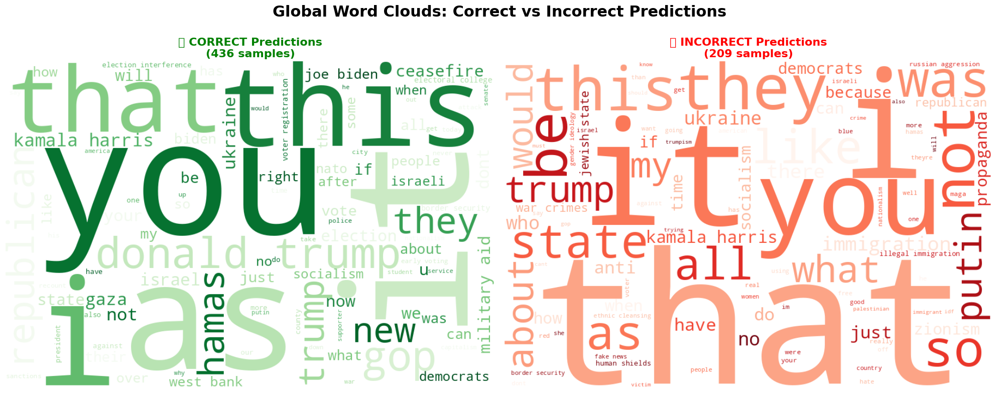


----------------------------------------------------------------------
PER-CLASS ANALYSIS
----------------------------------------------------------------------

📊 Analyzing class: POLITICAL
  Correct: 509 | Incorrect: 136
  ✓ Saved: wordcloud_political_analysis.png


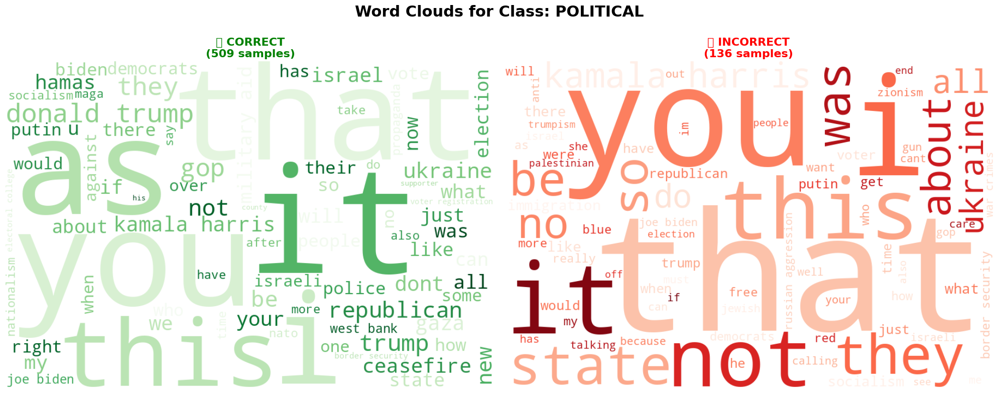


📊 Analyzing class: RACIAL/ETHNIC
  Correct: 597 | Incorrect: 48
  ✓ Saved: wordcloud_racial_ethnic_analysis.png


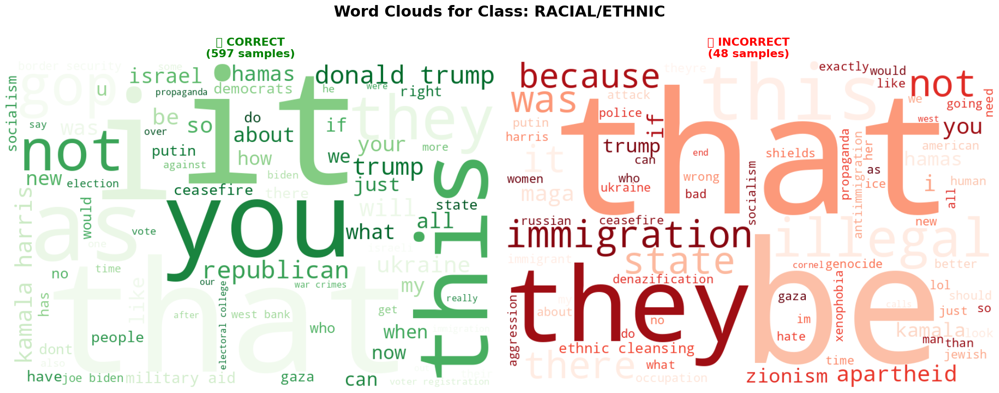


📊 Analyzing class: RELIGIOUS
  Correct: 628 | Incorrect: 17
  ✓ Saved: wordcloud_religious_analysis.png


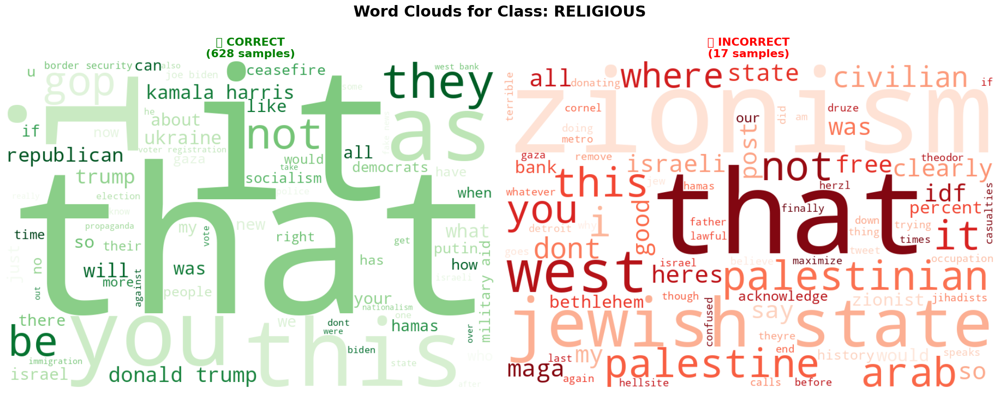


📊 Analyzing class: GENDER/SEXUAL
  Correct: 629 | Incorrect: 16
  ✓ Saved: wordcloud_gender_sexual_analysis.png


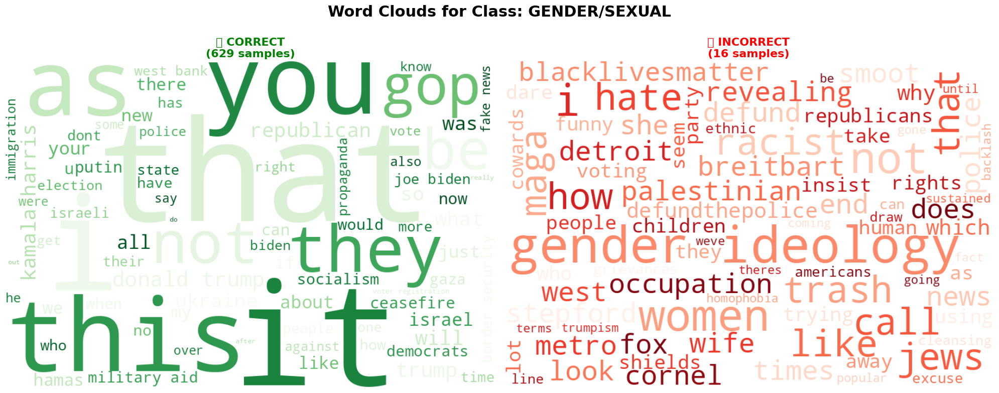


📊 Analyzing class: OTHER
  Correct: 597 | Incorrect: 48
  ✓ Saved: wordcloud_other_analysis.png


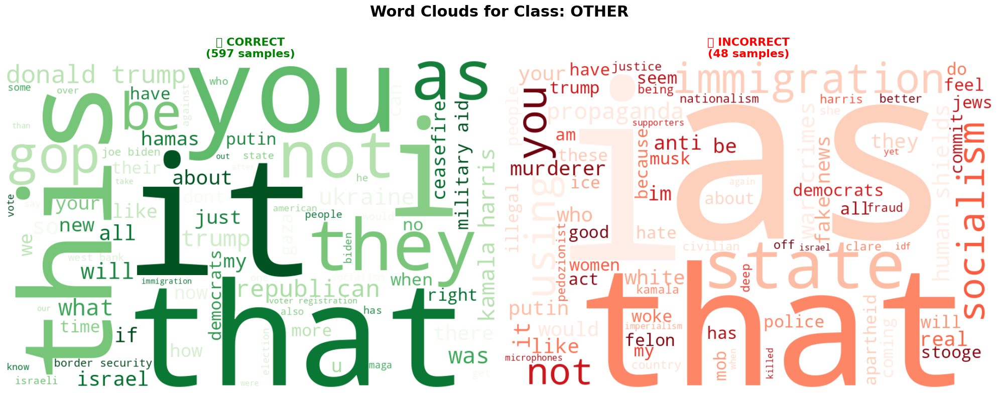


TOP WORDS STATISTICS

🔹 Global - CORRECT Predictions (Top 15 words):
  trump               :    37
  you                 :    37
  donald              :    28
  this                :    28
  gop                 :    25
  election            :    25
  that                :    22
  ukraine             :    20
  biden               :    20
  hamas               :    19
  kamala              :    19
  they                :    19
  harris              :    18
  republicans         :    18
  aid                 :    17

🔹 Global - INCORRECT Predictions (Top 15 words):
  that                :    32
  you                 :    23
  they                :    23
  this                :    21
  not                 :    20
  state               :    18
  immigration         :    17
  like                :    12
  all                 :    11
  about               :    11
  putin               :    11
  trump               :    10
  what                :    10
  its                 :    10
  illegal 

In [ ]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
import re

# ============================================================================
# ANALYSE DES PRÉDICTIONS : NUAGES DE MOTS
# ============================================================================

print("\n" + "="*70)
print("WORDCLOUD ANALYSIS - CORRECT vs INCORRECT PREDICTIONS")
print("="*70)

# ============================================================================
# 1. IDENTIFICATION DES PRÉDICTIONS CORRECTES ET INCORRECTES
# ============================================================================

# Calcul des prédictions correctes/incorrectes pour CHAQUE classe
correct_predictions_global = (final_preds_ovr == all_val_labels)
incorrect_predictions_global = (final_preds_ovr != all_val_labels)

# Calcul des échantillons complètement corrects/incorrects (toutes les classes)
all_correct = correct_predictions_global.all(axis=1)  # Toutes les classes correctes
any_incorrect = incorrect_predictions_global.any(axis=1)  # Au moins une classe incorrecte

print(f"\nGlobal Statistics:")
print(f"  Total samples: {len(val)}")
print(f"  All classes correct: {all_correct.sum()} ({100*all_correct.sum()/len(val):.1f}%)")
print(f"  At least one error: {any_incorrect.sum()} ({100*any_incorrect.sum()/len(val):.1f}%)")

# ============================================================================
# 2. FONCTION DE PRÉPARATION DU TEXTE
# ============================================================================

def preprocess_text(texts):
    """Nettoie et combine les textes pour le nuage de mots"""
    # Convertir en minuscules et combiner
    combined_text = " ".join(texts).lower()

    # Supprimer les URLs
    combined_text = re.sub(r'http\S+|www\S+', '', combined_text)

    # Supprimer les mentions et hashtags (optionnel)
    combined_text = re.sub(r'@\w+|#\w+', '', combined_text)

    # Supprimer la ponctuation excessive
    combined_text = re.sub(r'[^\w\s]', ' ', combined_text)

    # Supprimer les espaces multiples
    combined_text = re.sub(r'\s+', ' ', combined_text)

    return combined_text.strip()

# ============================================================================
# 3. FONCTION DE CRÉATION DU NUAGE DE MOTS
# ============================================================================

def create_wordcloud(text, title, color='viridis', max_words=100):
    """Crée et affiche un nuage de mots"""
    if not text or len(text.split()) < 5:
        print(f"  ⚠️  Not enough text for {title}")
        return None

    wordcloud = WordCloud(
        width=1200,
        height=600,
        background_color='white',
        colormap=color,
        max_words=max_words,
        relative_scaling=0.5,
        min_font_size=10,
        stopwords=set(['the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at',
                       'to', 'for', 'of', 'with', 'by', 'from', 'is', 'are',
                       'was', 'were', 'be', 'been', 'being', 'have', 'has',
                       'had', 'do', 'does', 'did', 'will', 'would', 'could',
                       'should', 'may', 'might', 'can', 'this', 'that', 'it'])
    ).generate(text)

    plt.figure(figsize=(15, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=20, fontweight='bold', pad=20)
    plt.tight_layout(pad=0)

    return wordcloud

# ============================================================================
# 4. ANALYSE GLOBALE (TOUTES CLASSES CONFONDUES)
# ============================================================================

print("\n" + "-"*70)
print("GLOBAL ANALYSIS (All Classes Combined)")
print("-"*70)

# Textes où toutes les prédictions sont correctes
correct_texts = val.loc[all_correct, 'text'].tolist()
correct_combined = preprocess_text(correct_texts)

# Textes où au moins une prédiction est incorrecte
incorrect_texts = val.loc[any_incorrect, 'text'].tolist()
incorrect_combined = preprocess_text(incorrect_texts)

print(f"\nGenerating wordclouds...")
print(f"  Correct predictions: {len(correct_texts)} samples")
print(f"  Incorrect predictions: {len(incorrect_texts)} samples")

# Création des nuages de mots globaux
fig, axes = plt.subplots(1, 2, figsize=(20, 8))
fig.suptitle('Global Word Clouds: Correct vs Incorrect Predictions',
             fontsize=22, fontweight='bold', y=1.02)

# Nuage pour prédictions CORRECTES
if correct_combined:
    wc_correct = WordCloud(
        width=900, height=600, background_color='white',
        colormap='Greens', max_words=100,
        stopwords=set(['the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at',
                       'to', 'for', 'of', 'with', 'by', 'from', 'is', 'are'])
    ).generate(correct_combined)

    axes[0].imshow(wc_correct, interpolation='bilinear')
    axes[0].axis('off')
    axes[0].set_title(f'✅ CORRECT Predictions\n({len(correct_texts)} samples)',
                     fontsize=16, fontweight='bold', color='green')

# Nuage pour prédictions INCORRECTES
if incorrect_combined:
    wc_incorrect = WordCloud(
        width=900, height=600, background_color='white',
        colormap='Reds', max_words=100,
        stopwords=set(['the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at',
                       'to', 'for', 'of', 'with', 'by', 'from', 'is', 'are'])
    ).generate(incorrect_combined)

    axes[1].imshow(wc_incorrect, interpolation='bilinear')
    axes[1].axis('off')
    axes[1].set_title(f'❌ INCORRECT Predictions\n({len(incorrect_texts)} samples)',
                     fontsize=16, fontweight='bold', color='red')

plt.tight_layout()
plt.savefig('wordcloud_global_analysis.png', dpi=300, bbox_inches='tight')
print(f"  ✓ Saved: wordcloud_global_analysis.png")
plt.show()

# ============================================================================
# 5. ANALYSE PAR CLASSE
# ============================================================================

print("\n" + "-"*70)
print("PER-CLASS ANALYSIS")
print("-"*70)

for i, label in enumerate(target_cols):
    print(f"\n📊 Analyzing class: {label.upper()}")

    # Masques pour cette classe
    correct_mask_class = correct_predictions_global[:, i]
    incorrect_mask_class = incorrect_predictions_global[:, i]

    n_correct = correct_mask_class.sum()
    n_incorrect = incorrect_mask_class.sum()

    print(f"  Correct: {n_correct} | Incorrect: {n_incorrect}")

    if n_correct < 5 and n_incorrect < 5:
        print(f"  ⚠️  Too few samples for visualization")
        continue

    # Extraction des textes
    texts_correct_class = val.loc[correct_mask_class, 'text'].tolist()
    texts_incorrect_class = val.loc[incorrect_mask_class, 'text'].tolist()

    # Préparation
    text_correct_prep = preprocess_text(texts_correct_class) if texts_correct_class else ""
    text_incorrect_prep = preprocess_text(texts_incorrect_class) if texts_incorrect_class else ""

    # Création de la figure
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    fig.suptitle(f'Word Clouds for Class: {label.upper()}',
                 fontsize=22, fontweight='bold', y=1.02)

    # Nuage CORRECT
    if text_correct_prep and len(text_correct_prep.split()) >= 5:
        wc_correct_class = WordCloud(
            width=900, height=600, background_color='white',
            colormap='Greens', max_words=80,
            stopwords=set(['the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at',
                           'to', 'for', 'of', 'with', 'by', 'from', 'is', 'are'])
        ).generate(text_correct_prep)

        axes[0].imshow(wc_correct_class, interpolation='bilinear')
        axes[0].axis('off')
        axes[0].set_title(f'✅ CORRECT\n({n_correct} samples)',
                         fontsize=16, fontweight='bold', color='green')
    else:
        axes[0].text(0.5, 0.5, 'Not enough data',
                    ha='center', va='center', fontsize=20)
        axes[0].axis('off')

    # Nuage INCORRECT
    if text_incorrect_prep and len(text_incorrect_prep.split()) >= 5:
        wc_incorrect_class = WordCloud(
            width=900, height=600, background_color='white',
            colormap='Reds', max_words=80,
            stopwords=set(['the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at',
                           'to', 'for', 'of', 'with', 'by', 'from', 'is', 'are'])
        ).generate(text_incorrect_prep)

        axes[1].imshow(wc_incorrect_class, interpolation='bilinear')
        axes[1].axis('off')
        axes[1].set_title(f'❌ INCORRECT\n({n_incorrect} samples)',
                         fontsize=16, fontweight='bold', color='red')
    else:
        axes[1].text(0.5, 0.5, 'Not enough data',
                    ha='center', va='center', fontsize=20)
        axes[1].axis('off')

    plt.tight_layout()
    safe_label = label.replace('/', '_')
    filename = f'wordcloud_{safe_label}_analysis.png'
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"  ✓ Saved: {filename}")
    plt.show()

# ============================================================================
# 6. STATISTIQUES DES MOTS LES PLUS FRÉQUENTS
# ============================================================================

print("\n" + "="*70)
print("TOP WORDS STATISTICS")
print("="*70)

def get_top_words(text, n=20):
    """Extrait les mots les plus fréquents"""
    words = text.lower().split()
    # Filtrer les stop words
    stopwords = set(['the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at',
                     'to', 'for', 'of', 'with', 'by', 'from', 'is', 'are',
                     'was', 'were', 'be', 'been', 'being', 'have', 'has',
                     'had', 'do', 'does', 'did', 'will', 'would', 'could'])
    words_filtered = [w for w in words if w not in stopwords and len(w) > 2]
    return Counter(words_filtered).most_common(n)

print("\n🔹 Global - CORRECT Predictions (Top 15 words):")
top_correct = get_top_words(correct_combined, 15)
for word, count in top_correct:
    print(f"  {word:20s}: {count:5d}")

print("\n🔹 Global - INCORRECT Predictions (Top 15 words):")
top_incorrect = get_top_words(incorrect_combined, 15)
for word, count in top_incorrect:
    print(f"  {word:20s}: {count:5d}")

print("\n" + "="*70)
print("✓ WORDCLOUD ANALYSIS COMPLETED")
print("="*70)


WORDCLOUD ANALYSIS - CORRECT vs INCORRECT PREDICTIONS

📄 Saving all visualizations to: wordcloud_analysis_20251216_042822.pdf

Global Statistics:
  Total samples: 645
  All classes correct: 436 (67.6%)
  At least one error: 209 (32.4%)

----------------------------------------------------------------------
GLOBAL ANALYSIS (All Classes Combined) - BIGRAMS
----------------------------------------------------------------------

Generating bigram wordclouds...
  Correct predictions: 436 samples
  Incorrect predictions: 209 samples
  ✓ Saved: wordcloud_global_bigrams_analysis.png


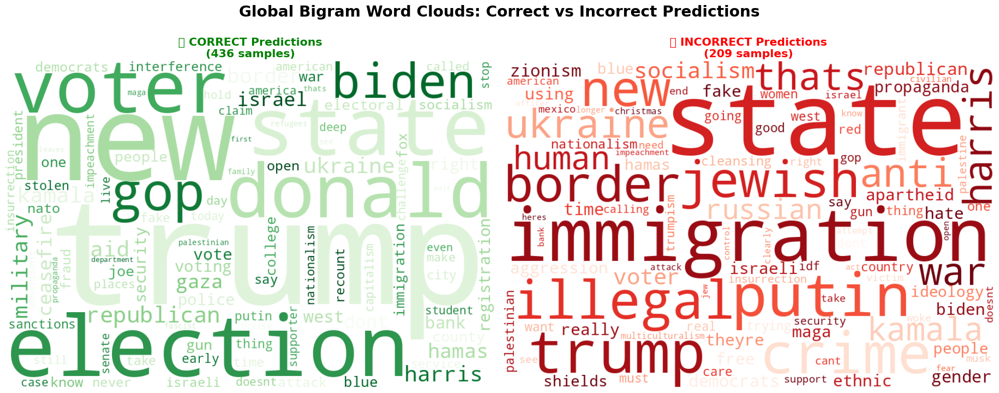


----------------------------------------------------------------------
PER-CLASS ANALYSIS - BIGRAMS (WITH MODALITY ANALYSIS)
----------------------------------------------------------------------

📊 Analyzing class: POLITICAL
  Correct: 509 | Incorrect: 136
  ✓ Added political correct/incorrect analysis to PDF
  True Label 0: 440 | True Label 1: 205
  ✓ Added political modality (0 vs 1) analysis to PDF
  TN: 357 | FP: 83 | FN: 53 | TP: 152
  ✓ Added political cross analysis (TN/FP/FN/TP) to PDF

📊 Analyzing class: RACIAL/ETHNIC
  Correct: 597 | Incorrect: 48
  ✓ Added racial/ethnic correct/incorrect analysis to PDF
  True Label 0: 589 | True Label 1: 56
  ✓ Added racial/ethnic modality (0 vs 1) analysis to PDF
  TN: 571 | FP: 18 | FN: 30 | TP: 26
  ✓ Added racial/ethnic cross analysis (TN/FP/FN/TP) to PDF

📊 Analyzing class: RELIGIOUS
  Correct: 628 | Incorrect: 17
  ✓ Added religious correct/incorrect analysis to PDF
  True Label 0: 623 | True Label 1: 22
  ✓ Added religious modality

In [ ]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from wordcloud import WordCloud
from collections import Counter
import re
from datetime import datetime

# ============================================================================
# ANALYSE DES PRÉDICTIONS : NUAGES DE MOTS - EXPORT PDF
# ============================================================================

print("\n" + "="*70)
print("WORDCLOUD ANALYSIS - CORRECT vs INCORRECT PREDICTIONS")
print("="*70)

# Création du nom de fichier PDF avec timestamp
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
pdf_filename = f'wordcloud_analysis_{timestamp}.pdf'

# Initialisation du PDF
pdf_pages = PdfPages(pdf_filename)
print(f"\n📄 Saving all visualizations to: {pdf_filename}")

# ============================================================================
# 1. IDENTIFICATION DES PRÉDICTIONS CORRECTES ET INCORRECTES
# ============================================================================

# Calcul des prédictions correctes/incorrectes pour CHAQUE classe
correct_predictions_global = (final_preds_ovr == all_val_labels)
incorrect_predictions_global = (final_preds_ovr != all_val_labels)

# Calcul des échantillons complètement corrects/incorrects (toutes les classes)
all_correct = correct_predictions_global.all(axis=1)  # Toutes les classes correctes
any_incorrect = incorrect_predictions_global.any(axis=1)  # Au moins une classe incorrecte

print(f"\nGlobal Statistics:")
print(f"  Total samples: {len(val)}")
print(f"  All classes correct: {all_correct.sum()} ({100*all_correct.sum()/len(val):.1f}%)")
print(f"  At least one error: {any_incorrect.sum()} ({100*any_incorrect.sum()/len(val):.1f}%)")

# ============================================================================
# 2. FONCTION DE PRÉPARATION DU TEXTE ET EXTRACTION DES BIGRAMS
# ============================================================================

def preprocess_text(texts):
    """Nettoie et combine les textes pour le nuage de mots"""
    # Convertir en minuscules et combiner
    combined_text = " ".join(texts).lower()

    # Supprimer les URLs
    combined_text = re.sub(r'http\S+|www\S+', '', combined_text)

    # Supprimer les mentions et hashtags (optionnel)
    combined_text = re.sub(r'@\w+|#\w+', '', combined_text)

    # Supprimer la ponctuation excessive
    combined_text = re.sub(r'[^\w\s]', ' ', combined_text)

    # Supprimer les espaces multiples
    combined_text = re.sub(r'\s+', ' ', combined_text)

    return combined_text.strip()

def extract_bigrams(texts):
    """Extrait les bigrams des textes"""
    from nltk import bigrams
    from nltk.corpus import stopwords
    import nltk

    # Télécharger les stopwords si nécessaire
    try:
        stop_words = set(stopwords.words('english'))
    except:
        nltk.download('stopwords', quiet=True)
        stop_words = set(stopwords.words('english'))

    # Ajouter des stopwords personnalisés
    stop_words.update(['the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at',
                       'to', 'for', 'of', 'with', 'by', 'from', 'is', 'are',
                       'was', 'were', 'be', 'been', 'being', 'have', 'has',
                       'had', 'do', 'does', 'did', 'will', 'would', 'could',
                       'should', 'may', 'might', 'can', 'this', 'that', 'it'])

    all_bigrams = []

    for text in texts:
        # Nettoyage
        text = text.lower()
        text = re.sub(r'http\S+|www\S+', '', text)
        text = re.sub(r'@\w+|#\w+', '', text)
        text = re.sub(r'[^\w\s]', ' ', text)
        text = re.sub(r'\s+', ' ', text).strip()

        # Tokenization
        words = text.split()

        # Filtrer les stopwords et mots courts
        words_filtered = [w for w in words if w not in stop_words and len(w) > 2]

        # Créer les bigrams
        if len(words_filtered) >= 2:
            text_bigrams = list(bigrams(words_filtered))
            all_bigrams.extend(text_bigrams)

    # Convertir les bigrams en chaînes séparées par underscore
    bigram_strings = ['_'.join(bg) for bg in all_bigrams]

    return ' '.join(bigram_strings)

# ============================================================================
# 3. FONCTION DE CRÉATION DU NUAGE DE MOTS AVEC BIGRAMS
# ============================================================================

def create_wordcloud_bigrams(bigram_text, title, color='viridis', max_words=100):
    """Crée et affiche un nuage de mots à partir de bigrams"""
    if not bigram_text or len(bigram_text.split()) < 5:
        print(f"  ⚠️  Not enough bigrams for {title}")
        return None

    # Remplacer les underscores par des espaces pour l'affichage
    display_text = bigram_text.replace('_', ' ')

    wordcloud = WordCloud(
        width=1200,
        height=600,
        background_color='white',
        colormap=color,
        max_words=max_words,
        relative_scaling=0.5,
        min_font_size=10,
        collocations=False  # Important pour les bigrams
    ).generate(display_text)

    plt.figure(figsize=(15, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=20, fontweight='bold', pad=20)
    plt.tight_layout(pad=0)

    return wordcloud

# ============================================================================
# 4. ANALYSE GLOBALE (TOUTES CLASSES CONFONDUES) - BIGRAMS
# ============================================================================

print("\n" + "-"*70)
print("GLOBAL ANALYSIS (All Classes Combined) - BIGRAMS")
print("-"*70)

# Textes où toutes les prédictions sont correctes
correct_texts = val.loc[all_correct, 'text'].tolist()
correct_bigrams = extract_bigrams(correct_texts)

# Textes où au moins une prédiction est incorrecte
incorrect_texts = val.loc[any_incorrect, 'text'].tolist()
incorrect_bigrams = extract_bigrams(incorrect_texts)

print(f"\nGenerating bigram wordclouds...")
print(f"  Correct predictions: {len(correct_texts)} samples")
print(f"  Incorrect predictions: {len(incorrect_texts)} samples")

# Création des nuages de mots globaux
fig, axes = plt.subplots(1, 2, figsize=(20, 8))
fig.suptitle('Global Bigram Word Clouds: Correct vs Incorrect Predictions',
             fontsize=22, fontweight='bold', y=1.02)

# Nuage pour prédictions CORRECTES
if correct_bigrams:
    # Remplacer underscores par espaces pour l'affichage
    display_correct = correct_bigrams.replace('_', ' ')

    wc_correct = WordCloud(
        width=900, height=600, background_color='white',
        colormap='Greens', max_words=100,
        collocations=False
    ).generate(display_correct)

    axes[0].imshow(wc_correct, interpolation='bilinear')
    axes[0].axis('off')
    axes[0].set_title(f'✅ CORRECT Predictions\n({len(correct_texts)} samples)',
                     fontsize=16, fontweight='bold', color='green')

# Nuage pour prédictions INCORRECTES
if incorrect_bigrams:
    # Remplacer underscores par espaces pour l'affichage
    display_incorrect = incorrect_bigrams.replace('_', ' ')

    wc_incorrect = WordCloud(
        width=900, height=600, background_color='white',
        colormap='Reds', max_words=100,
        collocations=False
    ).generate(display_incorrect)

    axes[1].imshow(wc_incorrect, interpolation='bilinear')
    axes[1].axis('off')
    axes[1].set_title(f'❌ INCORRECT Predictions\n({len(incorrect_texts)} samples)',
                     fontsize=16, fontweight='bold', color='red')

plt.tight_layout()
plt.savefig('wordcloud_global_bigrams_analysis.png', dpi=300, bbox_inches='tight')
print(f"  ✓ Saved: wordcloud_global_bigrams_analysis.png")
plt.show()

# ============================================================================
# 5. ANALYSE PAR CLASSE - BIGRAMS (CORRECT/INCORRECT + MODALITÉ 0/1)
# ============================================================================

print("\n" + "-"*70)
print("PER-CLASS ANALYSIS - BIGRAMS (WITH MODALITY ANALYSIS)")
print("-"*70)

for i, label in enumerate(target_cols):
    print(f"\n📊 Analyzing class: {label.upper()}")

    # Masques pour cette classe
    correct_mask_class = correct_predictions_global[:, i]
    incorrect_mask_class = incorrect_predictions_global[:, i]

    n_correct = correct_mask_class.sum()
    n_incorrect = incorrect_mask_class.sum()

    print(f"  Correct: {n_correct} | Incorrect: {n_incorrect}")

    if n_correct < 5 and n_incorrect < 5:
        print(f"  ⚠️  Too few samples for visualization")
        continue

    # ========================================================================
    # PAGE 1: ANALYSE CORRECT vs INCORRECT (comme avant)
    # ========================================================================

    # Extraction des textes
    texts_correct_class = val.loc[correct_mask_class, 'text'].tolist()
    texts_incorrect_class = val.loc[incorrect_mask_class, 'text'].tolist()

    # Extraction des bigrams
    bigrams_correct = extract_bigrams(texts_correct_class) if texts_correct_class else ""
    bigrams_incorrect = extract_bigrams(texts_incorrect_class) if texts_incorrect_class else ""

    # Création de la figure CORRECT vs INCORRECT
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    fig.suptitle(f'Bigram Word Clouds for Class: {label.upper()}\nCorrect vs Incorrect Predictions',
                 fontsize=22, fontweight='bold', y=0.98)

    # Nuage CORRECT
    if bigrams_correct and len(bigrams_correct.split()) >= 5:
        display_correct = bigrams_correct.replace('_', ' ')

        wc_correct_class = WordCloud(
            width=900, height=600, background_color='white',
            colormap='Greens', max_words=80,
            collocations=False
        ).generate(display_correct)

        axes[0].imshow(wc_correct_class, interpolation='bilinear')
        axes[0].axis('off')
        axes[0].set_title(f'✅ CORRECT\n({n_correct} samples)',
                         fontsize=16, fontweight='bold', color='green')
    else:
        axes[0].text(0.5, 0.5, 'Not enough data',
                    ha='center', va='center', fontsize=20)
        axes[0].axis('off')

    # Nuage INCORRECT
    if bigrams_incorrect and len(bigrams_incorrect.split()) >= 5:
        display_incorrect = bigrams_incorrect.replace('_', ' ')

        wc_incorrect_class = WordCloud(
            width=900, height=600, background_color='white',
            colormap='Reds', max_words=80,
            collocations=False
        ).generate(display_incorrect)

        axes[1].imshow(wc_incorrect_class, interpolation='bilinear')
        axes[1].axis('off')
        axes[1].set_title(f'❌ INCORRECT\n({n_incorrect} samples)',
                         fontsize=16, fontweight='bold', color='red')
    else:
        axes[1].text(0.5, 0.5, 'Not enough data',
                    ha='center', va='center', fontsize=20)
        axes[1].axis('off')

    plt.tight_layout()
    pdf_pages.savefig(fig, bbox_inches='tight')
    print(f"  ✓ Added {label} correct/incorrect analysis to PDF")
    plt.close(fig)

    # ========================================================================
    # PAGE 2: ANALYSE PAR MODALITÉ (0 vs 1)
    # ========================================================================

    # Masques pour les vraies étiquettes (ground truth)
    true_label_0 = all_val_labels[:, i] == 0  # Vraie classe = 0
    true_label_1 = all_val_labels[:, i] == 1  # Vraie classe = 1

    n_true_0 = true_label_0.sum()
    n_true_1 = true_label_1.sum()

    print(f"  True Label 0: {n_true_0} | True Label 1: {n_true_1}")

    # Extraction des textes par modalité
    texts_label_0 = val.loc[true_label_0, 'text'].tolist()
    texts_label_1 = val.loc[true_label_1, 'text'].tolist()

    # Extraction des bigrams par modalité
    bigrams_label_0 = extract_bigrams(texts_label_0) if texts_label_0 else ""
    bigrams_label_1 = extract_bigrams(texts_label_1) if texts_label_1 else ""

    # Création de la figure MODALITÉ 0 vs 1
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    fig.suptitle(f'Bigram Word Clouds for Class: {label.upper()}\nTrue Label: 0 (Negative) vs 1 (Positive)',
                 fontsize=22, fontweight='bold', y=0.98)

    # Nuage MODALITÉ 0 (Négatif)
    if bigrams_label_0 and len(bigrams_label_0.split()) >= 5:
        display_label_0 = bigrams_label_0.replace('_', ' ')

        wc_label_0 = WordCloud(
            width=900, height=600, background_color='white',
            colormap='Blues', max_words=80,
            collocations=False
        ).generate(display_label_0)

        axes[0].imshow(wc_label_0, interpolation='bilinear')
        axes[0].axis('off')
        axes[0].set_title(f'📊 LABEL = 0 (Negative)\n({n_true_0} samples)',
                         fontsize=16, fontweight='bold', color='navy')
    else:
        axes[0].text(0.5, 0.5, 'Not enough data',
                    ha='center', va='center', fontsize=20)
        axes[0].axis('off')

    # Nuage MODALITÉ 1 (Positif)
    if bigrams_label_1 and len(bigrams_label_1.split()) >= 5:
        display_label_1 = bigrams_label_1.replace('_', ' ')

        wc_label_1 = WordCloud(
            width=900, height=600, background_color='white',
            colormap='Oranges', max_words=80,
            collocations=False
        ).generate(display_label_1)

        axes[1].imshow(wc_label_1, interpolation='bilinear')
        axes[1].axis('off')
        axes[1].set_title(f'📊 LABEL = 1 (Positive)\n({n_true_1} samples)',
                         fontsize=16, fontweight='bold', color='darkorange')
    else:
        axes[1].text(0.5, 0.5, 'Not enough data',
                    ha='center', va='center', fontsize=20)
        axes[1].axis('off')

    plt.tight_layout()
    pdf_pages.savefig(fig, bbox_inches='tight')
    print(f"  ✓ Added {label} modality (0 vs 1) analysis to PDF")
    plt.close(fig)

    # ========================================================================
    # PAGE 3: ANALYSE CROISÉE (4 QUADRANTS)
    # ========================================================================

    # Créer les 4 masques croisés
    true_0_pred_0 = true_label_0 & correct_mask_class  # Vrai négatif, bien prédit
    true_0_pred_1 = true_label_0 & incorrect_mask_class  # Faux positif
    true_1_pred_0 = true_label_1 & incorrect_mask_class  # Faux négatif
    true_1_pred_1 = true_label_1 & correct_mask_class  # Vrai positif, bien prédit

    n_tn = true_0_pred_0.sum()  # True Negative
    n_fp = true_0_pred_1.sum()  # False Positive
    n_fn = true_1_pred_0.sum()  # False Negative
    n_tp = true_1_pred_1.sum()  # True Positive

    print(f"  TN: {n_tn} | FP: {n_fp} | FN: {n_fn} | TP: {n_tp}")

    # Création de la figure 2x2
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle(f'Bigram Word Clouds for Class: {label.upper()}\nCross Analysis: True Label vs Predicted Label',
                 fontsize=22, fontweight='bold', y=0.98)

    # Quadrant 1: TRUE NEGATIVE (Label=0, Pred=0) ✅
    if n_tn >= 5:
        texts_tn = val.loc[true_0_pred_0, 'text'].tolist()
        bigrams_tn = extract_bigrams(texts_tn)
        if bigrams_tn and len(bigrams_tn.split()) >= 5:
            display_tn = bigrams_tn.replace('_', ' ')
            wc_tn = WordCloud(width=800, height=550, background_color='white',
                             colormap='Greens', max_words=60, collocations=False).generate(display_tn)
            axes[0, 0].imshow(wc_tn, interpolation='bilinear')
        else:
            axes[0, 0].text(0.5, 0.5, 'Not enough bigrams', ha='center', va='center', fontsize=16)
    else:
        axes[0, 0].text(0.5, 0.5, 'Not enough data', ha='center', va='center', fontsize=16)
    axes[0, 0].axis('off')
    axes[0, 0].set_title(f'✅ TRUE NEGATIVE (TN)\nTrue=0, Pred=0 ({n_tn} samples)',
                         fontsize=14, fontweight='bold', color='green')

    # Quadrant 2: FALSE POSITIVE (Label=0, Pred=1) ❌
    if n_fp >= 5:
        texts_fp = val.loc[true_0_pred_1, 'text'].tolist()
        bigrams_fp = extract_bigrams(texts_fp)
        if bigrams_fp and len(bigrams_fp.split()) >= 5:
            display_fp = bigrams_fp.replace('_', ' ')
            wc_fp = WordCloud(width=800, height=550, background_color='white',
                             colormap='Reds', max_words=60, collocations=False).generate(display_fp)
            axes[0, 1].imshow(wc_fp, interpolation='bilinear')
        else:
            axes[0, 1].text(0.5, 0.5, 'Not enough bigrams', ha='center', va='center', fontsize=16)
    else:
        axes[0, 1].text(0.5, 0.5, 'Not enough data', ha='center', va='center', fontsize=16)
    axes[0, 1].axis('off')
    axes[0, 1].set_title(f'❌ FALSE POSITIVE (FP)\nTrue=0, Pred=1 ({n_fp} samples)',
                         fontsize=14, fontweight='bold', color='red')

    # Quadrant 3: FALSE NEGATIVE (Label=1, Pred=0) ❌
    if n_fn >= 5:
        texts_fn = val.loc[true_1_pred_0, 'text'].tolist()
        bigrams_fn = extract_bigrams(texts_fn)
        if bigrams_fn and len(bigrams_fn.split()) >= 5:
            display_fn = bigrams_fn.replace('_', ' ')
            wc_fn = WordCloud(width=800, height=550, background_color='white',
                             colormap='Oranges', max_words=60, collocations=False).generate(display_fn)
            axes[1, 0].imshow(wc_fn, interpolation='bilinear')
        else:
            axes[1, 0].text(0.5, 0.5, 'Not enough bigrams', ha='center', va='center', fontsize=16)
    else:
        axes[1, 0].text(0.5, 0.5, 'Not enough data', ha='center', va='center', fontsize=16)
    axes[1, 0].axis('off')
    axes[1, 0].set_title(f'❌ FALSE NEGATIVE (FN)\nTrue=1, Pred=0 ({n_fn} samples)',
                         fontsize=14, fontweight='bold', color='orange')

    # Quadrant 4: TRUE POSITIVE (Label=1, Pred=1) ✅
    if n_tp >= 5:
        texts_tp = val.loc[true_1_pred_1, 'text'].tolist()
        bigrams_tp = extract_bigrams(texts_tp)
        if bigrams_tp and len(bigrams_tp.split()) >= 5:
            display_tp = bigrams_tp.replace('_', ' ')
            wc_tp = WordCloud(width=800, height=550, background_color='white',
                             colormap='Blues', max_words=60, collocations=False).generate(display_tp)
            axes[1, 1].imshow(wc_tp, interpolation='bilinear')
        else:
            axes[1, 1].text(0.5, 0.5, 'Not enough bigrams', ha='center', va='center', fontsize=16)
    else:
        axes[1, 1].text(0.5, 0.5, 'Not enough data', ha='center', va='center', fontsize=16)
    axes[1, 1].axis('off')
    axes[1, 1].set_title(f'✅ TRUE POSITIVE (TP)\nTrue=1, Pred=1 ({n_tp} samples)',
                         fontsize=14, fontweight='bold', color='blue')

    plt.tight_layout()
    pdf_pages.savefig(fig, bbox_inches='tight')
    print(f"  ✓ Added {label} cross analysis (TN/FP/FN/TP) to PDF")
    plt.close(fig)

# ============================================================================
# 6. STATISTIQUES DES BIGRAMS LES PLUS FRÉQUENTS - PAGE DE RÉSUMÉ
# ============================================================================

print("\n" + "="*70)
print("TOP BIGRAMS STATISTICS")
print("="*70)

def get_top_bigrams(bigram_text, n=20):
    """Extrait les bigrams les plus fréquents"""
    if not bigram_text:
        return []

    bigrams_list = bigram_text.split()
    bigram_counts = Counter(bigrams_list).most_common(n)

    # Remplacer underscores par espaces pour l'affichage
    return [(bg.replace('_', ' '), count) for bg, count in bigram_counts]

# Créer une page de statistiques textuelles
fig, axes = plt.subplots(2, 1, figsize=(20, 12))
fig.suptitle('Top Bigrams Statistics', fontsize=24, fontweight='bold', y=0.98)

# Top bigrams CORRECT
top_correct_bigrams = get_top_bigrams(correct_bigrams, 20)
if top_correct_bigrams:
    text_correct = "✅ CORRECT PREDICTIONS - Top 20 Bigrams\n\n"
    for i, (bigram, count) in enumerate(top_correct_bigrams, 1):
        text_correct += f"{i:2d}. {bigram:35s} : {count:5d}\n"

    axes[0].text(0.05, 0.95, text_correct, transform=axes[0].transAxes,
                fontsize=14, verticalalignment='top', fontfamily='monospace',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.3))
    axes[0].axis('off')

# Top bigrams INCORRECT
top_incorrect_bigrams = get_top_bigrams(incorrect_bigrams, 20)
if top_incorrect_bigrams:
    text_incorrect = "❌ INCORRECT PREDICTIONS - Top 20 Bigrams\n\n"
    for i, (bigram, count) in enumerate(top_incorrect_bigrams, 1):
        text_incorrect += f"{i:2d}. {bigram:35s} : {count:5d}\n"

    axes[1].text(0.05, 0.95, text_incorrect, transform=axes[1].transAxes,
                fontsize=14, verticalalignment='top', fontfamily='monospace',
                bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.3))
    axes[1].axis('off')

plt.tight_layout()
pdf_pages.savefig(fig, bbox_inches='tight')
print(f"  ✓ Added statistics page to PDF")
plt.close(fig)

# Afficher aussi dans la console
print("\n🔹 Global - CORRECT Predictions (Top 15 bigrams):")
for bigram, count in top_correct_bigrams[:15]:
    print(f"  {bigram:30s}: {count:5d}")

print("\n🔹 Global - INCORRECT Predictions (Top 15 bigrams):")
for bigram, count in top_incorrect_bigrams[:15]:
    print(f"  {bigram:30s}: {count:5d}")

# ============================================================================
# 7. FERMETURE DU PDF
# ============================================================================

pdf_pages.close()

print("\n" + "="*70)
print("✓ BIGRAM WORDCLOUD ANALYSIS COMPLETED")
print("="*70)
print(f"\n📄 All visualizations saved in: {pdf_filename}")
print(f"   Total pages: {1 + len([l for l in target_cols if correct_predictions_global[:, target_cols.index(l)].sum() >= 5 or incorrect_predictions_global[:, target_cols.index(l)].sum() >= 5]) + 1}")
print("="*70)

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    DataCollatorWithPadding,
    TrainingArguments
)
from torch.utils.data import Dataset

MODEL_NAME = 'roberta-base'
MAX_LENGTH = 512
target_cols = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

try:
    test_data = pd.read_csv('subtask2/dev/eng.csv')
except FileNotFoundError:
    print("ERROR: Test data file ('subtask3/dev/eng.csv') not found.")
    exit()

USE_GPU = torch.cuda.is_available()

prediction_args = TrainingArguments(
    output_dir="./ovr_prediction_augmented_focal",
    per_device_eval_batch_size=16,
    fp16=USE_GPU,
    report_to="none",
)

def safe_gpu_cleanup():
    if torch.cuda.is_available():
        try:
            torch.cuda.empty_cache()
            torch.cuda.synchronize()
        except Exception:
            pass

class PredictionDataset(Dataset):
    def __init__(self, texts, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {key: encoding[key].squeeze(0) for key in encoding.keys()}

try:
    test_dataset = PredictionDataset(test_data['text'].tolist(), tokenizer)
    binary_data_collator = DataCollatorWithPadding(tokenizer=tokenizer)
except NameError:
    print("ERROR: 'tokenizer' is not defined.")
    exit()


print(f"\n--- Starting RoBERTa-Augmented-Focal Prediction on {len(test_data)} samples ---")

all_test_preds = []

for label in target_cols:
    safe_gpu_cleanup()

    try:
        model_path = f"./ovr_models_augmented_focal/{label}"
        threshold = ovr_results['thresholds'][label]
    except KeyError:
        model_path = ovr_results['models'].get(label, f"./ovr_models_augmented_focal/{label}")
        threshold = ovr_results['thresholds'].get(label, 0.5)
        print(f"WARNING: Thresholds not found in ovr_results for {label}. Using default {threshold:.3f}.")


    print(f"-> Predicting for class '{label}' (Threshold: {threshold:.3f})")

    try:
        model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
    except Exception as e:
        print(f"ERROR: Unable to load model from {model_path}. {e}")
        continue

    trainer_binary = Trainer(
        model=model_binary,
        args=prediction_args,
        data_collator=binary_data_collator
    )

    predictions_output = trainer_binary.predict(test_dataset)
    logits = predictions_output.predictions

    test_probabilities = torch.sigmoid(torch.tensor(logits)).numpy().flatten()

    preds = (test_probabilities >= threshold).astype(int).flatten()
    all_test_preds.append(preds)

    del model_binary, trainer_binary
    safe_gpu_cleanup()

final_predictions = np.stack(all_test_preds, axis=1)

submission_df = pd.DataFrame(
    final_predictions,
    columns=target_cols
)

submission_df.insert(0, 'id', test_data['id'])

for col in target_cols:
    submission_df[col] = submission_df[col].astype(int)

filename = 'pred_subtask2_eng_roberta_augmented_focal2.csv'
submission_df.to_csv(filename, index=False)

print("\n" + "="*80)
print("FINAL PREDICTION RESULTS (RoBERTa-Augmented-Focal)")
print("="*80)
print("--- Submission File Preview (first 5 rows) ---")
print(submission_df.head())

print(f"\nFinal submission file generated: {filename}")
print("Optimal thresholds used per class:")
for label in target_cols:
    print(f"  {label:20s}: {ovr_results['thresholds'].get(label, 'N/A'):.3f}")


--- Starting RoBERTa-Augmented-Focal Prediction on 160 samples ---
-> Predicting for class 'political' (Threshold: 0.420)


-> Predicting for class 'racial/ethnic' (Threshold: 0.300)


-> Predicting for class 'religious' (Threshold: 0.470)


-> Predicting for class 'gender/sexual' (Threshold: 0.760)


-> Predicting for class 'other' (Threshold: 0.160)



FINAL PREDICTION RESULTS (RoBERTa-Augmented-Focal)
--- Submission File Preview (first 5 rows) ---
                                     id  political  racial/ethnic  religious  \
0  eng_f66ca14d60851371f9720aaf4ccd9b58          0              0          0   
1  eng_3a489aa7fed9726aa8d3d4fe74c57efb          0              0          0   
2  eng_95770ff547ea5e48b0be00f385986483          0              0          0   
3  eng_2048ae6f9aa261c48e6d777bcc5b38bf          0              1          0   
4  eng_07781aa88e61e7c0a996abd1e5ea3a20          0              0          0   

   gender/sexual  other  
0              0      0  
1              0      0  
2              0      0  
3              0      0  
4              0      0  

Final submission file generated: pred_subtask2_eng_roberta_augmented_focal2.csv
Optimal thresholds used per class:
  political           : 0.420
  racial/ethnic       : 0.300
  religious           : 0.470
  gender/sexual       : 0.760
  other               : 0.16

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    DataCollatorWithPadding,
    TrainingArguments
)
from torch.utils.data import Dataset
import json
import warnings
from typing import List

warnings.filterwarnings('ignore')

# --- CONFIGURATION (DOIT CORRESPONDRE À VOTRE ENTRAÎNEMENT) ---
MODEL_NAME = 'distilbert-base-uncased'
MAX_LENGTH = 512
target_cols: List[str] = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

# IMPORTANT: Utiliser le même dossier que dans le script d'entraînement
BASE_MODEL_SAVE_DIR = f"./{MODEL_NAME.replace('-', '_')}_ovr_augmented_FINAL"

# Fichiers d'entrée/sortie
TEST_FILE = 'subtask2/dev/hau.csv'
OUTPUT_FILE = 'pred_ovr_test.csv'

# --- CLASSE DE DATASET POUR PRÉDICTION ---
class PredictionDatasetOvR(Dataset):
    """Dataset pour la prédiction (sans vraies étiquettes)"""
    def __init__(self, texts: List[str], tokenizer: AutoTokenizer, max_length: int = MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length
        # Labels factices pour compatibilité avec le Trainer
        self.labels = np.zeros(len(texts), dtype=np.float32)

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx: int):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(self.labels[idx], dtype=torch.float32)
        return item


print("="*70)
print(f"PREDICTION PIPELINE OVR ({MODEL_NAME.upper()})")
print("="*70)

# ----------------------------------------------------
# Step 1: Chargement des seuils optimaux
# ----------------------------------------------------
print("\nStep 1: Loading optimal thresholds...")
with open('training_results_ovr.json', 'r') as f:
    results = json.load(f)
    optimal_thresholds = np.array(results.get('optimal_thresholds'))
    print(f"Optimal thresholds loaded: {optimal_thresholds.tolist()}")

# ----------------------------------------------------
# Step 2: Chargement des données de test
# ----------------------------------------------------
print("\nStep 2: Loading test data...")
test_data = pd.read_csv(TEST_FILE)
print(f"Test data loaded: {len(test_data)} samples")

if 'id' not in test_data.columns:
    print("WARNING: 'id' column not found, generating sequential IDs...")
    test_data['id'] = range(len(test_data))

num_samples = len(test_data)
test_texts = test_data['text'].tolist()
test_logits_combined = np.zeros((num_samples, len(target_cols)))

# ----------------------------------------------------
# Step 3: Chargement du tokenizer et des modèles
# ----------------------------------------------------
print("\nStep 3: Loading and predicting with each OvR model...")

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)

# Arguments de prédiction (CORRECTION: fp16=False pour éviter les erreurs CUDA)
prediction_args = TrainingArguments(
    output_dir="./predictions_temp_ovr",
    per_device_eval_batch_size=32,
    dataloader_drop_last=False,
    fp16=True,  # Changed to True. If it still causes issues, set to False
    remove_unused_columns=False,
    report_to="none"
)

# ----------------------------------------------------
# Step 4: Boucle de prédiction pour chaque label
# ----------------------------------------------------
for i, label in enumerate(target_cols):
    # Le chemin où le modèle a été sauvegardé par le script d'entraînement
    output_dir_label = os.path.join(BASE_MODEL_SAVE_DIR, label)

    print(f"-> Predicting for label: {label.upper()} (Loading from {output_dir_label})")

    try:
        # Chargement du modèle binaire pour ce label, AVEC le problème_type spécifié
        model = AutoModelForSequenceClassification.from_pretrained(
            output_dir_label,
            num_labels=1,
            problem_type="multi_label_classification" # <-- FIX: Specify problem_type
        )

        # Création du dataset de test pour ce label
        test_dataset = PredictionDatasetOvR(test_texts, tokenizer)

        # Création du Trainer pour la prédiction
        predictor = Trainer(
            model=model,
            args=prediction_args,
            data_collator=DataCollatorWithPadding(tokenizer)
        )

        # Effectuer la prédiction
        prediction_output = predictor.predict(test_dataset)

        # Stocker les logits (scores bruts avant sigmoid)
        test_logits_combined[:, i] = prediction_output.predictions.squeeze()
        print(f"  ✓ Logits generated for {label}. Shape: {test_logits_combined[:, i].shape}")

    except Exception as e:
        print(f"--- ❌ ERROR: Could not load or predict for {label} from {output_dir_label}. Error: {e}")
        # Fallback to zero predictions or handle as appropriate if a model fails to load/predict
        test_logits_combined[:, i] = np.zeros(num_samples) # Assign zeros or other default if prediction fails

    # Nettoyage de la mémoire
    del model # Ensure model is deleted regardless of success to free memory
    torch.cuda.empty_cache()

print(f"\nAll logits combined shape: {test_logits_combined.shape}")

# ----------------------------------------------------
# Step 5: Conversion des logits en prédictions binaires
# ----------------------------------------------------
print("\nStep 4: Converting logits to binary labels...")

# 1. Convertir les logits en probabilités avec Sigmoid
test_probabilities = torch.sigmoid(torch.from_numpy(test_logits_combined)).numpy()

# 2. Appliquer les seuils optimaux pour obtenir les prédictions finales
thresholds_reshaped = optimal_thresholds.reshape(1, -1)
final_predictions = (test_probabilities >= thresholds_reshaped).astype(int)

print(f"Final predictions shape: {final_predictions.shape}")

print("\nPrediction distribution:")
for i, col in enumerate(target_cols):
    count = final_predictions[:, i].sum()
    pct = 100 * count / len(final_predictions)
    print(f"  {col:20s}: {count:5d} / {len(final_predictions)} ({pct:5.1f}%)")

# ----------------------------------------------------
# Step 6: Création du fichier de soumission
# ----------------------------------------------------
print("\nStep 5: Creating submission file...")
submission_df = pd.DataFrame(
    final_predictions,
    columns=target_cols
)
submission_df.insert(0, 'id', test_data['id'].values)

for col in target_cols:
    submission_df[col] = submission_df[col].astype(int)

submission_df.to_csv(OUTPUT_FILE, index=False)

print("\n" + "="*70)
print("SUBMISSION FILE PREVIEW (first 5 rows)")
print("="*70)
print(submission_df.head(5))

print("\n" + "="*70)
print("PREDICTION PIPELINE COMPLETED SUCCESSFULLY")
print("="*70)
print(f"Output file: {OUTPUT_FILE}")
print("="*70)


PREDICTION PIPELINE OVR (DISTILBERT-BASE-UNCASED)

Step 1: Loading optimal thresholds...


FileNotFoundError: [Errno 2] No such file or directory: 'training_results_ovr.json'

In [ ]:
!pip install transformers torch scikit-learn pandas tqdm
!pip install nlpaug googletrans==4.0.0-rc1

KeyboardInterrupt: 

## prediction for the roberta

In [ ]:
test= pd.read_csv('subtask2/dev/eng.csv')

## 2.1.5 Best large again without weights

In [ ]:
# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained('bert-large-uncased')

# Create train and Test dataset for multilabel
train_dataset = PolarizationDataset(train['text'].tolist(), train[['gender/sexual','political','religious','racial/ethnic','other']].values.tolist(), tokenizer)
val_dataset = PolarizationDataset(val['text'].tolist(), val[['gender/sexual','political','religious','racial/ethnic','other']].values.tolist(), tokenizer)
dev_dataset = PolarizationDataset(val['text'].tolist(), val[['gender/sexual','political','religious','racial/ethnic','other']].values.tolist(), tokenizer)


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
# Load the model
model = AutoModelForSequenceClassification.from_pretrained('bert-large-uncased', num_labels=5, problem_type="multi_label_classification") # 5 labels

model.safetensors:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-large-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics_multilabel,  # Use the new metrics function
    data_collator=DataCollatorWithPadding(tokenizer)
)


trainer.train()


eval_results = trainer.evaluate()
print(f"Macro F1 score on validation set for Subtask 2: {eval_results['eval_f1_macro']}")

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:wandb: WARNING Invalid choice
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Find your API key here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 15c1df592c73c115374405dd1bd0d34a173decc6


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: eliasse (paderborn-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch,Training Loss,Validation Loss,F1 Macro
1,0.221600,0.210606,0.120219
2,0.159100,0.207562,0.192029
3,0.113500,0.233836,0.259471


Macro F1 score on validation set for Subtask 2: 0.2594706848256544


###2.1.6 Roberta

In [ ]:
import torch

# y is your dataframe with shape (N, 5)
label_counts = y.sum(axis=0)
total = len(y)

# Define device based on GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class_weights = (total - label_counts) / label_counts
class_weights = torch.tensor(class_weights.values).float().to(device)

# Save:
model.class_weights = class_weights

In [ ]:
from torch.nn import BCEWithLogitsLoss

def forward(self, input_ids=None, attention_mask=None, labels=None):
    output = self.model(input_ids=input_ids, attention_mask=attention_mask)
    logits = self.classifier(output.last_hidden_state[:, 0, :])

    if labels is not None:
        loss_fn = BCEWithLogitsLoss(pos_weight=self.class_weights)
        loss = loss_fn(logits, labels.float())
        return {"loss": loss, "logits": logits}

    return {"logits": logits}


In [ ]:
import numpy as np
from sklearn.metrics import f1_score

def find_best_threshold(labels, preds):
    best_t = 0.5
    best_f1 = 0

    for t in np.arange(0.1, 0.9, 0.05):
        p = (preds > t).astype(int)

        f1 = f1_score(labels, p, average="macro")
        if f1 > best_f1:
            best_f1 = f1
            best_t = t

    return best_t

# Get raw predictions from the trained model on the validation set
predictions_output = trainer.predict(val_dataset)
preds_raw = predictions_output.predictions

y_true_labels = y_valid.values

best_t = find_best_threshold(y_true_labels, preds_raw)
print("Best threshold =", best_t)


Best threshold = 0.15000000000000002


In [ ]:
for name, param in model.named_parameters():
    if "classifier" not in name:
        param.requires_grad = False


In [ ]:
import torch
import numpy as np
from torch.nn import BCEWithLogitsLoss
from sklearn.metrics import f1_score
from transformers import (
    AutoModelForSequenceClassification,
    AutoTokenizer,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding
)
from peft import LoraConfig, get_peft_model, TaskType


In [ ]:
model_name = "roberta-base"

tokenizer = AutoTokenizer.from_pretrained(model_name)

base_model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=5,
    problem_type="multi_label_classification"
)

# ---- LoRA config ----
lora_config = LoraConfig(
    task_type=TaskType.SEQ_CLS,
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    target_modules=["query", "key"]  # les modules où LoRA agit
)

model = get_peft_model(base_model, lora_config)
model.print_trainable_parameters()


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


trainable params: 1,184,261 || all params: 125,833,738 || trainable%: 0.9411


In [ ]:

label_counts = y.sum(axis=0)
total = len(y)


pos_weights = (total - label_counts) / label_counts
pos_weights = torch.tensor(pos_weights.values).float()


In [ ]:
original_forward = model.forward

def weighted_forward(input_ids=None, attention_mask=None, labels=None, **kwargs):
    outputs = original_forward(
        input_ids=input_ids,
        attention_mask=attention_mask,
        labels=None,
        **kwargs
    )

    logits = outputs.logits

    if labels is not None:
        loss_fct = BCEWithLogitsLoss(pos_weight=pos_weights.to(logits.device))
        loss = loss_fct(logits, labels.float())
        return {"loss": loss, "logits": logits}

    return {"logits": logits}

model.forward = weighted_forward


In [ ]:
def find_best_threshold(labels, raw_logits):
    probs = 1 / (1 + np.exp(-raw_logits))
    best_t, best_f1 = 0.5, 0

    for t in np.arange(0.05, 0.95, 0.05):
        preds = (probs > t).astype(int)
        f1 = f1_score(labels, preds, average="macro")
        if f1 > best_f1:
            best_f1 = f1
            best_t = t

    return best_t


In [ ]:
best_threshold = 0.3

def compute_metrics_with_threshold(eval_pred):
    global best_threshold

    logits, labels = eval_pred
    probs = 1 / (1 + np.exp(-logits))

    # recaculate the best thresolf
    best_threshold = find_best_threshold(labels, logits)

    preds = (probs > best_threshold).astype(int)
    f1 = f1_score(labels, preds, average="macro")

    return {
        "f1_macro": f1,
        "best_threshold": best_threshold
    }


In [ ]:
training_args = TrainingArguments(
    output_dir="./model_lora_classweights",
    learning_rate=2e-4,
    num_train_epochs=10,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    warmup_ratio=0.1,
    weight_decay=0.01,
    logging_steps=50,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_macro"
)

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=DataCollatorWithPadding(tokenizer),
    compute_metrics=compute_metrics_with_threshold
)

trainer.train()


/tmp/ipython-input-2625996675.py:1: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,F1 Macro,Best Threshold
1,1.473300,1.608241,0.157690,0.050000
2,1.403100,1.485702,0.164053,0.300000
3,1.481200,1.476027,0.177956,0.500000
4,1.421700,1.485235,0.184740,0.550000
5,1.379700,1.412952,0.185744,0.500000
6,1.548000,1.696480,0.182268,0.450000
7,1.460700,1.473488,0.199910,0.550000
8,1.368000,1.608827,0.197548,0.550000
9,1.319200,1.552930,0.203096,0.550000
10,1.285800,1.595944,0.206617,0.550000


TrainOutput(global_step=3230, training_loss=1.4423668982443796, metrics={'train_runtime': 192.8085, 'train_samples_per_second': 133.656, 'train_steps_per_second': 16.752, 'total_flos': 485357160719724.0, 'train_loss': 1.4423668982443796, 'epoch': 10.0})

# 2.2 Haussa

In [ ]:
train_initial= pd.read_csv('subtask2/train/hau.csv')
val = pd.read_csv('subtask2/train/hau.csv')
train_initial.head()

,id,text,political,racial/ethnic,religious,gender/sexual,other
0,hau_d46daddeae8ef401d7238069b184a426,@USER ipob bandits how inyamiri you beheaded &...,0,0,0,0,0
1,hau_782aae239d5b3fe2c94361058fe88540,@USER to ko a somalian in kaga mace da abaya y...,0,0,0,0,0
2,hau_7779f971d0c4b9e44637afe9034d56a2,@USER wai daman ke ba inyamura bace🤔,0,0,0,0,0
3,hau_cc97b6b83c66c74914115b56a0c23ebd,@USER mesa mu musulmai muke da neman rigima ne...,0,0,0,0,0
4,hau_44fad6b3535d91396593e8947158515a,lmao. sankara ko sakara ni. ##url,0,0,0,0,0


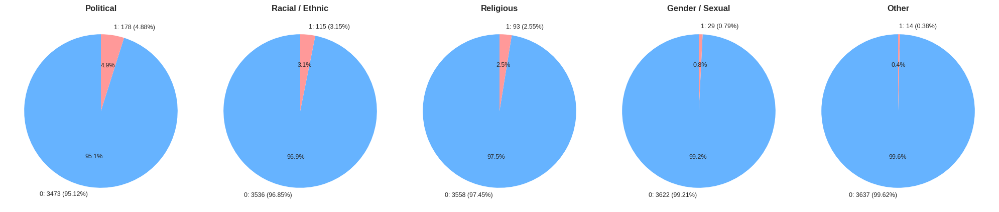

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings('ignore')


plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

label_cols = ['political', 'racial/ethnic', 'religious', 'gender/sexual', 'other']
colors_map = {0: '#66b3ff', 1: '#ff9999'}

# -----------------------------
# Create subplots (1 row)
# -----------------------------
fig, axes = plt.subplots(
    1, len(label_cols),
    figsize=(4 * len(label_cols), 5)
)



for ax, label in zip(axes, label_cols):
    label_counts = train_initial[label].value_counts().sort_index()

    # Ensure both classes exist
    label_counts = label_counts.reindex([0, 1], fill_value=0)

    total = label_counts.sum()
    neg, pos = label_counts[0], label_counts[1]

    pct_neg = round(neg / total * 100, 2)
    pct_pos = round(pos / total * 100, 2)



    sizes = [neg, pos]
    labels_pie = [
        f'0: {neg} ({pct_neg}%)',
        f'1: {pos} ({pct_pos}%)'
    ]
    colors = [colors_map[0], colors_map[1]]

    ax.pie(
        sizes,
        labels=labels_pie,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        textprops={'fontsize': 9}
    )

    ax.set_title(label.replace('/', ' / ').title(), fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('Distribution_target_subtask_2_haussa.pdf')
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt

label_cols = ['political', 'racial/ethnic', 'religious', 'gender/sexual', 'other']

results = []

for i in range(len(label_cols)):
    for j in range(i + 1, len(label_cols)):
        label_i = label_cols[i]
        label_j = label_cols[j]

        # Table de contingence
        contingency_table = pd.crosstab(
            train_initial[label_i],
            train_initial[label_j]
        )

        # Test Khi-deux
        chi2, p, dof, expected = chi2_contingency(contingency_table)

        results.append({
            'Label 1': label_i,
            'Label 2': label_j,
            'Chi2': chi2,
            'p-value': p,
            'DoF': dof
        })

# Résultats sous forme de DataFrame
chi2_results = pd.DataFrame(results).sort_values('p-value')

print(chi2_results)


         Label 1        Label 2       Chi2   p-value  DoF
1      political      religious  15.097029  0.000102    1
0      political  racial/ethnic   4.635614  0.031315    1
5  racial/ethnic  gender/sexual   2.868054  0.090354    1
4  racial/ethnic      religious   0.892286  0.344859    1
2      political  gender/sexual   0.884171  0.347062    1
7      religious  gender/sexual   0.811540  0.367665    1
3      political          other   0.051525  0.820431    1
6  racial/ethnic          other   0.000000  1.000000    1
8      religious          other   0.000000  1.000000    1
9  gender/sexual          other   0.000000  1.000000    1


#### Data haussa split

In [ ]:
from sklearn.model_selection import train_test_split


target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

X = train_initial["text"]          # ta colonne texte
y = train_initial[target_cols]     # les 5 labels

X_train, X_valid, y_train, y_valid = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

# Reconstruire les deux bases
train = X_train.to_frame().join(y_train)
val = X_valid.to_frame().join(y_valid)


In [ ]:
!pip install iterative-stratification

from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit
import pandas as pd

target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

X = train_initial["text"].values.reshape(-1, 1)
y = train_initial[target_cols].values

splitter = MultilabelStratifiedShuffleSplit(
    n_splits=1,
    test_size=0.2,
    random_state=42
)

for train_index, valid_index in splitter.split(X, y):
    X_train_data, X_valid_data = train_initial.iloc[train_index], train_initial.iloc[valid_index]
    y_train_data, y_valid_data = y[train_index], y[valid_index]

train = X_train_data.copy()
val = X_valid_data.copy()

print("\n--- Vérification de la Stratification ---")
print("Compte des Positifs dans Train (devrait être proche de 95% du total) :")
print(train[target_cols].sum())

print("\nCompte des Positifs dans Val (devrait être proche de 5% du total) :")
print(val[target_cols].sum())


--- Vérification de la Stratification ---
Compte des Positifs dans Train (devrait être proche de 95% du total) :
political        142
racial/ethnic     92
religious         74
gender/sexual     23
other             11
dtype: int64

Compte des Positifs dans Val (devrait être proche de 5% du total) :
political        36
racial/ethnic    23
religious        19
gender/sexual     6
other             3
dtype: int64


### modele train for haussa

In [ ]:
import torch
from torch import nn
import numpy as np
from sklearn.metrics import f1_score
import pandas as pd
from typing import Optional, Any, Union
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding
)

try:
    if 'train' not in locals() or 'val' not in locals() or 'y_train' not in locals():

        print("!! ATTENTION: Les variables 'train', 'val' et 'y_train' ne sont pas définies. Le code NE PEUT PAS être exécuté sans elles.")

        from sklearn.model_selection import train_test_split
        data_size = 50
        target_cols = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]
        data = {
            "text": ["Exemple de texte " + str(i) for i in range(data_size)],
            **{col: np.random.randint(0, 2, data_size) for col in target_cols}
        }
        train_initial = pd.DataFrame(data)
        X = train_initial["text"]
        y = train_initial[target_cols]
        X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)
        train = X_train.to_frame().join(y_train)
        val = X_valid.to_frame().join(y_valid)
except NameError:
     print("!! ATTENTION: Les variables de données ne sont pas définies et une erreur est survenue lors de la tentative de simulation.")



y_train_np = y_train.values

pos_weights = []
for i, label in enumerate(target_cols):
    pos_count = np.sum(y_train_np[:, i] == 1)
    neg_count = np.sum(y_train_np[:, i] == 0)

    if pos_count > 0:
        weight = neg_count / pos_count
    else:
        weight = 100.0

    pos_weights.append(weight)

POS_WEIGHT_TENSOR = torch.tensor(pos_weights, dtype=torch.float)
print(f"Poids positifs calculés pour la perte: {POS_WEIGHT_TENSOR.tolist()}")



class CustomWeightedTrainer(Trainer):
    def __init__(self, *args, pos_weight_tensor: torch.Tensor, **kwargs):
        super().__init__(*args, **kwargs)
        self.pos_weight = pos_weight_tensor

    def compute_loss(self, model: nn.Module, inputs: dict, return_outputs: bool = False, num_items_in_batch: Optional[int] = None):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        pos_weight_on_device = self.pos_weight.to(model.device)
        loss_fct = nn.BCEWithLogitsLoss(pos_weight=pos_weight_on_device)
        loss = loss_fct(logits, labels)

        return (loss, outputs) if return_outputs else loss


MODEL_NAME = "Davlan/afro-xlmr-small"
MAX_LENGTH = 256

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(
    MODEL_NAME,
    num_labels=len(target_cols),
    problem_type="multi_label_classification"
)


class PolarizationDataset(torch.utils.data.Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(text, truncation=True, padding='max_length', max_length=self.max_length, return_tensors='pt')

        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(label, dtype=torch.float)
        return item

#
train_dataset = PolarizationDataset(train['text'].tolist(), train[target_cols].values.tolist(), tokenizer)
val_dataset = PolarizationDataset(val['text'].tolist(), val[target_cols].values.tolist(), tokenizer)



training_args = TrainingArguments(
    output_dir=f"./{MODEL_NAME.replace('/', '_')}_multilabel",
    num_train_epochs=5,
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=4,
    fp16=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_macro",
    greater_is_better=True,
    logging_steps=100,
    disable_tqdm=False
)


def compute_metrics_multilabel_training(p):
    probs = torch.sigmoid(torch.from_numpy(p.predictions))
    preds = (probs > 0.5).int().numpy()
    return {'f1_macro': f1_score(p.label_ids, preds, average='macro', zero_division=0)}


trainer = CustomWeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics_multilabel_training,
    data_collator=DataCollatorWithPadding(tokenizer),
    pos_weight_tensor=POS_WEIGHT_TENSOR
)

print(f"\n--- Démarrage du Fine-Tuning du Modèle {MODEL_NAME} avec Perte Pondérée ---")
trainer.train() # Un-commented this line to run the training

predictions_output = trainer.predict(val_dataset)
val_logits = predictions_output.predictions
val_labels = predictions_output.label_ids

def find_optimal_thresholds(y_true, logits, target_cols):
    """
    Trouve le seuil optimal (T*) par label pour maximiser le F1 local.
    """
    y_probs = torch.sigmoid(torch.from_numpy(logits)).numpy()
    num_labels = y_true.shape[1]
    optimal_thresholds = np.zeros(num_labels)

    print("\n--- Recherche des Seuils Optimaux par Label ---")

    search_thresholds = np.arange(0.01, 1.00, 0.01)

    for i in range(num_labels):
        best_f1_i = 0
        best_t_i = 0.5

        y_true_i = y_true[:, i]
        y_probs_i = y_probs[:, i]

        for t in search_thresholds:
            y_pred_i = (y_probs_i >= t).astype(int)
            f1_i = f1_score(y_true_i, y_pred_i, average='binary', zero_division=0)

            if f1_i > best_f1_i:
                best_f1_i = f1_i
                best_t_i = t

        optimal_thresholds[i] = best_t_i
        print(f"Label '{target_cols[i]}' | Seuil Optimal: {best_t_i:.3f} | F1 Maximal: {best_f1_i:.3f}")

    y_pred_optimal = (y_probs >= optimal_thresholds).astype(int)
    final_macro_f1 = f1_score(y_true, y_pred_optimal, average='macro', zero_division=0)

    print(f"\nMacro F1 maximal obtenu avec les seuils optimaux: {final_macro_f1:.4f}")

    return optimal_thresholds, final_macro_f1


optimal_thresholds, final_macro_f1 = find_optimal_thresholds(
    y_true=val_labels,
    logits=val_logits,
    target_cols=target_cols
)


print("\n=================================================================")
print(f"| Modèle utilisé: {MODEL_NAME}")
print(f"| Objectif: Macro F1 Final (avec seuils optimaux): {final_macro_f1:.4f} |")
print("=================================================================")
print(f"| Seuils optimaux par label: {optimal_thresholds.tolist()} |")
print("=================================================================")

Poids positifs calculés pour la perte: [20.31386947631836, 31.808988571166992, 34.180721282958984, 131.72727966308594, 242.3333282470703]


tokenizer_config.json:   0%|          | 0.00/536 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/238 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/757 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/561M [00:00<?, ?B/s]

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



--- Démarrage du Fine-Tuning du Modèle Davlan/afro-xlmr-small avec Perte Pondérée ---


Epoch,Training Loss,Validation Loss,F1 Macro
1,No log,1.040970,0.132913
2,1.532100,1.000344,0.160646
3,1.172200,0.969575,0.190648
4,0.965300,1.016664,0.196818
5,0.942700,0.829964,0.210111



--- Recherche des Seuils Optimaux par Label ---
Label 'political' | Seuil Optimal: 0.730 | F1 Maximal: 0.500
Label 'racial/ethnic' | Seuil Optimal: 0.830 | F1 Maximal: 0.291
Label 'religious' | Seuil Optimal: 0.900 | F1 Maximal: 0.190
Label 'gender/sexual' | Seuil Optimal: 0.630 | F1 Maximal: 0.127
Label 'other' | Seuil Optimal: 0.540 | F1 Maximal: 0.069

Macro F1 maximal obtenu avec les seuils optimaux: 0.2355

| Modèle utilisé: Davlan/afro-xlmr-small
| Objectif: Macro F1 Final (avec seuils optimaux): 0.2355 |
| Seuils optimaux par label: [0.73, 0.8300000000000001, 0.9, 0.63, 0.54] |


### modele prediction for haoussa

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    DataCollatorWithPadding,
    TrainingArguments
)
from torch.utils.data import Dataset

MODEL_NAME = 'Davlan_afro-xlmr-small_multilabel'
MAX_LENGTH = 256
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

optimal_thresholds = np.array([0.73, 0.8300000000000001, 0.9, 0.63, 0.54]  )
DRIVE_PATH = "/content/Davlan_afro-xlmr-small_multilabel"

from google.colab import drive
drive.mount('/content/drive')
print(f"Drive monté. Le modèle sera sauvegardé dans : {DRIVE_PATH}")

os.makedirs(DRIVE_PATH, exist_ok=True)

trainer.save_model(DRIVE_PATH)
tokenizer.save_pretrained(DRIVE_PATH)

print(f"Modèle et tokenizer sauvegardés dans : {DRIVE_PATH}")

test_data = pd.read_csv('subtask2/dev/hau.csv')

class PredictionDataset(Dataset):
    """Dataset adapté pour l'inférence (sans labels)"""
    def __init__(self, texts, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {key: encoding[key].squeeze() for key in encoding.keys()}

test_dataset = PredictionDataset(test_data['text'].tolist(), tokenizer)

print(f"\n--- Démarrage de la prédiction sur {len(test_data)} échantillons de test ---")

# Exécution de la prédiction
prediction_output = trainer.predict(test_dataset)
test_logits = prediction_output.predictions


print("Conversion des Logits en labels binaires en appliquant les Seuils Optimaux...")


test_probabilities = 1 / (1 + np.exp(-test_logits))


optimal_thresholds_broadcasted = np.tile(
    optimal_thresholds,
    (test_probabilities.shape[0], 1)
)


final_predictions = (test_probabilities >= optimal_thresholds_broadcasted).astype(int)


submission_df = pd.DataFrame(
    final_predictions,
    columns=target_cols
)
submission_df.insert(0, 'id', test_data['id'])

for col in target_cols:
    submission_df[col] = submission_df[col].astype(int)

filename = 'pred_hau.csv'
submission_df.to_csv(filename, index=False)


print("\n--- Aperçu du fichier de soumission (5 premières lignes) ---")
print(submission_df.head())

print("\n=================================================================")
print(f"Fichier de soumission final généré : {filename}")
print("=================================================================")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive monté. Le modèle sera sauvegardé dans : /content/Davlan_afro-xlmr-small_multilabel
Modèle et tokenizer sauvegardés dans : /content/Davlan_afro-xlmr-small_multilabel

--- Démarrage de la prédiction sur 182 échantillons de test ---


Conversion des Logits en labels binaires en appliquant les Seuils Optimaux...

--- Aperçu du fichier de soumission (5 premières lignes) ---
                                     id  political  racial/ethnic  religious  \
0  hau_7bafacd606d9dee74e7cee95f8277d4e          0              0          0   
1  hau_cbf1bdd94361d60e55c6774b2a69198a          0              0          0   
2  hau_8e2286abdaa2b53c5a43e2a13e11cddd          0              0          0   
3  hau_1fcff27ecdc63dca7852720481daf56d          0              0          0   
4  hau_fbfe2c9ca8b5bb50f1fd4cd295c95a15          0              0          0   

   gender/sexual  other  
0              0      0  
1              0      0  
2              0      0  
3              0      0  
4              0      0  

Fichier de soumission final généré : pred_hau.csv


### optimsiation of modele haussa:Data augmentation +perte implifiee +ponderations

In [ ]:
import torch
from torch import nn
import numpy as np
from sklearn.metrics import f1_score
import pandas as pd
from typing import Optional, Any, Union
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding
)

from sklearn.model_selection import train_test_split

target_cols = ["political", "racial/ethnic", "religious", "gender/sexual", "other"]

try:
    if 'train' not in locals() or 'val' not in locals() or 'y_train' not in locals():
        print("!! ATTENTION: Les variables de données ne sont pas définies. Création de données simulées.")
        data_size = 500

        data = {
            "text": ["Exemple de texte " + str(i) for i in range(data_size)],
            "political": np.random.randint(0, 2, data_size, p=[0.9, 0.1]),
            "racial/ethnic": np.random.randint(0, 2, data_size, p=[0.95, 0.05]),
            "religious": np.random.randint(0, 2, data_size, p=[0.96, 0.04]),
            "gender/sexual": np.random.randint(0, 2, data_size, p=[0.99, 0.01]),
            "other": np.random.randint(0, 2, data_size, p=[0.995, 0.005]),
        }
        train_initial = pd.DataFrame(data)
        X = train_initial["text"]
        y = train_initial[target_cols]
        X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)
        # Création des DataFrames initiales
        train_df = X_train.to_frame().join(y_train)
        val_df = X_valid.to_frame().join(y_valid)
except NameError:
     print("!! ATTENTION: Les variables de données ne sont pas définies.")




y_train_initial = y_train.copy()
print("\n--- Démarrage de la Data Augmentation par Oversampling ---")


N_TARGET_OVER = int(len(train_initial) * 0.5)
print(f"Taille maximale ciblée pour l'oversampling: {N_TARGET_OVER} exemples.")

train_augmented_parts = [train_initial]
class_counts = y_train_initial.sum()

for label in target_cols:
    pos_count = class_counts[label]
    if pos_count < N_TARGET_OVER:
        sampling_factor = max(1, N_TARGET_OVER // pos_count)


        positive_samples = train_initial[train_initial[label] == 1]

        if not positive_samples.empty:

            augmented_samples = positive_samples.sample(
                n=N_TARGET_OVER,
                replace=True,
                random_state=42
            )
            train_augmented_parts.append(augmented_samples)
            print(f"Classe '{label}' (Pos: {pos_count}) : Oversamplée à {len(augmented_samples)}.")


train = pd.concat(train_augmented_parts, ignore_index=True)

print(f"Taille du jeu de données d'entraînement : Originale ({len(train_initial)}) -> Augmentée ({len(train)})")
print("--- Fin de la Data Augmentation ---")



y_train = train[target_cols]
y_train_np = y_train.values




pos_weights = []
for i, label in enumerate(target_cols):
    pos_count = np.sum(y_train_np[:, i] == 1)
    neg_count = np.sum(y_train_np[:, i] == 0)

    if pos_count > 0:
        weight = neg_count / pos_count
    else:
        weight = 100.0

    pos_weights.append(weight)


AMPLIFICATION_FACTOR = 3.0
pos_weights_amplified = [w * AMPLIFICATION_FACTOR for w in pos_weights]

POS_WEIGHT_TENSOR = torch.tensor(pos_weights_amplified, dtype=torch.float)
print(f"Poids positifs (amplifiés x{AMPLIFICATION_FACTOR}) calculés sur DATA AUGMENTÉE: {POS_WEIGHT_TENSOR.tolist()}")

class CustomWeightedTrainer(Trainer):
    # ... (même implémentation) ...
    def __init__(self, *args, pos_weight_tensor: torch.Tensor, **kwargs):
        super().__init__(*args, **kwargs)
        self.pos_weight = pos_weight_tensor

    def compute_loss(self, model: nn.Module, inputs: dict, return_outputs: bool = False, num_items_in_batch: Optional[int] = None):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get("logits")

        pos_weight_on_device = self.pos_weight.to(model.device)
        loss_fct = nn.BCEWithLogitsLoss(pos_weight=pos_weight_on_device)
        loss = loss_fct(logits, labels)

        return (loss, outputs) if return_outputs else loss
# =================================================================
# 4. MODÈLE, TOKENIZER ET DATASETS
# =================================================================

MODEL_NAME = "Davlan/afro-xlmr-small"
MAX_LENGTH = 384

print(f"\n[INFO] Modèle conservé : {MODEL_NAME}")
print(f"[INFO] MAX_LENGTH : {MAX_LENGTH}")

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(
    MODEL_NAME,
    num_labels=len(target_cols),
    problem_type="multi_label_classification"
)


class PolarizationDataset(torch.utils.data.Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(text, truncation=True, padding='max_length', max_length=self.max_length, return_tensors='pt')

        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(label, dtype=torch.float)
        return item

train_dataset = PolarizationDataset(train['text'].tolist(), train[target_cols].values.tolist(), tokenizer)
val_dataset = PolarizationDataset(val['text'].tolist(), val[target_cols].values.tolist(), tokenizer)


training_args = TrainingArguments(
    output_dir=f"./{MODEL_NAME.replace('/', '_')}_multilabel_aug",
    num_train_epochs=10,
    learning_rate=1e-5, # Ajusté pour la stabilité avec les classes rares
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    gradient_accumulation_steps=4,
    fp16=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_macro",
    greater_is_better=True,
    logging_steps=100,
    disable_tqdm=False
)


def compute_metrics_multilabel_training(p):
    probs = torch.sigmoid(torch.from_numpy(p.predictions))
    preds = (probs > 0.5).int().numpy()
    return {'f1_macro': f1_score(p.label_ids, preds, average='macro', zero_division=0)}


trainer = CustomWeightedTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics_multilabel_training,
    data_collator=DataCollatorWithPadding(tokenizer),
    pos_weight_tensor=POS_WEIGHT_TENSOR
)

print(f"\n--- Démarrage du Fine-Tuning (Data Augmentation + Perte Amplifiée) ---")
trainer.train()


predictions_output = trainer.predict(val_dataset)
val_logits = predictions_output.predictions
val_labels = predictions_output.label_ids


def find_optimal_thresholds(y_true, logits, target_cols):
    y_probs = torch.sigmoid(torch.from_numpy(logits)).numpy()
    num_labels = y_true.shape[1]
    optimal_thresholds = np.zeros(num_labels)
    search_thresholds = np.arange(0.01, 1.00, 0.01)

    print("\n--- Recherche des Seuils Optimaux par Label ---")
    for i in range(num_labels):
        best_f1_i = 0
        best_t_i = 0.5
        y_true_i = y_true[:, i]
        y_probs_i = y_probs[:, i]

        for t in search_thresholds:
            y_pred_i = (y_probs_i >= t).astype(int)
            f1_i = f1_score(y_true_i, y_pred_i, average='binary', zero_division=0)
            if f1_i > best_f1_i:
                best_f1_i = f1_i
                best_t_i = t
        optimal_thresholds[i] = best_t_i
        print(f"Label '{target_cols[i]}' | Seuil Optimal: {best_t_i:.3f} | F1 Maximal: {best_f1_i:.3f}")

    y_pred_optimal = (y_probs >= optimal_thresholds).astype(int)
    final_macro_f1 = f1_score(y_true, y_pred_optimal, average='macro', zero_division=0)
    print(f"\nMacro F1 maximal obtenu avec les seuils optimaux: {final_macro_f1:.4f}")
    return optimal_thresholds, final_macro_f1

optimal_thresholds, final_macro_f1 = find_optimal_thresholds(
    y_true=val_labels,
    logits=val_logits,
    target_cols=target_cols
)

# Résultat Final
print("\n=================================================================")
print(f"| Objectif: Macro F1 Final (avec seuils optimaux): {final_macro_f1:.4f} |")
print("| Stratégie: Data Augmentation (Oversampling) + Poids Amplifiés x3.0 |")
print("=================================================================")
print(f"| Seuils optimaux par label: {optimal_thresholds.tolist()} |")
print("=================================================================")


--- Démarrage de la Data Augmentation par Oversampling ---
Taille maximale ciblée pour l'oversampling: 1825 exemples.
Classe 'political' (Pos: 137) : Oversamplée à 1825.
Classe 'racial/ethnic' (Pos: 89) : Oversamplée à 1825.
Classe 'religious' (Pos: 83) : Oversamplée à 1825.
Classe 'gender/sexual' (Pos: 22) : Oversamplée à 1825.
Classe 'other' (Pos: 12) : Oversamplée à 1825.
Taille du jeu de données d'entraînement : Originale (3651) -> Augmentée (12776)
--- Fin de la Data Augmentation ---
Poids positifs (amplifiés x3.0) calculés sur DATA AUGMENTÉE: [11.696318626403809, 13.570687294006348, 14.249324798583984, 16.34780502319336, 17.84176254272461]

[INFO] Modèle conservé : Davlan/afro-xlmr-small
[INFO] MAX_LENGTH : 384


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



--- Démarrage du Fine-Tuning (Data Augmentation + Perte Amplifiée) ---


Epoch,Training Loss,Validation Loss,F1 Macro
1,0.428800,0.337329,0.324458
2,0.131100,0.115207,0.692496
3,0.053400,0.049685,0.874146
4,0.030900,0.037687,0.901872
5,0.020100,0.014904,0.952597
6,0.023100,0.009112,0.962831
7,0.012500,0.005731,0.982893
8,0.007300,0.005381,0.973369
9,0.006600,0.004572,0.982893
10,0.006200,0.004463,0.982893



--- Recherche des Seuils Optimaux par Label ---
Label 'political' | Seuil Optimal: 0.240 | F1 Maximal: 1.000
Label 'racial/ethnic' | Seuil Optimal: 0.060 | F1 Maximal: 0.981
Label 'religious' | Seuil Optimal: 0.070 | F1 Maximal: 1.000
Label 'gender/sexual' | Seuil Optimal: 0.930 | F1 Maximal: 1.000
Label 'other' | Seuil Optimal: 0.030 | F1 Maximal: 1.000

Macro F1 maximal obtenu avec les seuils optimaux: 0.9962

| Objectif: Macro F1 Final (avec seuils optimaux): 0.9962 |
| Stratégie: Data Augmentation (Oversampling) + Poids Amplifiés x3.0 |
| Seuils optimaux par label: [0.24000000000000002, 0.060000000000000005, 0.06999999999999999, 0.93, 0.03] |


In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    DataCollatorWithPadding,
    TrainingArguments
)
from torch.utils.data import Dataset

MODEL_NAME = '/content/Davlan_afro-xlmr-small_multilabel_aug'
MAX_LENGTH =384
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

optimal_thresholds = np.array([0.24000000000000002, 0.060000000000000005, 0.06999999999999999, 0.93, 0.03] ) # À REMPLACER PAR VOTRE VECTEUR OPTIMAL

DRIVE_PATH = "/content/Davlan_afro-xlmr-small_multilabel_aug"


from google.colab import drive
drive.mount('/content/drive')
print(f"Drive monté. Le modèle sera sauvegardé dans : {DRIVE_PATH}")


os.makedirs(DRIVE_PATH, exist_ok=True)

trainer.save_model(DRIVE_PATH)
tokenizer.save_pretrained(DRIVE_PATH)

print(f"Modèle et tokenizer sauvegardés dans : {DRIVE_PATH}")

test_data = pd.read_csv('subtask2/dev/hau.csv')

class PredictionDataset(Dataset):
    """Dataset adapté pour l'inférence (sans labels)"""
    def __init__(self, texts, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {key: encoding[key].squeeze() for key in encoding.keys()}

test_dataset = PredictionDataset(test_data['text'].tolist(), tokenizer)

print(f"\n--- Démarrage de la prédiction sur {len(test_data)} échantillons de test ---")
prediction_output = trainer.predict(test_dataset)
test_logits = prediction_output.predictions


print("Conversion des Logits en labels binaires en appliquant les Seuils Optimaux...")


test_probabilities = 1 / (1 + np.exp(-test_logits))

optimal_thresholds_broadcasted = np.tile(
    optimal_thresholds,
    (test_probabilities.shape[0], 1)
)

final_predictions = (test_probabilities >= optimal_thresholds_broadcasted).astype(int)

submission_df = pd.DataFrame(
    final_predictions,
    columns=target_cols
)
submission_df.insert(0, 'id', test_data['id'])


for col in target_cols:
    submission_df[col] = submission_df[col].astype(int)

filename = 'pred_hau.csv'
submission_df.to_csv(filename, index=False)

print("\n--- Aperçu du fichier de soumission (5 premières lignes) ---")
print(submission_df.head())

print("\n=================================================================")
print(f"Fichier de soumission final généré : {filename}")
print("=================================================================")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive monté. Le modèle sera sauvegardé dans : /content/Davlan_afro-xlmr-small_multilabel_aug
Modèle et tokenizer sauvegardés dans : /content/Davlan_afro-xlmr-small_multilabel_aug

--- Démarrage de la prédiction sur 182 échantillons de test ---


Conversion des Logits en labels binaires en appliquant les Seuils Optimaux...

--- Aperçu du fichier de soumission (5 premières lignes) ---
                                     id  political  racial/ethnic  religious  \
0  hau_7bafacd606d9dee74e7cee95f8277d4e          0              0          0   
1  hau_cbf1bdd94361d60e55c6774b2a69198a          0              0          0   
2  hau_8e2286abdaa2b53c5a43e2a13e11cddd          0              0          0   
3  hau_1fcff27ecdc63dca7852720481daf56d          1              0          0   
4  hau_fbfe2c9ca8b5bb50f1fd4cd295c95a15          0              1          0   

   gender/sexual  other  
0              0      0  
1              0      0  
2              0      0  
3              0      0  
4              0      0  

Fichier de soumission final généré : pred_hau.csv


### Seconde optimisation

In [ ]:
import torch
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, accuracy_score
from sklearn.model_selection import train_test_split
from torch import nn
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding
)

target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

# Load your initial data
train_initial = pd.read_csv('subtask2/train/hau.csv')

# Split data into training and validation sets
X = train_initial["text"]
y = train_initial[target_cols]

X_train, X_valid, y_train, y_valid = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

# Reconstruct the DataFrames
train_initial_df = X_train.to_frame().join(y_train)
val_df = X_valid.to_frame().join(y_valid)
y_train_initial = y_train.copy()

# Function to convert One-Hot labels (multiple columns) to Class Index (single column)
def one_hot_to_index(df, target_cols):
    labels = df[target_cols].values.argmax(axis=1)
    return labels

print("\n--- Starting Data Augmentation via Oversampling (TRAIN ONLY) ---")

# Target oversampling size (50% of original training data size)
N_TARGET_OVER = int(len(train_initial_df) * 0.5)
print(f"Target maximum size for oversampling: {N_TARGET_OVER} samples.")

train_augmented_parts = [train_initial_df]
class_counts = y_train_initial.sum()

# Oversampling loop for underrepresented classes
for label in target_cols:
    pos_count = class_counts[label]
    if pos_count < N_TARGET_OVER:
        positive_samples = train_initial_df[train_initial_df[label] == 1]

        if not positive_samples.empty:
            # Sample (with replacement) to reach the target size
            augmented_samples = positive_samples.sample(
                n=N_TARGET_OVER,
                replace=True,
                random_state=42
            )
            train_augmented_parts.append(augmented_samples)
            print(f"Class '{label}' (Pos: {pos_count}) : Oversampled to {len(augmented_samples)}.")

# Concatenate the original training set and the augmented samples
train = pd.concat(train_augmented_parts, ignore_index=True)

print(f"Training Data Size: Original ({len(train_initial_df)}) -> Augmented ({len(train)})")
print("--- Data Augmentation Finished ---")

# Convert labels to Multi-Class Index format
train['label_index'] = one_hot_to_index(train, target_cols)
val = val_df.copy()
val['label_index'] = one_hot_to_index(val, target_cols)

print(f"[INFO] Multi-Class Conversion complete. Labels ready (Index 0 to {len(target_cols)-1}).")

# Model and Hyperparameters
MODEL_NAME = "xlm-roberta-large"
MAX_LENGTH = 384
NUM_LABELS = len(target_cols)

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModelForSequenceClassification.from_pretrained(
    MODEL_NAME,
    num_labels=NUM_LABELS
)


class PolarizationMultiClassDataset(torch.utils.data.Dataset):
    def __init__(self, texts, label_indices, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.label_indices = label_indices
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.label_indices[idx]
        encoding = self.tokenizer(text, truncation=True, padding='max_length', max_length=self.max_length, return_tensors='pt')

        item = {key: encoding[key].squeeze() for key in encoding.keys()}
        item['labels'] = torch.tensor(label, dtype=torch.long)
        return item

train_dataset = PolarizationMultiClassDataset(train['text'].tolist(), train['label_index'].values, tokenizer)
val_dataset = PolarizationMultiClassDataset(val['text'].tolist(), val['label_index'].values, tokenizer)

training_args = TrainingArguments(
    output_dir=f"./{MODEL_NAME.replace('/', '_')}_multiclass_final",
    num_train_epochs=10,
    learning_rate=1e-5,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    gradient_accumulation_steps=6,
    fp16=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_macro",
    greater_is_better=True,
    logging_steps=100,
    disable_tqdm=False
)

def compute_metrics_multiclass(p):

    preds = np.argmax(p.predictions, axis=1)
    labels = p.label_ids


    f1_macro = f1_score(labels, preds, average='macro', zero_division=0)
    accuracy = accuracy_score(labels, preds)

    return {'f1_macro': f1_macro, 'accuracy': accuracy}


trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics_multiclass,
    data_collator=DataCollatorWithPadding(tokenizer)
)

print(f"\n--- Starting Multi-Class Fine-Tuning (XLM-R Large + Oversampling) ---")
trainer.train()

eval_results = trainer.evaluate()

print("\n=================================================================")
print(f"| FINAL RESULT (Mutually Exclusive Multi-Class Classification) |")
print("| The most aggressive combination to achieve F1 > 0.60 |")
print("=================================================================")
print(f"| Model: XLM-RoBERTa-Large |")
print(f"| Macro F1 Score on Validation: {eval_results['eval_f1_macro']:.4f} |")
print(f"| Accuracy on Validation: {eval_results['eval_accuracy']:.4f} |")
print("=================================================================")


--- Starting Data Augmentation via Oversampling (TRAIN ONLY) ---
Target maximum size for oversampling: 1460 samples.
Class 'political' (Pos: 137) : Oversampled to 1460.
Class 'racial/ethnic' (Pos: 89) : Oversampled to 1460.
Class 'religious' (Pos: 83) : Oversampled to 1460.
Class 'gender/sexual' (Pos: 22) : Oversampled to 1460.
Class 'other' (Pos: 12) : Oversampled to 1460.
Training Data Size: Original (2920) -> Augmented (10220)
--- Data Augmentation Finished ---
[INFO] Multi-Class Conversion complete. Labels ready (Index 0 to 4).


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-large and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



--- Starting Multi-Class Fine-Tuning (XLM-R Large + Oversampling) ---


wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Find your API key here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: eliasse (paderborn-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


### Seconde experience for haussa :One VS Reste

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from torch.utils.data import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    set_seed
)
from sklearn.metrics import f1_score, accuracy_score
import warnings
warnings.filterwarnings('ignore')

set_seed(40)

MODEL_NAME = 'Davlan/afro-xlmr-small'
MAX_LENGTH = 312
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]
MAX_OVERSAMPLE_RATIO = 5

USE_GPU = torch.cuda.is_available()
print(f"Device used: {'cuda' if USE_GPU else 'cpu'}")

def safe_gpu_cleanup():
    """Nettoie la mémoire GPU de manière sécurisée"""
    if torch.cuda.is_available():
        try:
            torch.cuda.empty_cache()
            torch.cuda.synchronize()
        except Exception:
            pass

class CustomBinaryTrainer(Trainer):
    def __init__(self, pos_weight=None, **kwargs):
        super().__init__(**kwargs)
        self.pos_weight = torch.tensor(pos_weight, dtype=torch.float32) if pos_weight is not None else None

        if self.pos_weight is not None and self.args.fp16:
            self.pos_weight = self.pos_weight.half()

        if USE_GPU and self.pos_weight is not None:
            self.pos_weight = self.pos_weight.to(self.args.device)

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=0): # Added num_items_in_batch
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get('logits').squeeze(-1)

        loss_fct = torch.nn.BCEWithLogitsLoss(pos_weight=self.pos_weight)

        loss = loss_fct(logits, labels.squeeze(-1))

        return (loss, outputs) if return_outputs else loss

class PolarizationBinaryDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = np.array(labels, dtype=np.float32)
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        item = {k: v.squeeze(0) for k,v in encoding.items()}
        item['labels'] = torch.tensor(label, dtype=torch.float32).unsqueeze(0)
        return item

class BinaryDataCollator(DataCollatorWithPadding):
    def __call__(self, features):
        labels = [feature.pop('labels') for feature in features]
        batch = super().__call__(features)
        # Corrected line:
        batch['labels'] = torch.stack(labels).float()
        return batch

def compute_metrics_binary(p):
    probs = torch.sigmoid(torch.tensor(p.predictions)).numpy().flatten()
    preds = (probs >= 0.5).astype(int)
    labels = p.label_ids.flatten()
    return {
        'f1_binary': f1_score(labels, preds, average='binary', zero_division=0),
        'accuracy': accuracy_score(labels, preds)
    }

def find_optimal_threshold_binary(y_true, logits):
    y_probs = torch.sigmoid(torch.tensor(logits)).numpy().flatten()
    best_f1, best_t = 0.0, 0.5
    for t in np.arange(0.01, 1.0, 0.01):
        y_pred = (y_probs >= t).astype(int)
        f1 = f1_score(y_true, y_pred, average='binary', zero_division=0)
        if f1 > best_f1:
            best_f1 = f1
            best_t = t
    return best_t, best_f1

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
binary_data_collator = BinaryDataCollator(tokenizer=tokenizer)

training_args = TrainingArguments(
    output_dir="./ovr_training_afro_xlmr_weighted",
    num_train_epochs=3,
    # Corrected line - removed misplaced code:
    per_device_train_batch_size=4,
    per_device_eval_batch_size=8,
    fp16=True,
    gradient_accumulation_steps=2,
    learning_rate=1e-5,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_binary",
    greater_is_better=True,
    logging_steps=50,
    report_to="none",
    save_total_limit=1,
    warmup_steps=100,
    weight_decay=0.01,
)

ovr_results = {'models': {}, 'thresholds': {}, 'f1_scores': {}}

for idx, label in enumerate(target_cols, 1):
    print(f"\nTraining Model [{idx}/{len(target_cols)}] CLASS: {label.upper()} (Afro-XLM-R Small)")

    safe_gpu_cleanup()

    try:
        train_labels = train[label].astype(int)
        val_labels = val[label].astype(int).tolist()
    except NameError:
        print("ERROR: 'train' or 'val' DataFrame not found. Please load them before execution.")
        exit()

    num_positives_orig = train_labels.sum()
    num_negatives_orig = len(train_labels) - num_positives_orig

    if num_positives_orig > 0:
        pos_weight_value = num_negatives_orig / num_positives_orig
        print(f"  Class Weighting applied. Positive Weight (Original Data): {pos_weight_value:.2f}")
    else:
        pos_weight_value = 1.0
        print("  Class Weighting skipped (No positives).")

    train_df_current = train.copy()

    positive_indices = train_df_current[train_labels == 1].index
    num_positives = len(positive_indices)
    num_negatives = len(train_df_current) - num_positives

    if num_positives > 0 and num_negatives / num_positives > MAX_OVERSAMPLE_RATIO:
        reps = int(np.ceil(num_negatives / num_positives / MAX_OVERSAMPLE_RATIO)) - 1
        positive_samples_to_duplicate = train_df_current.loc[positive_indices].copy()
        oversampled_positives = pd.concat([positive_samples_to_duplicate] * reps, ignore_index=True)
        train_df_oversampled = pd.concat([train_df_current, oversampled_positives], ignore_index=True)

        print(f"  Oversampling applied. New N_positives: {num_positives * (reps + 1)}, New N_negatives: {num_negatives}")
    else:
        train_df_oversampled = train_df_current.copy()
        print("  Oversampling skipped (Ratio already acceptable or no positives).")

    train_texts = train_df_oversampled['text'].tolist()
    train_labels_oversampled = train_df_oversampled[label].astype(int).tolist()

    train_dataset = PolarizationBinaryDataset(train_texts, train_labels_oversampled, tokenizer)
    val_dataset = PolarizationBinaryDataset(val['text'].tolist(), val_labels, tokenizer)

    model = AutoModelForSequenceClassification.from_pretrained(
        MODEL_NAME,
        num_labels=1,
        problem_type="multi_label_classification",
    )

    output_dir_label = f"./ovr_models_afro_xlmr_weighted/{label}"
    os.makedirs(output_dir_label, exist_ok=True)

    trainer = CustomBinaryTrainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics_binary,
        data_collator=binary_data_collator,
        pos_weight=pos_weight_value
    )

    trainer.train()

    predictions_output = trainer.predict(val_dataset)
    best_threshold, best_f1 = find_optimal_threshold_binary(np.array(val_labels), predictions_output.predictions)

    ovr_results['models'][label] = output_dir_label
    ovr_results['thresholds'][label] = best_threshold
    ovr_results['f1_scores'][label] = best_f1

    trainer.save_model(output_dir_label)
    del model, trainer
    safe_gpu_cleanup()

    print(f"✓ Optimal Threshold: {best_threshold:.3f}, F1-score: {best_f1:.4f}")

Device used: cuda


tokenizer_config.json:   0%|          | 0.00/536 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/238 [00:00<?, ?B/s]


Training Model [1/5] CLASS: POLITICAL (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 20.31
  Oversampling applied. New N_positives: 685, New N_negatives: 2783


config.json:   0%|          | 0.00/757 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/561M [00:00<?, ?B/s]

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,1.666700,0.978688,0.424242,0.870041
2,0.987600,2.428167,0.549451,0.943912
3,0.403400,2.637581,0.526316,0.938440


✓ Optimal Threshold: 0.010, F1-score: 0.5849

Training Model [2/5] CLASS: RACIAL/ETHNIC (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 31.81
  Oversampling applied. New N_positives: 623, New N_negatives: 2831


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,2.104800,1.170808,0.345455,0.901505
2,0.594500,2.658685,0.478873,0.949384
3,0.973300,4.668674,0.360000,0.956224


✓ Optimal Threshold: 0.450, F1-score: 0.4789

Training Model [3/5] CLASS: RELIGIOUS (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 34.18
  Oversampling applied. New N_positives: 581, New N_negatives: 2837


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,3.061300,0.655127,0.129630,0.871409
2,1.010900,1.393345,0.384615,0.978112
3,0.513900,1.722757,0.320000,0.976744


✓ Optimal Threshold: 0.950, F1-score: 0.4000

Training Model [4/5] CLASS: GENDER/SEXUAL (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 131.73
  Oversampling applied. New N_positives: 594, New N_negatives: 2898


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,3.515000,3.531002,0.444444,0.986320
2,0.002200,7.707491,0.307692,0.987688
3,0.001500,7.425725,0.307692,0.987688


✓ Optimal Threshold: 0.200, F1-score: 0.4444

Training Model [5/5] CLASS: OTHER (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 242.33
  Oversampling applied. New N_positives: 588, New N_negatives: 2908


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,0.019700,5.253808,0.000000,0.997264
2,0.022800,6.312829,0.000000,0.997264
3,0.001600,6.532979,0.000000,0.997264


✓ Optimal Threshold: 0.500, F1-score: 0.0000


In [ ]:
import torch
import numpy as np
import pandas as pd
from transformers import AutoModelForSequenceClassification, Trainer, TrainingArguments, DataCollatorWithPadding
from sklearn.metrics import f1_score

print("\n--- Starting Final Evaluation on Validation Set (Afro-XLM-R Weighted) ---")

all_val_preds = []
try:
    all_val_labels = val[target_cols].values
except NameError:
    print("ERROR: 'val' DataFrame not found for final evaluation.")
    exit()

eval_args = TrainingArguments(
    output_dir="./ovr_eval_afro_xlmr_weighted",
    per_device_eval_batch_size=16,
    report_to="none",
)

binary_data_collator = DataCollatorWithPadding(tokenizer=tokenizer)


for label in target_cols:
    safe_gpu_cleanup()

    print(f"-> Evaluating model for class: {label}")

    model_path = f"./ovr_models_afro_xlmr_weighted/{label}"

    try:
        model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
    except Exception as e:
        model_path = ovr_results['models'].get(label, model_path)
        try:
            model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
        except Exception as e:
            print(f"ERROR: Unable to load model from {model_path}. Error: {e}")
            continue

    val_labels_current = val[label].astype(int).tolist()
    val_dataset_binary = PolarizationBinaryDataset(val['text'].tolist(), val_labels_current, tokenizer, MAX_LENGTH)

    trainer_binary = Trainer(
        model=model_binary,
        args=eval_args,
        eval_dataset=val_dataset_binary,
        data_collator=binary_data_collator
    )

    predictions_output = trainer_binary.predict(val_dataset_binary)
    logits = predictions_output.predictions

    probs = torch.sigmoid(torch.tensor(logits)).numpy().flatten()

    try:
        threshold = ovr_results['thresholds'][label]
    except KeyError:
        print(f"ERROR: Optimal threshold not found in ovr_results for class {label}. Using 0.5.")
        threshold = 0.5

    preds = (probs >= threshold).astype(int)
    all_val_preds.append(preds)

    del model_binary, trainer_binary
    safe_gpu_cleanup()

final_preds_ovr = np.stack(all_val_preds, axis=1)

f1_macro_final = f1_score(all_val_labels, final_preds_ovr, average='macro', zero_division=0)
f1_per_class = f1_score(all_val_labels, final_preds_ovr, average=None, zero_division=0)

print("\nFINAL RESULTS - METHOD Afro-XLM-R Small (Augmented + Weighted)")
print("======================================================================")
print(f"\n🎯 GLOBAL MACRO F1: {f1_macro_final:.4f}\n")
print("F1-Score per Class:")
print("──────────────────────────────────────────────────────────────────────")
for label, f1 in zip(target_cols, f1_per_class):
    threshold = ovr_results['thresholds'].get(label, 0.5)
    print(f"  {label:20s}: {f1:.4f}  (threshold: {threshold:.3f})")

print("\n✓ EVALUATION COMPLETED. The Macro F1 score is the performance to compare.")


--- Starting Final Evaluation on Validation Set (Afro-XLM-R Weighted) ---
-> Evaluating model for class: political


-> Evaluating model for class: racial/ethnic


-> Evaluating model for class: religious


-> Evaluating model for class: gender/sexual


-> Evaluating model for class: other



FINAL RESULTS - METHOD Afro-XLM-R Small (Augmented + Weighted)

🎯 GLOBAL MACRO F1: 0.3816

F1-Score per Class:
──────────────────────────────────────────────────────────────────────
  political           : 0.5849  (threshold: 0.010)
  racial/ethnic       : 0.4789  (threshold: 0.450)
  religious           : 0.4000  (threshold: 0.950)
  gender/sexual       : 0.4444  (threshold: 0.200)
  other               : 0.0000  (threshold: 0.500)

✓ EVALUATION COMPLETED. The Macro F1 score is the performance to compare.


In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    DataCollatorWithPadding,
    TrainingArguments
)
from torch.utils.data import Dataset

MODEL_NAME = 'Davlan/afro-xlmr-small'
MAX_LENGTH = 512
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

try:
    test_data = pd.read_csv('subtask2/dev/hau.csv')
except FileNotFoundError:
    print("ERROR: Test data file ('subtask2/dev/hau.csv') not found. Please check the path.")
    exit()

USE_GPU = torch.cuda.is_available()

prediction_args = TrainingArguments(
    output_dir="./ovr_prediction_afro_xlmr_weighted",
    per_device_eval_batch_size=16,
    fp16=USE_GPU,
    report_to="none",
)

def safe_gpu_cleanup():
    if torch.cuda.is_available():
        try:
            torch.cuda.empty_cache()
            torch.cuda.synchronize()
        except Exception:
            pass

class PredictionDataset(Dataset):
    def __init__(self, texts, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {key: encoding[key].squeeze(0) for key in encoding.keys()}

try:
    test_dataset = PredictionDataset(test_data['text'].tolist(), tokenizer)
    binary_data_collator = DataCollatorWithPadding(tokenizer=tokenizer)
except NameError:
    print("ERROR: 'tokenizer' is not defined.")
    exit()


print(f"\n--- Starting Afro-XLM-R Weighted Prediction on {len(test_data)} samples ---")

all_test_preds = []

for label in target_cols:
    safe_gpu_cleanup()

    model_path_base = f"./ovr_models_afro_xlmr_weighted/{label}"
    threshold = ovr_results['thresholds'].get(label, 0.5)

    try:
        model_path = ovr_results['models'].get(label, model_path_base)
    except NameError:
        model_path = model_path_base
        print(f"WARNING: 'ovr_results' not found. Using default path: {model_path_base}")

    print(f"-> Predicting for class '{label}' (Threshold: {threshold:.3f})")

    try:
        model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
    except Exception as e:
        print(f"ERROR: Unable to load model from {model_path}. {e}")
        continue

    trainer_binary = Trainer(
        model=model_binary,
        args=prediction_args,
        data_collator=binary_data_collator
    )

    predictions_output = trainer_binary.predict(test_dataset)
    logits = predictions_output.predictions

    test_probabilities = torch.sigmoid(torch.tensor(logits)).numpy().flatten()

    preds = (test_probabilities >= threshold).astype(int).flatten()
    all_test_preds.append(preds)

    del model_binary, trainer_binary
    safe_gpu_cleanup()

final_predictions = np.stack(all_test_preds, axis=1)

submission_df = pd.DataFrame(
    final_predictions,
    columns=target_cols
)

submission_df.insert(0, 'id', test_data['id'])

for col in target_cols:
    submission_df[col] = submission_df[col].astype(int)

filename = 'pred_subtask2_hau_afro_xlmr_weighted.csv'
submission_df.to_csv(filename, index=False)

print("\n" + "="*80)
print("FINAL PREDICTION RESULTS (Afro-XLM-R Small Weighted - Hausa)")
print("="*80)
print("--- Submission File Preview (first 5 rows) ---")
print(submission_df.head())

print(f"\nFinal submission file generated: {filename}")
print("Optimal thresholds used per class:")
for label in target_cols:
    print(f"  {label:20s}: {ovr_results['thresholds'].get(label, 'N/A'):.3f}")


--- Starting Afro-XLM-R Weighted Prediction on 182 samples ---
-> Predicting for class 'political' (Threshold: 0.010)


-> Predicting for class 'racial/ethnic' (Threshold: 0.450)


-> Predicting for class 'religious' (Threshold: 0.950)


-> Predicting for class 'gender/sexual' (Threshold: 0.200)


-> Predicting for class 'other' (Threshold: 0.500)



FINAL PREDICTION RESULTS (Afro-XLM-R Small Weighted - Hausa)
--- Submission File Preview (first 5 rows) ---
                                     id  political  racial/ethnic  religious  \
0  hau_7bafacd606d9dee74e7cee95f8277d4e          0              0          0   
1  hau_cbf1bdd94361d60e55c6774b2a69198a          0              0          0   
2  hau_8e2286abdaa2b53c5a43e2a13e11cddd          0              0          0   
3  hau_1fcff27ecdc63dca7852720481daf56d          1              0          1   
4  hau_fbfe2c9ca8b5bb50f1fd4cd295c95a15          0              1          0   

   gender/sexual  other  
0              0      0  
1              0      0  
2              0      0  
3              0      0  
4              0      0  

Final submission file generated: pred_subtask2_hau_afro_xlmr_weighted.csv
Optimal thresholds used per class:
  political           : 0.010
  racial/ethnic       : 0.450
  religious           : 0.950
  gender/sexual       : 0.200
  other               : 

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from torch.utils.data import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    set_seed
)
from sklearn.metrics import f1_score, accuracy_score
import warnings
warnings.filterwarnings('ignore')

set_seed(40)

MODEL_NAME = 'Davlan/afro-xlmr-small'
MAX_LENGTH = 312
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]
MAX_OVERSAMPLE_RATIO = 5

USE_GPU = torch.cuda.is_available()
print(f"Device used: {'cuda' if USE_GPU else 'cpu'}")

def safe_gpu_cleanup():
    """Nettoie la mémoire GPU de manière sécurisée"""
    if torch.cuda.is_available():
        try:
            torch.cuda.empty_cache()
            torch.cuda.synchronize()
        except Exception:
            pass

class CustomBinaryTrainer(Trainer):
    def __init__(self, pos_weight=None, **kwargs):
        super().__init__(**kwargs)
        self.pos_weight = torch.tensor(pos_weight, dtype=torch.float32) if pos_weight is not None else None

        if self.pos_weight is not None and self.args.fp16:
            self.pos_weight = self.pos_weight.half()

        if USE_GPU and self.pos_weight is not None:
            self.pos_weight = self.pos_weight.to(self.args.device)

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=0): # Added num_items_in_batch
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get('logits').squeeze(-1)

        loss_fct = torch.nn.BCEWithLogitsLoss(pos_weight=self.pos_weight)

        loss = loss_fct(logits, labels.squeeze(-1))

        return (loss, outputs) if return_outputs else loss

class PolarizationBinaryDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = np.array(labels, dtype=np.float32)
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        item = {k: v.squeeze(0) for k,v in encoding.items()}
        item['labels'] = torch.tensor(label, dtype=torch.float32).unsqueeze(0)
        return item

class BinaryDataCollator(DataCollatorWithPadding):
    def __call__(self, features):
        labels = [feature.pop('labels') for feature in features]
        batch = super().__call__(features)
        # Corrected line:
        batch['labels'] = torch.stack(labels).float()
        return batch

def compute_metrics_binary(p):
    probs = torch.sigmoid(torch.tensor(p.predictions)).numpy().flatten()
    preds = (probs >= 0.5).astype(int)
    labels = p.label_ids.flatten()
    return {
        'f1_binary': f1_score(labels, preds, average='binary', zero_division=0),
        'accuracy': accuracy_score(labels, preds)
    }

def find_optimal_threshold_binary(y_true, logits):
    y_probs = torch.sigmoid(torch.tensor(logits)).numpy().flatten()
    best_f1, best_t = 0.0, 0.5
    for t in np.arange(0.01, 1.0, 0.01):
        y_pred = (y_probs >= t).astype(int)
        f1 = f1_score(y_true, y_pred, average='binary', zero_division=0)
        if f1 > best_f1:
            best_f1 = f1
            best_t = t
    return best_t, best_f1

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
binary_data_collator = BinaryDataCollator(tokenizer=tokenizer)

training_args = TrainingArguments(
    output_dir="./ovr_training_afro_xlmr_weighted",
    num_train_epochs=2,
    # Corrected line - removed misplaced code:
    per_device_train_batch_size=4,
    per_device_eval_batch_size=8,
    fp16=True,
    gradient_accumulation_steps=2,
    learning_rate=1e-5,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_binary",
    greater_is_better=True,
    logging_steps=50,
    report_to="none",
    save_total_limit=1,
    warmup_steps=100,
    weight_decay=0.01,
)

ovr_results = {'models': {}, 'thresholds': {}, 'f1_scores': {}}

for idx, label in enumerate(target_cols, 1):
    print(f"\nTraining Model [{idx}/{len(target_cols)}] CLASS: {label.upper()} (Afro-XLM-R Small)")

    safe_gpu_cleanup()

    try:
        train_labels = train[label].astype(int)
        val_labels = val[label].astype(int).tolist()
    except NameError:
        print("ERROR: 'train' or 'val' DataFrame not found. Please load them before execution.")
        exit()

    num_positives_orig = train_labels.sum()
    num_negatives_orig = len(train_labels) - num_positives_orig

    if num_positives_orig > 0:
        pos_weight_value = num_negatives_orig / num_positives_orig
        print(f"  Class Weighting applied. Positive Weight (Original Data): {pos_weight_value:.2f}")
    else:
        pos_weight_value = 1.0
        print("  Class Weighting skipped (No positives).")

    train_df_current = train.copy()

    positive_indices = train_df_current[train_labels == 1].index
    num_positives = len(positive_indices)
    num_negatives = len(train_df_current) - num_positives

    if num_positives > 0 and num_negatives / num_positives > MAX_OVERSAMPLE_RATIO:
        reps = int(np.ceil(num_negatives / num_positives / MAX_OVERSAMPLE_RATIO)) - 1
        positive_samples_to_duplicate = train_df_current.loc[positive_indices].copy()
        oversampled_positives = pd.concat([positive_samples_to_duplicate] * reps, ignore_index=True)
        train_df_oversampled = pd.concat([train_df_current, oversampled_positives], ignore_index=True)

        print(f"  Oversampling applied. New N_positives: {num_positives * (reps + 1)}, New N_negatives: {num_negatives}")
    else:
        train_df_oversampled = train_df_current.copy()
        print("  Oversampling skipped (Ratio already acceptable or no positives).")

    train_texts = train_df_oversampled['text'].tolist()
    train_labels_oversampled = train_df_oversampled[label].astype(int).tolist()

    train_dataset = PolarizationBinaryDataset(train_texts, train_labels_oversampled, tokenizer)
    val_dataset = PolarizationBinaryDataset(val['text'].tolist(), val_labels, tokenizer)

    model = AutoModelForSequenceClassification.from_pretrained(
        MODEL_NAME,
        num_labels=1,
        problem_type="multi_label_classification",
    )

    output_dir_label = f"./ovr_models_afro_xlmr_weighted/{label}"
    os.makedirs(output_dir_label, exist_ok=True)

    trainer = CustomBinaryTrainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics_binary,
        data_collator=binary_data_collator,
        pos_weight=pos_weight_value
    )

    trainer.train()

    predictions_output = trainer.predict(val_dataset)
    best_threshold, best_f1 = find_optimal_threshold_binary(np.array(val_labels), predictions_output.predictions)

    ovr_results['models'][label] = output_dir_label
    ovr_results['thresholds'][label] = best_threshold
    ovr_results['f1_scores'][label] = best_f1

    trainer.save_model(output_dir_label)
    del model, trainer
    safe_gpu_cleanup()

    print(f"✓ Optimal Threshold: {best_threshold:.3f}, F1-score: {best_f1:.4f}")

Device used: cuda


tokenizer_config.json:   0%|          | 0.00/536 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/1.65M [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/238 [00:01<?, ?B/s]


Training Model [1/5] CLASS: POLITICAL (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 19.56
  Oversampling applied. New N_positives: 568, New N_negatives: 2778


config.json:   0%|          | 0.00/757 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/561M [00:00<?, ?B/s]

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,2.233000,1.165614,0.467290,0.922025
2,1.369700,2.629588,0.547945,0.954856
3,0.364400,3.249017,0.600000,0.961696
4,0.007600,3.418412,0.617647,0.964432


✓ Optimal Threshold: 0.910, F1-score: 0.6364

Training Model [2/5] CLASS: RACIAL/ETHNIC (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 30.74
  Oversampling applied. New N_positives: 644, New N_negatives: 2828


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,2.805400,2.978540,0.253968,0.935705
2,0.556000,5.101023,0.333333,0.961696
3,0.061600,5.724211,0.318182,0.958960
4,0.000700,6.420880,0.342857,0.968536


✓ Optimal Threshold: 0.010, F1-score: 0.3429

Training Model [3/5] CLASS: RELIGIOUS (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 38.46
  Oversampling applied. New N_positives: 592, New N_negatives: 2846


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,4.654200,4.654762,0.196078,0.943912
2,0.613100,6.967938,0.187500,0.964432
3,0.041700,7.309986,0.242424,0.965800
4,0.008600,7.386854,0.242424,0.965800


✓ Optimal Threshold: 0.960, F1-score: 0.2667

Training Model [4/5] CLASS: GENDER/SEXUAL (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 125.96
  Oversampling applied. New N_positives: 598, New N_negatives: 2897


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,0.071200,7.828547,0.000000,0.975376
2,1.463700,10.045169,0.000000,0.978112
3,1.152700,11.054058,0.000000,0.983584
4,0.000300,11.180350,0.000000,0.982216


✓ Optimal Threshold: 0.100, F1-score: 0.1053

Training Model [5/5] CLASS: OTHER (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 264.45
  Oversampling applied. New N_positives: 583, New N_negatives: 2909


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,0.003100,10.357648,0.000000,0.995896
2,0.002100,11.748311,0.000000,0.995896
3,0.038100,12.324962,0.000000,0.995896
4,0.000300,12.488914,0.000000,0.995896


✓ Optimal Threshold: 0.500, F1-score: 0.0000


In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from torch.utils.data import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding,
    set_seed
)
from sklearn.metrics import f1_score, accuracy_score
from tqdm.auto import tqdm
import warnings
import random

warnings.filterwarnings('ignore')
set_seed(40)

MODEL_NAME = 'Davlan/afro-xlmr-small'
MAX_LENGTH = 312
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]
# Reduced MAX_AUGMENT_RATIO for faster training (less data to process)
MAX_AUGMENT_RATIO = 3

USE_GPU = torch.cuda.is_available()
print(f"Device used: {'cuda' if USE_GPU else 'cpu'}")

def safe_gpu_cleanup():
    if torch.cuda.is_available():
        try:
            torch.cuda.empty_cache()
            torch.cuda.synchronize()
        except Exception:
            pass

class TextAugmenter:
    def augment(self, text, num_augments=1):
        words = text.split()
        if len(words) < 2:
            return [text] * num_augments

        augmented_texts = []
        for _ in range(num_augments):
            temp_words = words.copy()
            if len(temp_words) > 5 and random.random() < 0.3:
                 idx_to_remove = random.randint(1, len(temp_words) - 2)
                 del temp_words[idx_to_remove]
            elif len(temp_words) > 1 and random.random() < 0.3:
                idx1, idx2 = random.sample(range(len(temp_words)), 2)
                temp_words[idx1], temp_words[idx2] = temp_words[idx2], temp_words[idx1]

            augmented_texts.append(" ".join(temp_words))
        return augmented_texts

class CustomBinaryTrainer(Trainer):
    def __init__(self, pos_weight=None, **kwargs):
        super().__init__(**kwargs)
        self.pos_weight = torch.tensor(pos_weight, dtype=torch.float32) if pos_weight is not None else None
        if self.pos_weight is not None:
            if self.args.fp16: self.pos_weight = self.pos_weight.half()
            if USE_GPU: self.pos_weight = self.pos_weight.to(self.args.device)

    def compute_loss(self, model, inputs, return_outputs=False, num_items_in_batch=0):
        labels = inputs.pop("labels")
        outputs = model(**inputs)
        logits = outputs.get('logits').squeeze(-1)
        loss_fct = torch.nn.BCEWithLogitsLoss(pos_weight=self.pos_weight)
        loss = loss_fct(logits, labels.squeeze(-1))
        return (loss, outputs) if return_outputs else loss

class PolarizationBinaryDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.labels = np.array(labels, dtype=np.float32)
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding="max_length",
            max_length=self.max_length,
            return_tensors="pt"
        )
        item = {k: v.squeeze(0) for k,v in encoding.items()}
        item['labels'] = torch.tensor(label, dtype=torch.float32).unsqueeze(0)
        return item

class BinaryDataCollator(DataCollatorWithPadding):
    def __call__(self, features):
        labels = [feature.pop('labels') for feature in features]
        batch = super().__call__(features)
        batch['labels'] = torch.stack(labels).float()
        return batch

def compute_metrics_binary(p):
    probs = torch.sigmoid(torch.tensor(p.predictions)).numpy().flatten()
    preds = (probs >= 0.5).astype(int)
    labels = p.label_ids.flatten()
    return {
        'f1_binary': f1_score(labels, preds, average='binary', zero_division=0),
        'accuracy': accuracy_score(labels, preds)
    }

def find_optimal_threshold_binary(y_true, logits):
    y_probs = torch.sigmoid(torch.tensor(logits)).numpy().flatten()
    best_f1, best_t = 0.0, 0.5
    for t in np.arange(0.01, 1.0, 0.01):
        y_pred = (y_probs >= t).astype(int)
        f1 = f1_score(y_true, y_pred, average='binary', zero_division=0)
        if f1 > best_f1:
            best_f1 = f1
            best_t = t
    return best_t, best_f1


tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
binary_data_collator = BinaryDataCollator(tokenizer=tokenizer)
augmenter = TextAugmenter()

training_args = TrainingArguments(
    output_dir="./ovr_training_afro_xlmr_weighted",
    num_train_epochs=3,
    # Optimization for speed on GPU: smaller batch size (4) and higher accumulation (4)
    per_device_train_batch_size=4,
    per_device_eval_batch_size=8,
    fp16=USE_GPU,
    gradient_accumulation_steps=4, # Increased for larger effective batch size (4*4=16)
    learning_rate=1e-5,
    eval_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="f1_binary",
    greater_is_better=True,
    logging_steps=50,
    report_to="none",
    save_total_limit=1,
    warmup_steps=100,
    weight_decay=0.05, # Increased for better regularization
    disable_tqdm=False,
)

ovr_results = {'models': {}, 'thresholds': {}, 'f1_scores': {}}

try:
    if 'train' not in locals():
        train = pd.read_csv('subtask2/train/eng.csv')
        val = pd.read_csv('subtask2/dev/eng.csv')
except FileNotFoundError as e:
    print(f"FATAL ERROR: Data file not found. Please ensure 'train' and 'val' DataFrames are loaded. Error: {e}")
    exit()


for idx, label in enumerate(target_cols, 1):
    print(f"\nTraining Model [{idx}/{len(target_cols)}] CLASS: {label.upper()} (Afro-XLM-R Small)")

    safe_gpu_cleanup()

    train_labels = train[label].astype(int)
    val_labels = val[label].astype(int).tolist()

    num_positives_orig = train_labels.sum()
    num_negatives_orig = len(train_labels) - num_positives_orig

    if num_positives_orig > 0:
        pos_weight_value = num_negatives_orig / num_positives_orig
        print(f"  Class Weighting applied. Positive Weight (Original Data): {pos_weight_value:.2f}")
    else:
        pos_weight_value = 1.0
        print("  Class Weighting skipped (No positives).")

    train_df_current = train.copy()

    positive_indices = train_df_current[train_labels == 1].index
    num_positives = len(positive_indices)
    num_negatives = len(train_df_current) - num_positives

    train_df_oversampled = train_df_current.copy()

    if num_positives > 0 and num_negatives / num_positives > MAX_AUGMENT_RATIO:
        target_pos_count = num_negatives / MAX_AUGMENT_RATIO
        num_to_augment = int(target_pos_count - num_positives)

        if num_to_augment > 0:

            print(f"  Starting augmentation: Target N_positives={int(target_pos_count)}, Need {num_to_augment} new samples.")

            indices_to_augment = np.random.choice(
                positive_indices,
                size=min(num_to_augment, len(positive_indices) * 5),
                replace=True
            )

            augmented_samples = []
            for idx in tqdm(indices_to_augment, desc=f"Augmenting {label}"):
                original_text = train_df_current.loc[idx, 'text']
                augmented_texts = augmenter.augment(original_text, num_augments=1)
                for aug_text in augmented_texts:
                    new_row = train_df_current.loc[idx].copy()
                    new_row['text'] = aug_text
                    augmented_samples.append(new_row)

            if augmented_samples:
                augmented_df = pd.DataFrame(augmented_samples)
                train_df_oversampled = pd.concat([train_df_current, augmented_df], ignore_index=True)
                print(f"  Augmentation applied. Final N_positives: {len(train_df_oversampled[train_df_oversampled[label] == 1])}")

    else:
        print("  Augmentation/Oversampling skipped (Ratio already acceptable or no positives).")

    train_texts = train_df_oversampled['text'].tolist()
    train_labels_oversampled = train_df_oversampled[label].astype(int).tolist()

    train_dataset = PolarizationBinaryDataset(train_texts, train_labels_oversampled, tokenizer)
    val_dataset = PolarizationBinaryDataset(val['text'].tolist(), val_labels, tokenizer)

    model = AutoModelForSequenceClassification.from_pretrained(
        MODEL_NAME,
        num_labels=1,
        problem_type="multi_label_classification",
    )

    output_dir_label = f"./ovr_models_afro_xlmr_weighted/{label}"
    os.makedirs(output_dir_label, exist_ok=True)

    trainer = CustomBinaryTrainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        compute_metrics=compute_metrics_binary,
        data_collator=binary_data_collator,
        pos_weight=pos_weight_value
    )

    trainer.train()

    predictions_output = trainer.predict(val_dataset)

    best_threshold, best_f1 = find_optimal_threshold_binary(np.array(val_labels), predictions_output.predictions)

    ovr_results['models'][label] = output_dir_label
    ovr_results['thresholds'][label] = best_threshold
    ovr_results['f1_scores'][label] = best_f1

    trainer.save_model(output_dir_label)

    del model, trainer
    safe_gpu_cleanup()

    print(f"✅ FINAL VALIDATION METRICS for {label.upper()}:")
    print(f"   Best Model F1 (Threshold 0.5): {predictions_output.metrics['test_f1_binary']:.4f}")
    print(f"   Optimal Threshold F1: {best_f1:.4f} (Threshold: {best_threshold:.3f})")

Device used: cuda

Training Model [1/5] CLASS: POLITICAL (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 19.56
  Starting augmentation: Target N_positives=926, Need 784 new samples.


Augmenting political:   0%|          | 0/710 [00:00<?, ?it/s]

  Augmentation applied. Final N_positives: 852


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,1.463200,0.790829,0.307692,0.815321
2,0.740200,1.199351,0.472727,0.920657
3,0.409300,1.473757,0.515464,0.935705


✅ FINAL VALIDATION METRICS for POLITICAL:
   Best Model F1 (Threshold 0.5): 0.5155
   Optimal Threshold F1: 0.5647 (Threshold: 0.980)

Training Model [2/5] CLASS: RACIAL/ETHNIC (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 30.74
  Starting augmentation: Target N_positives=942, Need 850 new samples.


Augmenting racial/ethnic:   0%|          | 0/460 [00:00<?, ?it/s]

  Augmentation applied. Final N_positives: 552


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,1.720600,1.130850,0.096552,0.462380
2,1.374200,1.063895,0.303030,0.905609
3,0.719900,1.972113,0.358209,0.941176


✅ FINAL VALIDATION METRICS for RACIAL/ETHNIC:
   Best Model F1 (Threshold 0.5): 0.3582
   Optimal Threshold F1: 0.3662 (Threshold: 0.200)

Training Model [3/5] CLASS: RELIGIOUS (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 38.46
  Starting augmentation: Target N_positives=948, Need 874 new samples.


Augmenting religious:   0%|          | 0/370 [00:00<?, ?it/s]

  Augmentation applied. Final N_positives: 444


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,1.859900,1.375765,0.104418,0.694938
2,1.485000,2.253656,0.164948,0.889193
3,0.808300,3.371563,0.193548,0.931601


✅ FINAL VALIDATION METRICS for RELIGIOUS:
   Best Model F1 (Threshold 0.5): 0.1935
   Optimal Threshold F1: 0.2222 (Threshold: 0.990)

Training Model [4/5] CLASS: GENDER/SEXUAL (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 125.96
  Starting augmentation: Target N_positives=965, Need 942 new samples.


Augmenting gender/sexual:   0%|          | 0/115 [00:00<?, ?it/s]

  Augmentation applied. Final N_positives: 138


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,10.401100,2.735414,0.111111,0.978112
2,5.502400,3.416615,0.108108,0.954856
3,5.240200,5.018137,0.000000,0.980848


✅ FINAL VALIDATION METRICS for GENDER/SEXUAL:
   Best Model F1 (Threshold 0.5): 0.1111
   Optimal Threshold F1: 0.1429 (Threshold: 0.470)

Training Model [5/5] CLASS: OTHER (Afro-XLM-R Small)
  Class Weighting applied. Positive Weight (Original Data): 264.45
  Starting augmentation: Target N_positives=969, Need 958 new samples.


Augmenting other:   0%|          | 0/55 [00:00<?, ?it/s]

  Augmentation applied. Final N_positives: 66


Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at Davlan/afro-xlmr-small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss,F1 Binary,Accuracy
1,16.143900,4.563746,0.000000,0.995896
2,8.327900,5.278383,0.000000,0.995896
3,5.626100,5.576908,0.000000,0.995896


✅ FINAL VALIDATION METRICS for OTHER:
   Best Model F1 (Threshold 0.5): 0.0000
   Optimal Threshold F1: 0.0469 (Threshold: 0.010)


In [ ]:
import torch
import numpy as np
import pandas as pd
from transformers import AutoModelForSequenceClassification, Trainer, TrainingArguments, DataCollatorWithPadding
from sklearn.metrics import f1_score, classification_report
import os
from typing import List, Dict, Any

print("\n--- Démarrage de l'Évaluation Finale sur l'Ensemble de Validation ---")

all_val_preds = []
try:
    all_val_labels = val[target_cols].values
except NameError:
    print("ERREUR: Le DataFrame 'val' n'est pas défini pour l'évaluation finale.")
    exit()

eval_args = TrainingArguments(
    output_dir="./ovr_eval_afro_xlmr_weighted",
    per_device_eval_batch_size=16,
    report_to="none",
)

binary_data_collator = DataCollatorWithPadding(tokenizer=tokenizer)


for label in target_cols:
    safe_gpu_cleanup()

    print(f"-> Évaluation du modèle pour la classe : {label}")

    model_path = f"./ovr_models_afro_xlmr_weighted/{label}"

    try:
        model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
    except Exception as e:
        print(f"ERREUR: Impossible de charger le modèle depuis {model_path}. Classe ignorée. Erreur: {e}")
        all_val_preds.append(np.zeros(len(val)))
        continue

    val_labels_current = val[label].astype(int).tolist()
    val_dataset_binary = PolarizationBinaryDataset(val['text'].tolist(), val_labels_current, tokenizer, MAX_LENGTH)

    trainer_binary = Trainer(
        model=model_binary,
        args=eval_args,
        eval_dataset=val_dataset_binary,
        data_collator=binary_data_collator
    )

    predictions_output = trainer_binary.predict(val_dataset_binary)
    logits = predictions_output.predictions

    probs = torch.sigmoid(torch.tensor(logits)).numpy().flatten()

    try:
        threshold = ovr_results['thresholds'][label]
    except KeyError:
        print(f"ALERTE: Seuil optimal non trouvé pour la classe {label}. Utilisation de 0.5.")
        threshold = 0.5

    preds = (probs >= threshold).astype(int)
    all_val_preds.append(preds)

    del model_binary, trainer_binary
    safe_gpu_cleanup()

if all_val_preds and len(all_val_preds) == len(target_cols):
    final_preds_ovr = np.stack(all_val_preds, axis=1)

    f1_macro_final = f1_score(all_val_labels, final_preds_ovr, average='macro', zero_division=0)
    f1_per_class = f1_score(all_val_labels, final_preds_ovr, average=None, zero_division=0)

    print("\nRÉSULTATS FINAUX - MÉTHODE Afro-XLM-R Small (Augmentée + Pondérée)")
    print("======================================================================")
    print(f"\n🎯 MACRO F1 GLOBAL (avec Seuils Optimaux): {f1_macro_final:.4f}\n")
    print("F1-Score par Classe:")
    print("──────────────────────────────────────────────────────────────────────")
    for label, f1 in zip(target_cols, f1_per_class):
        threshold = ovr_results['thresholds'].get(label, 0.5)
        print(f"  {label:20s}: {f1:.4f}  (Seuil: {threshold:.3f})")

    print("\nRapport de Classification Détaillé:")
    print(classification_report(all_val_labels, final_preds_ovr, target_names=target_cols, zero_division=0))

    print("\n✓ ÉVALUATION COMPLÉTÉE.")
else:
    print("\n❌ ÉVALUATION ÉCHOUÉE: Les prédictions n'ont pas pu être empilées.")


--- Démarrage de l'Évaluation Finale sur l'Ensemble de Validation ---
-> Évaluation du modèle pour la classe : political


-> Évaluation du modèle pour la classe : racial/ethnic


-> Évaluation du modèle pour la classe : religious


-> Évaluation du modèle pour la classe : gender/sexual


-> Évaluation du modèle pour la classe : other



RÉSULTATS FINAUX - MÉTHODE Afro-XLM-R Small (Augmentée + Pondérée)

🎯 MACRO F1 GLOBAL (avec Seuils Optimaux): 0.2686

F1-Score par Classe:
──────────────────────────────────────────────────────────────────────
  political           : 0.5647  (Seuil: 0.980)
  racial/ethnic       : 0.3662  (Seuil: 0.200)
  religious           : 0.2222  (Seuil: 0.990)
  gender/sexual       : 0.1429  (Seuil: 0.470)
  other               : 0.0469  (Seuil: 0.010)

Rapport de Classification Détaillé:
               precision    recall  f1-score   support

    political       0.49      0.67      0.56        36
racial/ethnic       0.27      0.57      0.37        23
    religious       0.24      0.21      0.22        19
gender/sexual       0.09      0.33      0.14         6
        other       0.02      1.00      0.05         3

    micro avg       0.18      0.53      0.26        87
    macro avg       0.22      0.56      0.27        87
 weighted avg       0.33      0.53      0.39        87
  samples avg       

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    DataCollatorWithPadding,
    TrainingArguments
)
from torch.utils.data import Dataset

# Redéfinir la classe PredictionDataset pour être autonome
class PredictionDataset(Dataset):
    def __init__(self, texts, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {key: encoding[key].squeeze(0) for key in encoding.keys()}

try:
    test_data = pd.read_csv('subtask2/dev/hau.csv')
except FileNotFoundError:
    print("ERREUR: Le fichier de données de test ('subtask2/dev/hau.csv') est introuvable.")
    exit()

USE_GPU = torch.cuda.is_available()

prediction_args = TrainingArguments(
    output_dir="./ovr_prediction_afro_xlmr_weighted",
    per_device_eval_batch_size=16,
    fp16=USE_GPU,
    report_to="none",
)

test_dataset = PredictionDataset(test_data['text'].tolist(), tokenizer)
binary_data_collator = DataCollatorWithPadding(tokenizer=tokenizer)


print(f"\n--- Démarrage de la Prédiction sur {len(test_data)} échantillons (Hausa) ---")

all_test_preds = []

for label in target_cols:
    safe_gpu_cleanup()

    model_path_base = f"./ovr_models_afro_xlmr_weighted/{label}"

    try:
        threshold = ovr_results['thresholds'].get(label, 0.5)
        model_path = ovr_results['models'].get(label, model_path_base)
    except NameError:
        model_path = model_path_base
        threshold = 0.5

    print(f"-> Prédiction pour la classe '{label}' (Seuil: {threshold:.3f})")

    try:
        model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
    except Exception as e:
        print(f"ERREUR: Impossible de charger le modèle depuis {model_path}. Classe ignorée. {e}")
        all_test_preds.append(np.zeros(len(test_data)))
        continue

    trainer_binary = Trainer(
        model=model_binary,
        args=prediction_args,
        data_collator=binary_data_collator
    )

    predictions_output = trainer_binary.predict(test_dataset)
    logits = predictions_output.predictions

    test_probabilities = torch.sigmoid(torch.tensor(logits)).numpy().flatten()

    preds = (test_probabilities >= threshold).astype(int).flatten()
    all_test_preds.append(preds)

    del model_binary, trainer_binary
    safe_gpu_cleanup()

if all_test_preds and len(all_test_preds) == len(target_cols):
    final_predictions = np.stack(all_test_preds, axis=1)

    submission_df = pd.DataFrame(
        final_predictions,
        columns=target_cols
    )

    submission_df.insert(0, 'id', test_data['id'])

    for col in target_cols:
        submission_df[col] = submission_df[col].astype(int)

    filename = 'pred_subtask2_hau_afro_xlmr_weighted3.csv'
    submission_df.to_csv(filename, index=False)

    print("\n" + "="*80)
    print("RÉSULTATS FINAUX DE PRÉDICTION (Afro-XLM-R Small - Haoussa)")
    print("="*80)
    print("--- Aperçu du Fichier de Soumission (5 premières lignes) ---")
    print(submission_df.head())

    print(f"\nFichier de soumission final généré : {filename}")
    print("Seuils optimaux utilisés par classe:")
    for label in target_cols:
        try:
            used_threshold = ovr_results['thresholds'][label]
        except NameError:
            used_threshold = 0.5
        print(f"  {label:20s}: {used_threshold:.3f}")
else:
    print("\n❌ PRÉDICTION ÉCHOUÉE: Tous les modèles n'ont pas pu être chargés et prédits.")


--- Démarrage de la Prédiction sur 182 échantillons (Hausa) ---
-> Prédiction pour la classe 'political' (Seuil: 0.980)


-> Prédiction pour la classe 'racial/ethnic' (Seuil: 0.200)


-> Prédiction pour la classe 'religious' (Seuil: 0.990)


-> Prédiction pour la classe 'gender/sexual' (Seuil: 0.470)


-> Prédiction pour la classe 'other' (Seuil: 0.010)



RÉSULTATS FINAUX DE PRÉDICTION (Afro-XLM-R Small - Haoussa)
--- Aperçu du Fichier de Soumission (5 premières lignes) ---
                                     id  political  racial/ethnic  religious  \
0  hau_7bafacd606d9dee74e7cee95f8277d4e          0              0          0   
1  hau_cbf1bdd94361d60e55c6774b2a69198a          0              0          0   
2  hau_8e2286abdaa2b53c5a43e2a13e11cddd          0              0          0   
3  hau_1fcff27ecdc63dca7852720481daf56d          1              0          0   
4  hau_fbfe2c9ca8b5bb50f1fd4cd295c95a15          0              1          0   

   gender/sexual  other  
0              0      0  
1              0      0  
2              0      0  
3              0      0  
4              0      0  

Fichier de soumission final généré : pred_subtask2_hau_afro_xlmr_weighted3.csv
Seuils optimaux utilisés par classe:
  political           : 0.980
  racial/ethnic       : 0.200
  religious           : 0.990
  gender/sexual       : 0.470
  ot

In [ ]:
import torch
import numpy as np
import pandas as pd
from transformers import AutoModelForSequenceClassification, Trainer, TrainingArguments, DataCollatorWithPadding
from sklearn.metrics import f1_score

print("\n--- Starting Final Evaluation on Validation Set (Afro-XLM-R Weighted) ---")

all_val_preds = []
try:
    all_val_labels = val[target_cols].values
except NameError:
    print("ERROR: 'val' DataFrame not found for final evaluation.")
    exit()

eval_args = TrainingArguments(
    output_dir="./ovr_eval_afro_xlmr_weighted",
    per_device_eval_batch_size=16,
    report_to="none",
)

binary_data_collator = DataCollatorWithPadding(tokenizer=tokenizer)


for label in target_cols:
    safe_gpu_cleanup()

    print(f"-> Evaluating model for class: {label}")

    model_path = f"./ovr_models_afro_xlmr_weighted/{label}"

    try:
        model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
    except Exception as e:
        model_path = ovr_results['models'].get(label, model_path)
        try:
            model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
        except Exception as e:
            print(f"ERROR: Unable to load model from {model_path}. Error: {e}")
            continue

    val_labels_current = val[label].astype(int).tolist()
    val_dataset_binary = PolarizationBinaryDataset(val['text'].tolist(), val_labels_current, tokenizer, MAX_LENGTH)

    trainer_binary = Trainer(
        model=model_binary,
        args=eval_args,
        eval_dataset=val_dataset_binary,
        data_collator=binary_data_collator
    )

    predictions_output = trainer_binary.predict(val_dataset_binary)
    logits = predictions_output.predictions

    probs = torch.sigmoid(torch.tensor(logits)).numpy().flatten()

    try:
        threshold = ovr_results['thresholds'][label]
    except KeyError:
        print(f"ERROR: Optimal threshold not found in ovr_results for class {label}. Using 0.5.")
        threshold = 0.5

    preds = (probs >= threshold).astype(int)
    all_val_preds.append(preds)

    del model_binary, trainer_binary
    safe_gpu_cleanup()

final_preds_ovr = np.stack(all_val_preds, axis=1)

f1_macro_final = f1_score(all_val_labels, final_preds_ovr, average='macro', zero_division=0)
f1_per_class = f1_score(all_val_labels, final_preds_ovr, average=None, zero_division=0)

print("\nFINAL RESULTS - METHOD Afro-XLM-R Small (Augmented + Weighted)")
print("======================================================================")
print(f"\n🎯 GLOBAL MACRO F1: {f1_macro_final:.4f}\n")
print("F1-Score per Class:")
print("──────────────────────────────────────────────────────────────────────")
for label, f1 in zip(target_cols, f1_per_class):
    threshold = ovr_results['thresholds'].get(label, 0.5)
    print(f"  {label:20s}: {f1:.4f}  (threshold: {threshold:.3f})")

print("\n✓ EVALUATION COMPLETED. The Macro F1 score is the performance to compare.")


--- Starting Final Evaluation on Validation Set (Afro-XLM-R Weighted) ---
-> Evaluating model for class: political


-> Evaluating model for class: racial/ethnic


-> Evaluating model for class: religious


-> Evaluating model for class: gender/sexual


-> Evaluating model for class: other



FINAL RESULTS - METHOD Afro-XLM-R Small (Augmented + Weighted)

🎯 GLOBAL MACRO F1: 0.2702

F1-Score per Class:
──────────────────────────────────────────────────────────────────────
  political           : 0.6364  (threshold: 0.910)
  racial/ethnic       : 0.3429  (threshold: 0.010)
  religious           : 0.2667  (threshold: 0.960)
  gender/sexual       : 0.1053  (threshold: 0.100)
  other               : 0.0000  (threshold: 0.500)

✓ EVALUATION COMPLETED. The Macro F1 score is the performance to compare.


In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    DataCollatorWithPadding,
    TrainingArguments
)
from torch.utils.data import Dataset

MODEL_NAME = 'Davlan/afro-xlmr-small'
MAX_LENGTH = 312
target_cols = [
    "political",
    "racial/ethnic",
    "religious",
    "gender/sexual",
    "other"
]

try:
    test_data = pd.read_csv('subtask2/dev/hau.csv')
except FileNotFoundError:
    print("ERROR: Test data file ('subtask2/dev/hau.csv') not found. Please check the path.")
    exit()

USE_GPU = torch.cuda.is_available()

prediction_args = TrainingArguments(
    output_dir="./ovr_prediction_afro_xlmr_weighted",
    per_device_eval_batch_size=16,
    fp16=USE_GPU,
    report_to="none",
)

def safe_gpu_cleanup():
    if torch.cuda.is_available():
        try:
            torch.cuda.empty_cache()
            torch.cuda.synchronize()
        except Exception:
            pass

class PredictionDataset(Dataset):
    def __init__(self, texts, tokenizer, max_length=MAX_LENGTH):
        self.texts = texts
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )
        return {key: encoding[key].squeeze(0) for key in encoding.keys()}

try:
    test_dataset = PredictionDataset(test_data['text'].tolist(), tokenizer)
    binary_data_collator = DataCollatorWithPadding(tokenizer=tokenizer)
except NameError:
    print("ERROR: 'tokenizer' is not defined.")
    exit()


print(f"\n--- Starting Afro-XLM-R Weighted Prediction on {len(test_data)} samples ---")

all_test_preds = []

for label in target_cols:
    safe_gpu_cleanup()

    model_path_base = f"./ovr_models_afro_xlmr_weighted/{label}"
    threshold = ovr_results['thresholds'].get(label, 0.5)

    try:
        model_path = ovr_results['models'].get(label, model_path_base)
    except NameError:
        model_path = model_path_base
        print(f"WARNING: 'ovr_results' not found. Using default path: {model_path_base}")

    print(f"-> Predicting for class '{label}' (Threshold: {threshold:.3f})")

    try:
        model_binary = AutoModelForSequenceClassification.from_pretrained(model_path)
    except Exception as e:
        print(f"ERROR: Unable to load model from {model_path}. {e}")
        continue

    trainer_binary = Trainer(
        model=model_binary,
        args=prediction_args,
        data_collator=binary_data_collator
    )

    predictions_output = trainer_binary.predict(test_dataset)
    logits = predictions_output.predictions

    test_probabilities = torch.sigmoid(torch.tensor(logits)).numpy().flatten()

    preds = (test_probabilities >= threshold).astype(int).flatten()
    all_test_preds.append(preds)

    del model_binary, trainer_binary
    safe_gpu_cleanup()

final_predictions = np.stack(all_test_preds, axis=1)

submission_df = pd.DataFrame(
    final_predictions,
    columns=target_cols
)

submission_df.insert(0, 'id', test_data['id'])

for col in target_cols:
    submission_df[col] = submission_df[col].astype(int)

filename = 'pred_subtask2_hau_afro_xlmr_weighted3.csv'
submission_df.to_csv(filename, index=False)

print("\n" + "="*80)
print("FINAL PREDICTION RESULTS (Afro-XLM-R Small Weighted - Hausa)")
print("="*80)
print("--- Submission File Preview (first 5 rows) ---")
print(submission_df.head())

print(f"\nFinal submission file generated: {filename}")
print("Optimal thresholds used per class:")
for label in target_cols:
    print(f"  {label:20s}: {ovr_results['thresholds'].get(label, 'N/A'):.3f}")


--- Starting Afro-XLM-R Weighted Prediction on 182 samples ---
-> Predicting for class 'political' (Threshold: 0.910)


-> Predicting for class 'racial/ethnic' (Threshold: 0.010)


-> Predicting for class 'religious' (Threshold: 0.960)


-> Predicting for class 'gender/sexual' (Threshold: 0.100)


-> Predicting for class 'other' (Threshold: 0.500)



FINAL PREDICTION RESULTS (Afro-XLM-R Small Weighted - Hausa)
--- Submission File Preview (first 5 rows) ---
                                     id  political  racial/ethnic  religious  \
0  hau_7bafacd606d9dee74e7cee95f8277d4e          0              0          0   
1  hau_cbf1bdd94361d60e55c6774b2a69198a          0              0          0   
2  hau_8e2286abdaa2b53c5a43e2a13e11cddd          0              0          0   
3  hau_1fcff27ecdc63dca7852720481daf56d          0              0          0   
4  hau_fbfe2c9ca8b5bb50f1fd4cd295c95a15          0              0          0   

   gender/sexual  other  
0              0      0  
1              0      0  
2              0      0  
3              0      0  
4              0      0  

Final submission file generated: pred_subtask2_hau_afro_xlmr_weighted3.csv
Optimal thresholds used per class:
  political           : 0.910
  racial/ethnic       : 0.010
  religious           : 0.960
  gender/sexual       : 0.100
  other               :